In [1]:
# To Do

# figure out why bin size matters so much to lensing ratios
# test if bin size affects MCMC constraints
# update MCMC likelihood
# change the way bins are made? -- logarithmic

## Setup                                                                              

In [2]:
# import tools

# standard library
import glob
import re
import os
import types
import sys
import inspect
import yaml
import time
import ipyparallel as ipp
import datetime

# scientific stack
import numpy as np
import jax.numpy as jnp
import scipy
from scipy.stats import linregress
from scipy.integrate import simpson
from scipy.ndimage import gaussian_filter1d
from scipy.interpolate import CubicSpline, interp1d
from scipy.optimize import curve_fit
import pandas as pd

# cosmology
import astropy
import astropy.units as units
from astropy.cosmology import LambdaCDM, w0waCDM
import pyccl as ccl
import camb
from camb import model, initialpower
import classy
from cosmopower_jax.cosmopower_jax import CosmoPowerJAX as CPJ

# plotting
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import LogNorm
from matplotlib.patches import Ellipse
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import display, Markdown, HTML
from tabulate import tabulate

# inference / sampling
import cobaya
from cobaya.run import run as cobaya_run
from cobaya.likelihood import Likelihood
from cobaya.model import get_model
from cobaya_utilities import fisher
import getdist
import getdist.plots as plots
from getdist import plots, MCSamples
from getdist.mcsamples import MCSamples
from getdist.mcsamples import loadMCSamples
from getdist.gaussian_mixtures import GaussianND

# notebook only (remove if this becomes a .py module)
%matplotlib inline

In [3]:
# import custom helper functions and classes

# functions
from functions_and_classes import calculate_and_plot_Cls
from functions_and_classes import build_tracers_from_data
from functions_and_classes import build_tracer_dict
from functions_and_classes import build_noise_dict
from functions_and_classes import build_spectra_dict
from functions_and_classes import build_data_vector
from functions_and_classes import create_simplified_desired_pairs
from functions_and_classes import build_covariance_from_data
from functions_and_classes import plot_covariance_matrix
from functions_and_classes import plot_spectra_from_dict
from functions_and_classes import make_Pk2D
from functions_and_classes import predict_linear_Pk
from functions_and_classes import predict_boost_Pk
from functions_and_classes import project_fisher_matrix
from functions_and_classes import get_partial_derivative
from functions_and_classes import sample_fisher_with_uniform_priors
from functions_and_classes import plot_Fisher_from_matrices
from functions_and_classes import load_txt_fisher_matrices
from functions_and_classes import analyze_fisher_matrices
from functions_and_classes import plot_fisher_diagnostics
from functions_and_classes import plot_cobaya_mcmc_results

# classes
from functions_and_classes import ForecastMap
from functions_and_classes import CovarianceMatrix
from functions_and_classes import FisherForecaster

LOADING FILE: /global/u2/l/lialubit/DESIxSO/functions_and_classes.py


In [4]:
# cosmologies and priors -- all values from DESI DR2 Chains, DESI+CMB or, if available, DESI+CMB+DESY5

# flat LCDM
# values taken from Planck 2018 TT, TE, EE+lowE
Omega_b = 0.04807
Omega_c = 0.2532
Omega_k = 0
w0 = -1
wa = 0
h = 0.6817
n_s = 0.9693
A_s = 2.122e-9
ln1010A_s = 3.05494413319
Neff = 3.046 # SM prediction
m_nu = 0.06
T_CMB = 2.7255
flat_LCDM_cosmology = ccl.Cosmology(Omega_c=Omega_c, Omega_b=Omega_b, Omega_k=Omega_k, h=h, A_s=A_s, n_s=n_s, w0=w0, wa=wa, T_CMB=T_CMB,
                               Neff = Neff, m_nu = m_nu, transfer_function='boltzmann_camb',
                               extra_parameters={"camb": {"dark_energy_model": "ppf"}})

# curved LCDM
Omega_b = 0.04735
Omega_c = 0.2547
Omega_k = 0.00231
w0 = -1
wa = 0
h = 0.6850
n_s = 0.9649
A_s = 2.115e-9
ln1010A_s = 3.0516399054
Neff = 3.046 # SM prediction
m_nu = 0.06
T_CMB = 2.7255
curved_LCDM_cosmology = ccl.Cosmology(Omega_c=Omega_c, Omega_b=Omega_b, Omega_k=Omega_k, h=h, A_s=A_s, n_s=n_s, w0=w0, wa=wa, T_CMB=T_CMB,
                               Neff = Neff, m_nu = m_nu, transfer_function='boltzmann_camb',
                               extra_parameters={"camb": {"dark_energy_model": "ppf"}})

# flat wCDM
Omega_b = 0.04929
Omega_c = 0.2591
Omega_k = 0
w0 = -0.9706
wa = 0
h = 0.6734
n_s = 0.9699
A_s = 2.127e-9
ln1010A_s = 3.05729762921
Neff = 3.046 # SM prediction
m_nu = 0.06
T_CMB = 2.7255
flat_wCDM_cosmology = ccl.Cosmology(Omega_c=Omega_c, Omega_b=Omega_b, Omega_k=Omega_k, h=h, A_s=A_s, n_s=n_s, w0=w0, wa=wa, T_CMB=T_CMB,
                               Neff = Neff, m_nu = m_nu, transfer_function='boltzmann_camb',
                               extra_parameters={"camb": {"dark_energy_model": "ppf"}})


# flat w0wa
Omega_b = 0.04991
Omega_c = 0.2676
Omega_k = 0
w0 = -0.7521
wa = -0.8611
h = 0.6674
n_s = 0.9654
A_s = 2.094e-9
ln1010A_s = 3.04166120544
Neff = 3.046 # SM prediction
m_nu = 0.06
T_CMB = 2.7255
flat_w0waCDM_cosmology = ccl.Cosmology(Omega_c=Omega_c, Omega_b=Omega_b, Omega_k=Omega_k, h=h, A_s=A_s, n_s=n_s, w0=w0, wa=wa, T_CMB=T_CMB,
                               Neff = Neff, m_nu = m_nu, transfer_function='boltzmann_camb',
                               extra_parameters={"camb": {"dark_energy_model": "ppf"}})

# curved w0wa
Omega_b = 0.04974
Omega_c = 0.2680
Omega_k = 0.00077
w0 = -0.7621
wa = -0.8073
h = 0.6682
n_s = 0.9644
A_s = 2.095e-9
ln1010A_s = 3.04213864637
Neff = 3.046 # SM prediction
m_nu = 0.06
T_CMB = 2.7255
curved_w0waCDM_cosmology = ccl.Cosmology(Omega_c=Omega_c, Omega_b=Omega_b, Omega_k=Omega_k, h=h, A_s=A_s, n_s=n_s, w0=w0, wa=wa, T_CMB=T_CMB,
                               Neff = Neff, m_nu = m_nu, transfer_function='boltzmann_camb',
                               extra_parameters={"camb": {"dark_energy_model": "ppf"}})

# define prior
# all priors taken from Planck unless otherwise stated (https://arxiv.org/pdf/1303.5076)
uniform_prior = {
    'Omega_c': (0.1, 0.9), # not Planck prior given, prior self chosen
    'wa': (-3, 3),         # wider than Planck prior by 1 in each direction
    'w0': (-3, -0.3),
    'A_s': (1.48797e-9, 5.45981e-9),
    'h': (0.2, 1.0),
    'Omega_b': (0.011, 0.221),
    'n_s': (0.9, 1.1),
    'Omega_k': (-0.3, 0.3),
    'm_nu': (0, 5)
}

## Data and Noise

In [5]:
# DESI DES sky overlap: https://watermark02.silverchair.com/stad2221.pdf?token=AQECAHi208BE49Ooan9kkhW_Ercy7Dm3ZL_9Cf3qfKAc485ysgAAA1UwggNRBgkqhkiG9w0BBwagggNCMIIDPgIBADCCAzcGCSqGSIb3DQEHATAeBglghkgBZQMEAS4wEQQMPF_1Rf3PlLw4g5VBAgEQgIIDCIlykzq-IzVjb7Q-kkK-E_5umppOPSrMHOM4UcfgCovcPTCkOTtlNtDEuRTFA8zh7iBGNGsDnd-8gGRpt2fMeYXMDfYdJol0EmAVU0jzC3QS09cUU7bsCWObaMC30q1RllRRoW2tDw7GSidmi6o3q16CC17S3E0jNNYCsN4V1_glxcQLPsOMlNPPvndES-6O6fcMLjmBkTVj5Lqxhp46NfXfdxchfyI0u2lk7KpnQr8MQ7TNZszs8sIL9ksFU-OatEjM9dTdQYZeatWHf8i2By5iBsjDC3kcJgunHdU486xBXXUNLxwte63Ri_ZH5L0Nc5wNxgVP4PueqeUZiVIE_Ws-V_QlzbzWRH5vQ_AczOlvpZCSBNyPdxQ0i0aSXEssjBTePJbpJ744tQgyw9rPheWDeEC-RzSx9thKoGpWl_39VNZkGlcO5WEA-u8S_dzA9B7b55qQnwpHHNX8NS_7zU8s17pbPJfnz7CoTVteiRR9kDfR3IthFsL92-mHtdzDb810c8T3JImSFRGEiUDaMNWjqgcIPWT38wjMZiR_p95oQ897WCLJmD88Ychm-PjGxtNSNU70f9495aOJ4ObOUvEi8gn_ZS6yosWd1bxdHkqgn1KTXY4dii7IuKHmnffcLiAVOytkEe0RuOdLmSsaKfX8HshbaKKrpsmXPcWar3anMykqxkPKvqQxCUVo9wDJq3SDd6evAfr0nBGBZo1bHepZ43VTJzi-2KLhHG2teDw_8yFLOU0lHDgJEYoTfpDvtLHhAklEUd5V4XmjIwN4KcDNt2CJoun9y_zmH-8pdP4Oc5h_XYcTBuvNa7lKYbh2js_SMwANW1cjrv2LeS7eqoLljb1XqsrgxowX61urarvsn2NX-xy2ctqiH0Wjvl3IS88_zzJ_kEdd46dztq6PXNWdpWeImvc_PD2G46eUMQUhOa69a2v1kL_BpCl4WUBQRifU7x3O7SSTyfyOIislu2aDkc-xnAwvdBYL2SFR2kKsXQHC5eELAUm5iVu1_ui6JBTtjeGDj7Jv

In [6]:
# BGS and LRG data

# make arrays
data_dir = "data/dNdz"

bgs1 = np.loadtxt(os.path.join(data_dir, "BGSz1_dNdz.txt"))
bgs2 = np.loadtxt(os.path.join(data_dir, "BGSz2_dNdz.txt"))
BGS_distributions = np.column_stack((bgs1[:, 0], bgs1[:, 1], bgs2[:, 1]))
BGS_distributions_bin1 = np.column_stack((bgs1[:, 0], bgs1[:, 1]))

lrg1 = np.loadtxt(os.path.join(data_dir, "LRGz1_dNdz.txt"))
lrg2 = np.loadtxt(os.path.join(data_dir, "LRGz2_dNdz.txt"))
lrg3 = np.loadtxt(os.path.join(data_dir, "LRGz3_dNdz.txt"))
lrg4 = np.loadtxt(os.path.join(data_dir, "LRGz4_dNdz.txt"))
LRG_distributions = np.column_stack((lrg1[:, 0], lrg1[:, 1], lrg2[:, 1], lrg3[:, 1], lrg4[:, 1]))
LRG_distributions_bin1 = np.column_stack((lrg1[:, 0], lrg1[:, 1]))

# normalize
z_bgs = BGS_distributions[:, 0]

for i in range(1, BGS_distributions.shape[1]):
    area = np.trapezoid(BGS_distributions[:, i], x=z_bgs)
    if area > 0:
        BGS_distributions[:, i] /= area

z_lrg = LRG_distributions[:, 0]

for i in range(1, LRG_distributions.shape[1]):
    area = np.trapezoid(LRG_distributions[:, i], x=z_lrg)
    if area > 0:
        LRG_distributions[:, i] /= area

In [7]:
# BGS and LRG bins on a unified grid

# define a common grid
z_min = min(BGS_distributions[:, 0].min(), LRG_distributions[:, 0].min())
z_max = max(BGS_distributions[:, 0].max(), LRG_distributions[:, 0].max())
z_master = np.arange(z_min, z_max + 0.001, 0.01)

# initialize
BGS_LRG_distributions = np.zeros((len(z_master), 7))
BGS_LRG_distributions[:, 0] = z_master

# interpolate
z_bgs = BGS_distributions[:, 0]
for i in range(1, 3):  # Columns 1, 2
    BGS_LRG_distributions[:, i] = np.interp(
        z_master, z_bgs, BGS_distributions[:, i], left=0.0, right=0.0
    )

z_lrg = LRG_distributions[:, 0]
for i in range(1, 5):  # Columns 1, 2, 3, 4
    BGS_LRG_distributions[:, i + 2] = np.interp(
        z_master, z_lrg, LRG_distributions[:, i], left=0.0, right=0.0
    )

# renormalize
for col in range(1, 7):
    area = np.trapezoid(BGS_LRG_distributions[:, col], x=z_master)
    if area > 0:
        BGS_LRG_distributions[:, col] /= area


# save
data_dir = "data"
np.save(os.path.join(data_dir, "BGS_distributions_bin1.npy"), BGS_distributions_bin1)
np.save(os.path.join(data_dir, "BGS_distributions.npy"), BGS_distributions)
np.save(os.path.join(data_dir, "LRG_distributions_bin1.npy"), LRG_distributions_bin1)
np.save(os.path.join(data_dir, "LRG_distributions.npy"), LRG_distributions)
np.save(os.path.join(data_dir, "BGS_LRG_distributions.npy"), BGS_LRG_distributions)

In [8]:
# HSC and DES source data

# HSC
HSC_dist_0_3 = np.load("data/distributions_0.3_3_vF.npz")
HSC_dist_1_5 = np.load("data/distributions_1_5_vF.npz")

HSC_dist_0_3_a = np.load("data/distributions_0.3_3_vF.npz")['1/nz_mean']
HSC_dist_0_3_b = np.load("data/distributions_0.3_3_vF.npz")['2/nz_mean']
HSC_dist_0_3_c = np.load("data/distributions_0.3_3_vF.npz")['3/nz_mean']
HSC_dist_0_3_d = np.load("data/distributions_0.3_3_vF.npz")['4/nz_mean']
HSC_dist_0_3_z = np.load("data/distributions_0.3_3_vF.npz")['z']
HSC_dist_0_3 = np.column_stack((HSC_dist_0_3_z, HSC_dist_0_3_a, HSC_dist_0_3_b, HSC_dist_0_3_c, HSC_dist_0_3_d)) # make into 2D array for easy processing

# DES Source Data

DES_source_data = np.loadtxt("data/des_nz_gamma.txt")
DES_source_data = DES_source_data[7:]  # removes the first 7 values (headers)
DES_source_data = DES_source_data.reshape(-1, 6) #shape into array with columns z, nz0 -- nz4

# Split into separate arrays
DES_source_z    = DES_source_data[:, 0]
DES_source_nz_a = DES_source_data[:, 1]
DES_source_nz_b = DES_source_data[:, 2]
DES_source_nz_c = DES_source_data[:, 3]
DES_source_nz_d = DES_source_data[:, 4]

DES_source_data = np.column_stack((DES_source_z, DES_source_nz_a, DES_source_nz_b, DES_source_nz_c, DES_source_nz_d))

# DES normalization
area_a = np.trapezoid(DES_source_nz_a, x=DES_source_z)
area_b = np.trapezoid(DES_source_nz_b, x=DES_source_z)
area_c = np.trapezoid(DES_source_nz_c, x=DES_source_z)
area_d = np.trapezoid(DES_source_nz_d, x=DES_source_z)

DES_source_nz_a_norm = DES_source_nz_a / area_a
DES_source_nz_b_norm = DES_source_nz_b / area_b
DES_source_nz_c_norm = DES_source_nz_c / area_c
DES_source_nz_d_norm = DES_source_nz_d / area_d

DES_source_data = np.column_stack((DES_source_z, DES_source_nz_a_norm, DES_source_nz_b_norm, DES_source_nz_c_norm, DES_source_nz_d_norm))
DES_source_data_bin1 = np.column_stack((DES_source_z, DES_source_nz_a_norm))
des_bins_norm = [DES_source_nz_a_norm, DES_source_nz_b_norm, DES_source_nz_c_norm, DES_source_nz_d_norm]

# save
data_dir = "data"
np.save(os.path.join(data_dir, "DES_source_data.npy"), DES_source_data)
np.save(os.path.join(data_dir, "DES_source_data_bin1.npy"), DES_source_data_bin1)
np.save(os.path.join(data_dir, "HSC_source_data.npy"), HSC_dist_0_3)

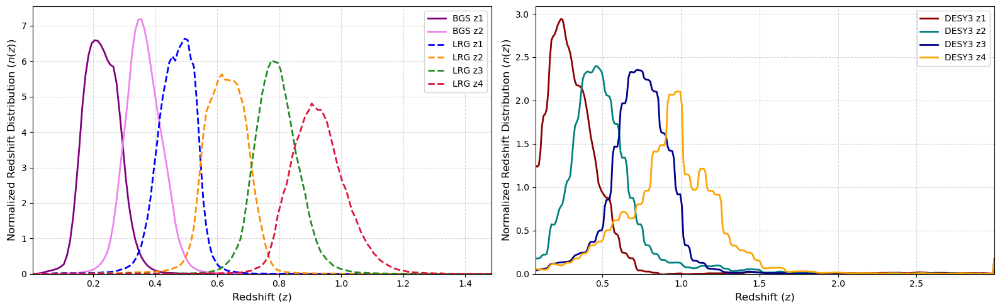

In [9]:
# plot all bins together

des_colors = ["darkred", "teal", "darkblue", "orange"]

# --- Figure setup: 1 row, 2 columns ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

# Left Subplot: BGS & LRG Bins
z_master = BGS_LRG_distributions[:, 0]

ax1.plot(
    z_master,
    BGS_LRG_distributions[:, 1],
    label="BGS z1",
    color="purple",
    lw=2,
)
ax1.plot(
    z_master,
    BGS_LRG_distributions[:, 2],
    label="BGS z2",
    color="violet",
    lw=2,
)

lrg_colors = ["blue", "darkorange", "forestgreen", "crimson"]
for i in range(1, 5):
    ax1.plot(
        z_master,
        BGS_LRG_distributions[:, i + 2],
        label=f"LRG z{i}",
        color=lrg_colors[i - 1],
        lw=2,
        linestyle="--",
    )

ax1.set_xlabel("Redshift (z)", fontsize=12)
ax1.set_ylabel("Normalized Redshift Distribution ($n(z)$)", fontsize=12)
ax1.set_xlim(z_master.min(), z_master.max())
ax1.set_ylim(bottom=0)
ax1.grid(True, linestyle="--", alpha=0.5)
ax1.legend(fontsize=10, loc="upper right", frameon=True)

# Right Subplot: DES Source Bins
for i, (nz_norm, color) in enumerate(zip(des_bins_norm, des_colors), start=1):
    ax2.plot(
        DES_source_z,
        nz_norm,
        label=f"DESY3 z{i}",
        color=color,
        lw=2,
    )

ax2.set_xlabel("Redshift (z)", fontsize=12)
ax2.set_ylabel("Normalized Redshift Distribution ($n(z)$)", fontsize=12)
ax2.set_xlim(DES_source_z.min(), DES_source_z.max())
ax2.set_ylim(bottom=0)
ax2.grid(True, linestyle="--", alpha=0.5)
ax2.legend(fontsize=10, loc="upper right", frameon=True)

plt.tight_layout()
plt.show()

[1.02326265e-09]


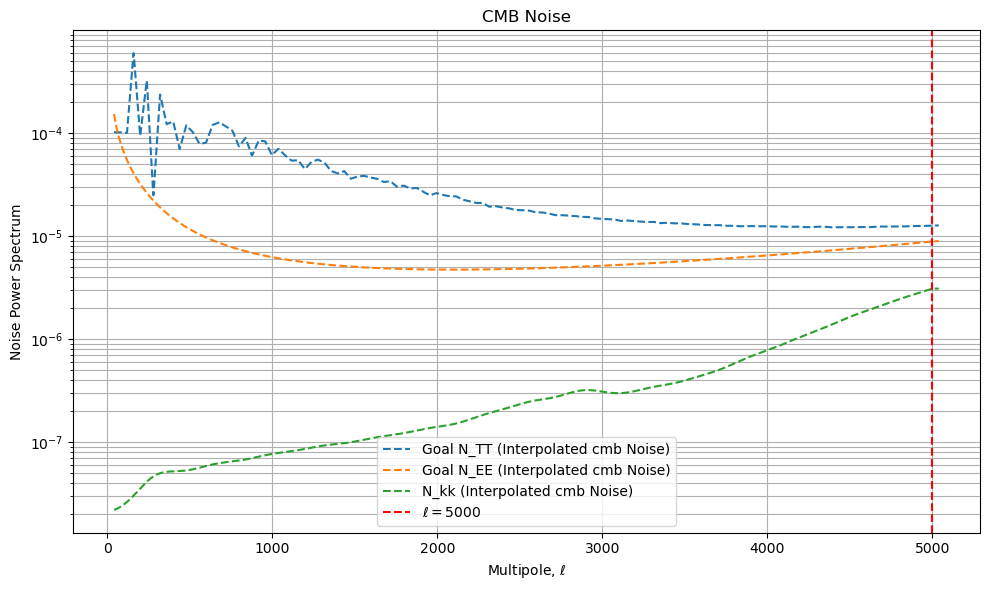

In [10]:
# build noise magnification
# BGS shot noise ref: 
# LRG shot noise ref: https://arxiv.org/pdf/2407.04607
# DES noise ref: https://arxiv.org/html/2511.04681v2
# HSC noise ref: https://arxiv.org/pdf/2507.01386
# SO noise ref:
# magnification ref: https://arxiv.org/pdf/2503.24385

sigma = 0.26
LRG_n_bar_deg2 = np.array([81.9, 148.1, 162.4, 148.3]) # Galaxies per square degree
LRG_n_bar_steradian = LRG_n_bar_deg2 * (180.0 / np.pi)**2
HSC_n_bar_arcmin2 = np.array([3.77, 5.07, 4.00, 2.12])
HSC_n_bar_deg2 = HSC_n_bar_arcmin2 * (60 ** 2)
HSC_n_bar_steradian = HSC_n_bar_deg2 * (180.0 / np.pi)**2
DES_n_bar_arcmin2 = np.array([5.59, 5.59, 5.59, 5.59])
DES_n_bar_deg2 = DES_n_bar_arcmin2 * (60 ** 2)
DES_n_bar_steradian = DES_n_bar_deg2 * (180.0 / np.pi)**2
BGS_shot_noise = [4.63e-7, 9.18e-7]
BGS_shot_noise_bin1 = [4.63e-7]
LRG_shot_noise = [4.07e-6, 2.25e-6, 2.05e-6, 2.25e-6]
LRG_shot_noise_bin1 = [4.07e-6]
BGS_LRG_shot_noise = [4.63e-7, 9.18e-7, 4.07e-6, 2.25e-6, 2.05e-6, 2.25e-6]

HSC_shape_noise = np.zeros_like(HSC_n_bar_steradian)
for i in range(len(HSC_shape_noise)):
    HSC_shape_noise[i] = sigma ** 2 / HSC_n_bar_steradian[i]

DES_shape_noise = np.zeros_like(DES_n_bar_steradian)
for i in range(len(DES_shape_noise)):
    DES_shape_noise[i] = sigma ** 2 / DES_n_bar_steradian[i]
DES_shape_noise_bin1 = np.array([DES_shape_noise[0]])
print(DES_shape_noise_bin1)

# cmb noise arises from idk a bunch of stuff
# we have an SO noise curve, but it does not have precisely the same ells as our C_l
# we must interpolate the N_kk to produce a useful noise curve
SO_goal_T_noise_data = np.loadtxt("data/SO_LAT_Nell_T_atmv1_goal_fsky0p4_ILC_CMB.txt")
SO_goal_T_noise_ells = SO_goal_T_noise_data[:, 0]
SO_goal_N_TT = SO_goal_T_noise_data[:, 1]
SO_goal_E_noise_data = np.loadtxt("data/SO_LAT_Nell_P_goal_fsky0p4_ILC_CMB_E.txt")
SO_goal_E_noise_ells = SO_goal_E_noise_data[:, 0]
SO_goal_N_EE = SO_goal_E_noise_data[:, 1]
SO_kk_noise_data = np.genfromtxt("data/nlkk_v3_1_0deproj0_SENS2_fsky0p4_it_lT30-3000_lP30-5000.dat")
SO_kk_noise_ells = SO_kk_noise_data[:, 0]
SO_N_kk = SO_kk_noise_data[:, 7]
ells_for_noise_interp = np.arange(40, 5000 + 40)
min1000_ells_for_noise_interp = np.arange(1000, 4000 + 1000)
min2000_ells_for_noise_interp = np.arange(2000, 3000 + 2000)
max2040_ells_for_noise_interp = np.arange(40, 2040)

# Use fill_value=(N_kk[0], N_kk[-1]) to cap the noise at the boundaries
interpolated_goal_N_TT_func = interp1d(SO_goal_T_noise_ells, SO_goal_N_TT, bounds_error=False, fill_value=(SO_goal_N_TT[0], SO_goal_N_TT[-1]))
SO_goal_cmb_noise_TT = interpolated_goal_N_TT_func(ells_for_noise_interp)
interpolated_goal_N_EE_func = interp1d(SO_goal_E_noise_ells, SO_goal_N_EE, bounds_error=False, fill_value=(SO_goal_N_EE[0], SO_goal_N_EE[-1]))
SO_goal_cmb_noise_EE = interpolated_goal_N_EE_func(ells_for_noise_interp)
interpolated_N_kk_func = interp1d(SO_kk_noise_ells, SO_N_kk, bounds_error=False, fill_value=(SO_N_kk[0], SO_N_kk[-1]))
SO_cmb_noise_kk = interpolated_N_kk_func(ells_for_noise_interp)
min1000_SO_cmb_noise_kk = interpolated_N_kk_func(min1000_ells_for_noise_interp)
min2000_SO_cmb_noise_kk = interpolated_N_kk_func(min2000_ells_for_noise_interp)
max2040_SO_cmb_noise_kk = interpolated_N_kk_func(max2040_ells_for_noise_interp)

# plot cmb noise to see what it looks like
plt.figure(figsize=(10, 6))
plt.semilogy(ells_for_noise_interp, SO_goal_cmb_noise_TT, label='Goal N_TT (Interpolated cmb Noise)', linestyle='--')
plt.semilogy(ells_for_noise_interp, SO_goal_cmb_noise_EE, label='Goal N_EE (Interpolated cmb Noise)', linestyle='--')
plt.semilogy(ells_for_noise_interp, SO_cmb_noise_kk, label='N_kk (Interpolated cmb Noise)', linestyle='--')
plt.xlabel('Multipole, $\ell$')
plt.ylabel('Noise Power Spectrum')
plt.title('CMB Noise')
plt.axvline(x=5000, color='red', linestyle='--', label='$\ell = 5000$') # Added vertical line
plt.legend()
plt.grid(True, which="both", ls="-")
plt.tight_layout()
plt.show()

# save
data_dir = "data"
np.save(os.path.join(data_dir, "BGS_shot_noise.npy"), BGS_shot_noise)
np.save(os.path.join(data_dir, "BGS_shot_noise_bin1.npy"), BGS_shot_noise_bin1)
np.save(os.path.join(data_dir, "LRG_shot_noise.npy"), LRG_shot_noise)
np.save(os.path.join(data_dir, "LRG_shot_noise_bin1.npy"), LRG_shot_noise_bin1)
np.save(os.path.join(data_dir, "BGS_LRG_shot_noise.npy"), BGS_LRG_shot_noise)
np.save(os.path.join(data_dir, "HSC_shape_noise.npy"), HSC_shape_noise)
np.save(os.path.join(data_dir, "DES_shape_noise.npy"), DES_shape_noise)
np.save(os.path.join(data_dir, "DES_shape_noise_bin1.npy"), DES_shape_noise_bin1)
np.save(os.path.join(data_dir, "SO_goal_cmb_noise_TT.npy"), SO_goal_cmb_noise_TT)
np.save(os.path.join(data_dir, "SO_goal_cmb_noise_EE.npy"), SO_goal_cmb_noise_EE)
np.save(os.path.join(data_dir, "SO_cmb_noise_kk.npy"), SO_cmb_noise_kk)

# Fisher

Notes 
- covariances for primaries only look fine
- covariances for lensing ratios for binsize 100 have negative values on the diagonal -- MAJOR ISSUE
- covariances for lensing ratios generally have diagonal values increase linearly with binsize, so that constraints increase with sqrt(bin size)
- I have no idea why this is yet

## Plots

Lensing Ratios
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=100.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=5.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
5          | 4.6098e+07     | 52.4926      | OK
10         | 5.3299e+06     | 46.7005      | OK
20         | 4.5720e+06     | 43.1230      | OK
50         | 4.4820e+06     | 39.5860      | OK
100        | 3.5748e+09     | 56.6370      | OK


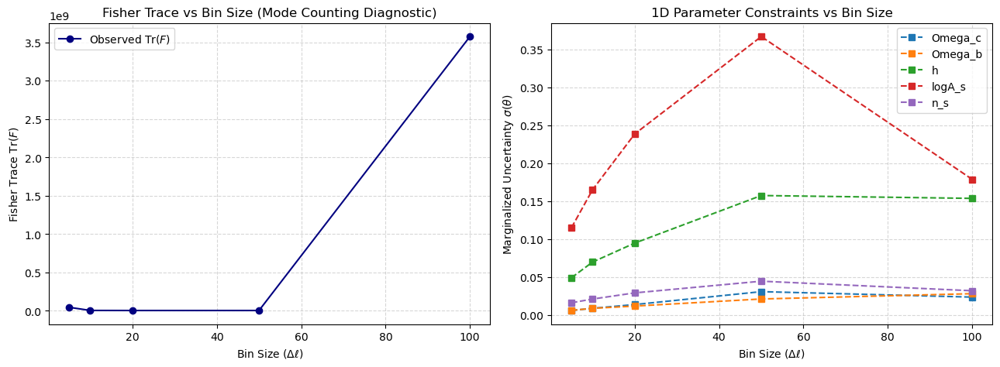

Primaries
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=100.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
10         | 3.9774e+08     | 73.7761      | OK
20         | 3.9635e+08     | 73.7482      | OK
50         | 3.8765e+08     | 73.5694      | OK
100        | 3.6402e+08     | 73.0291      | OK


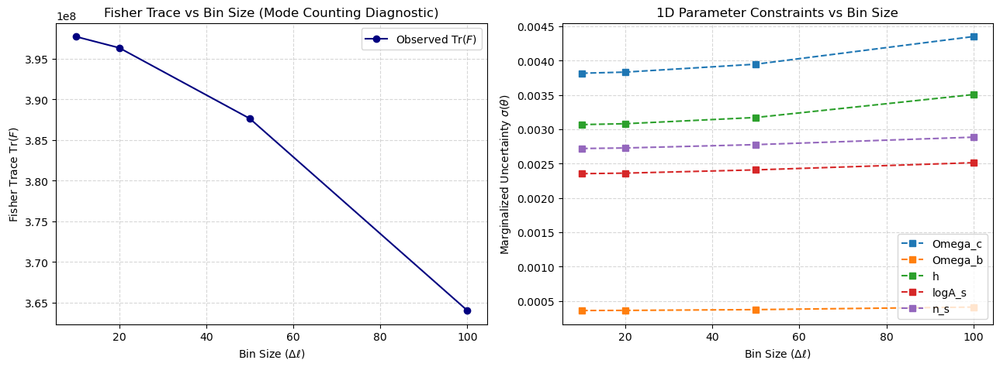

Lensing Ratios and Primaries
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=100.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
10         | 4.0307e+08     | 76.5242      | OK
20         | 4.0092e+08     | 76.1042      | OK
50         | 3.9208e+08     | 75.9202      | OK
100        | 3.6832e+08     | 75.5023      | OK


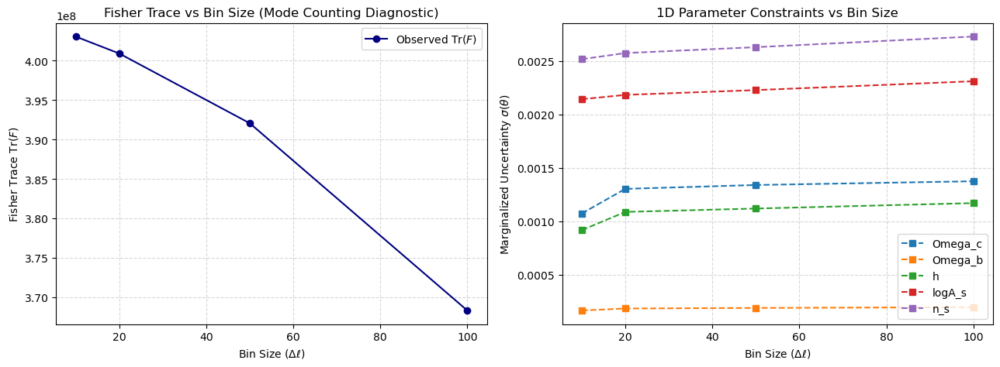

In [31]:
# --- Run Diagnostic ---

# lensing ratios
print("Lensing Ratios")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

# primaries
print("Primaries")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

# primaries and ratios
print("Lensing Ratios and Primaries")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

LR
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=100.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=5.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
5          | 4.6098e+07     | 52.4926      | OK
10         | 5.2397e+06     | 46.5399      | OK
20         | 4.5689e+06     | 43.0305      | OK
50         | 4.4868e+06     | 39.6507      | OK
100        | 3.5748e+09     | 56.6370      | OK


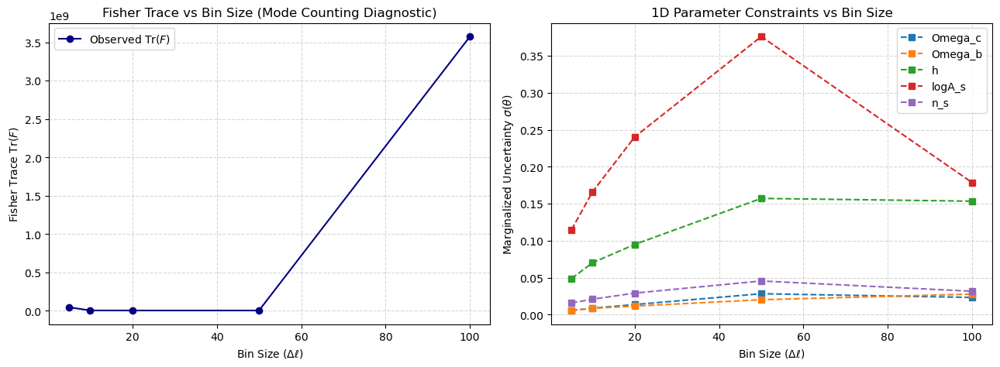

CG
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CG_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CG_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CG_Photo_BGS_DESY3_Binsize=5.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CG_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
5          | 8.3397e+05     | 38.1652      | OK
10         | 8.0395e+05     | 36.1209      | OK
20         | 7.8976e+05     | 34.5950      | OK
50         | 7.7962e+05     | 32.3558      | OK


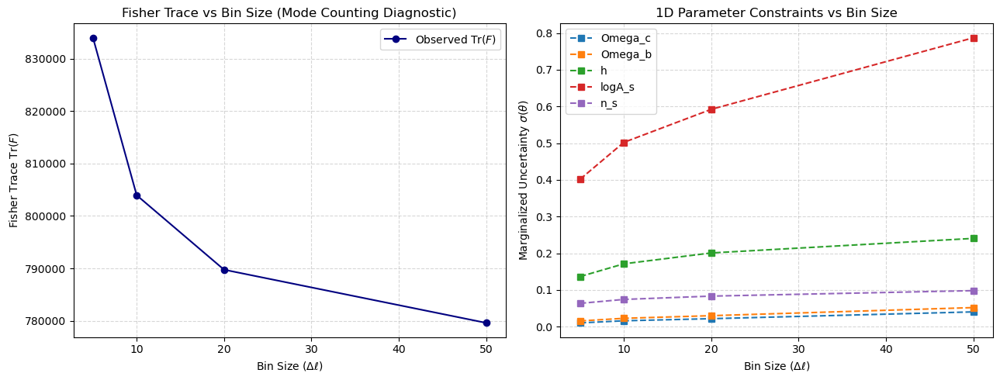

GL
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_GL_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_GL_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_GL_Photo_BGS_DESY3_Binsize=5.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_GL_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
5          | 4.5118e+06     | 45.3774      | OK
10         | 4.4007e+06     | 43.3019      | OK
20         | 4.3450e+06     | 41.4757      | OK
50         | 4.3055e+06     | 39.2307      | OK


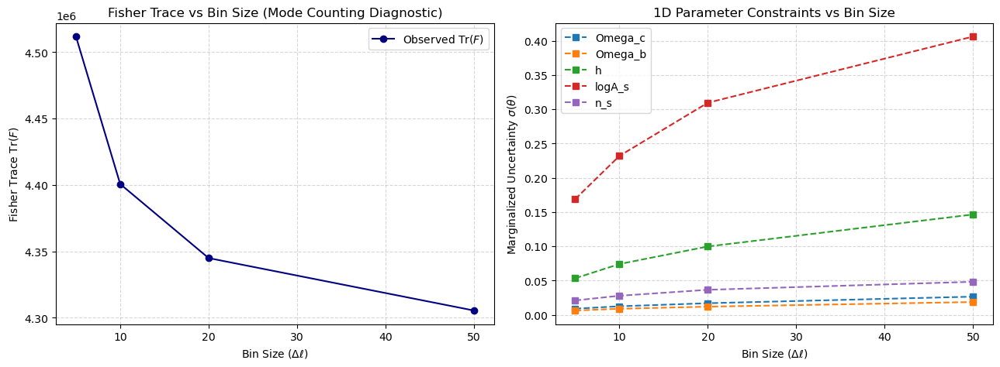

In [32]:
# --- Run Diagnostic ---

# lensing ratios
print("LR")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

# CG
print("CG")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_CG_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

# GL
print("GL")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_GL_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

CC
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=5.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
5          | 1.8944e+06     | 32.8448      | OK
10         | 1.8919e+06     | 32.1538      | OK
20         | 1.8897e+06     | 31.5165      | OK
50         | 1.8877e+06     | 30.7088      | OK


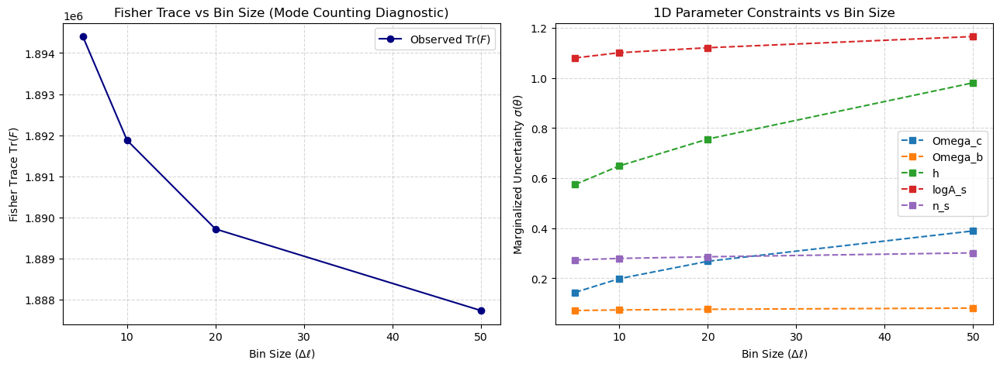

GG
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_GG_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_GG_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_GG_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
10         | 1.0843e+08     | 58.5176      | OK
20         | 1.0778e+08     | 56.9722      | OK
50         | 1.0722e+08     | 55.0040      | OK


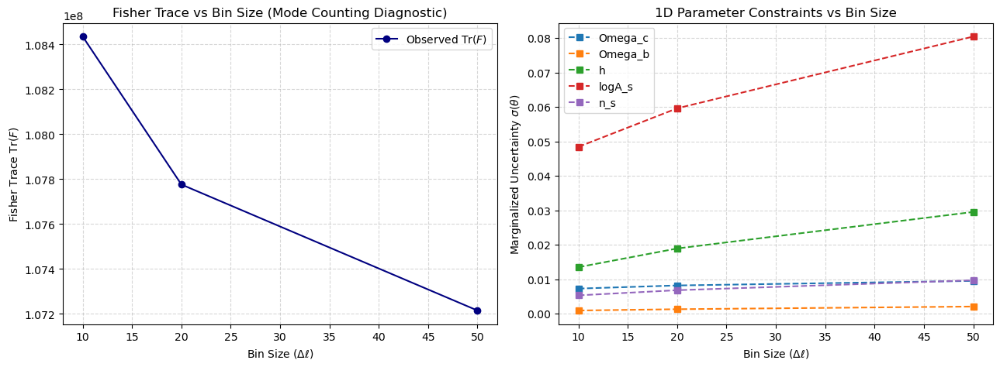

LL
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LL_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LL_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LL_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
10         | 8.3779e+06     | 43.6809      | OK
20         | 8.3479e+06     | 42.3650      | OK
50         | 8.3121e+06     | 41.1171      | OK


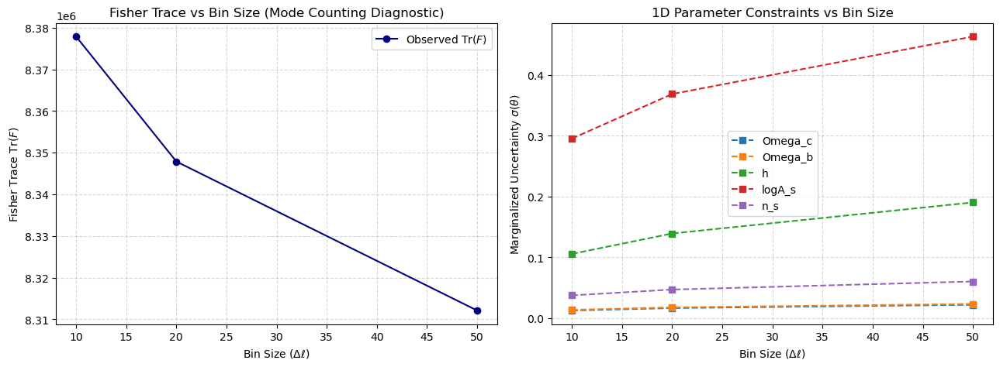

In [18]:
# --- Run Diagnostic ---
# lensing ratios
print("CC")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

# primaries
print("GG")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_GG_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

# primaries
print("LL")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_LL_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

standard CC with PyCCL
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=5.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
5          | 1.8944e+06     | 32.8448      | OK
10         | 1.8919e+06     | 32.1538      | OK
20         | 1.8897e+06     | 31.5165      | OK
50         | 1.8877e+06     | 30.7088      | OK


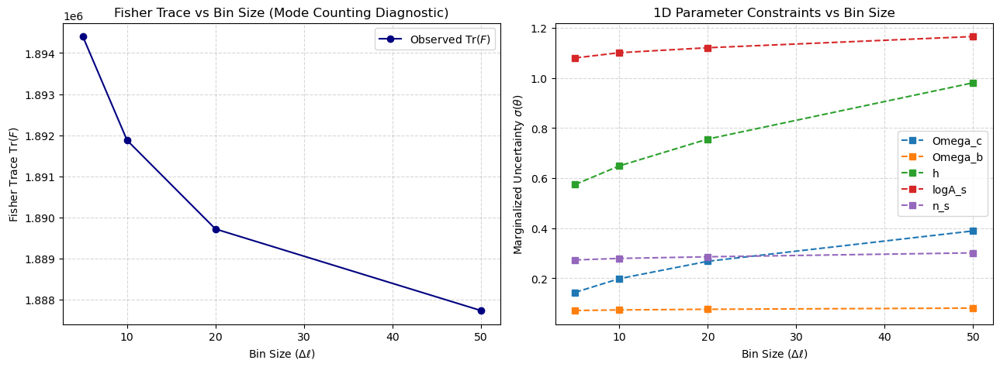

CC with PyCCL post-scaled weighting
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_post_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_post_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_post_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
10         | 1.8921e+06     | 32.1569      | OK
20         | 1.8907e+06     | 31.5291      | OK
50         | 1.8877e+06     | 30.7088      | OK


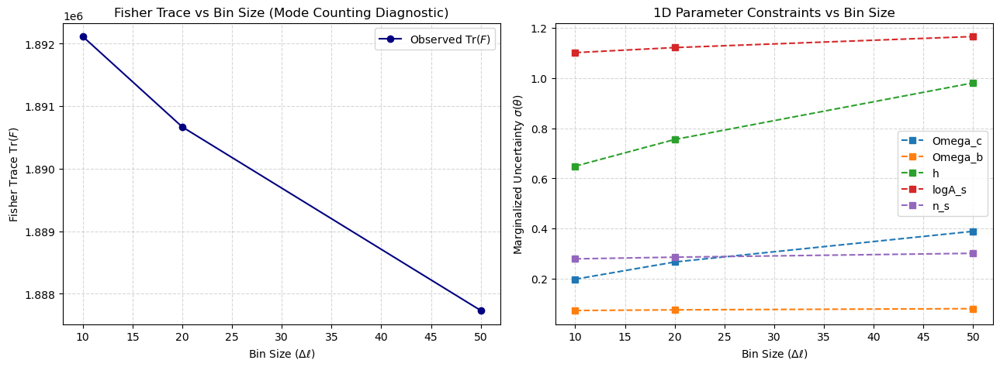

CC with CAMB
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_CAMB_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_CAMB_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_CAMB_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
10         | 1.8921e+06     | 32.1569      | OK
20         | 1.8907e+06     | 31.5291      | OK
50         | 1.8877e+06     | 30.7088      | OK


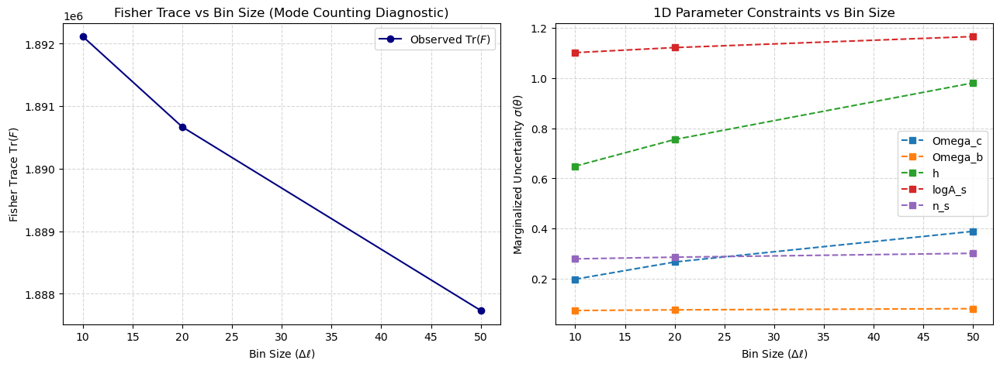

In [13]:
# --- Run Diagnostic ---

#standard CC
print("standard CC with PyCCL")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")
    
# CC post weighting
print("CC with PyCCL post-scaled weighting")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_post_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

# CC with CAMB
print("CC with CAMB")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_CAMB_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

Lensing Ratios
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=100.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=5.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
5          | 4.6098e+07     | 52.4926      | OK
10         | 5.2397e+06     | 46.5399      | OK
20         | 4.5689e+06     | 43.0305      | OK
50         | 4.4868e+06     | 39.6507      | OK
100        | 3.5748e+09     | 56.6370      | OK


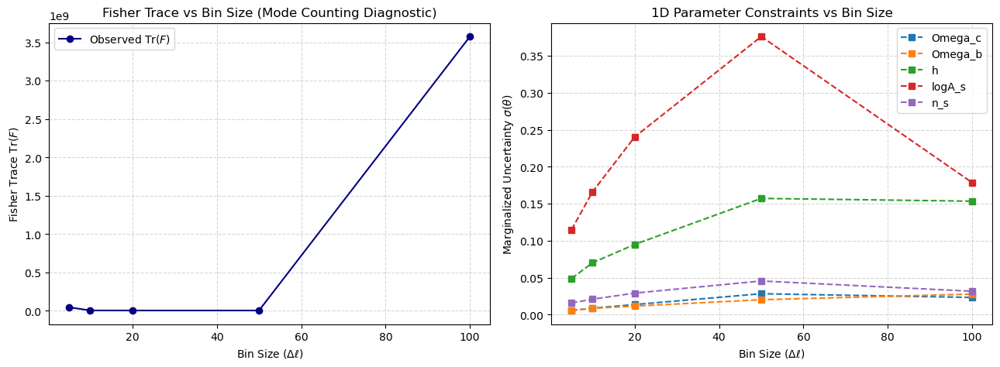

Lensing Ratios l_min = 1000
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY3_Binsize=100.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
10         | 3.1274e+06     | 39.7612      | OK
20         | 3.1016e+06     | 37.7398      | OK
50         | 3.0862e+06     | 35.0854      | OK
100        | 3.0808e+06     | 33.3912      | OK


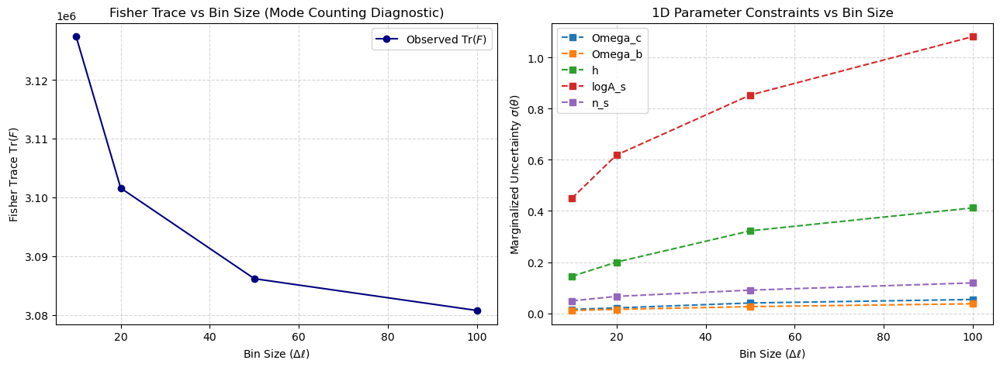

Lensing Ratios l_min = 2000
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY3_Binsize=100.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
10         | 1.3936e+06     | 26.8051      | OK
20         | 1.3881e+06     | 24.9769      | OK
50         | 1.3847e+06     | 22.9123      | OK
100        | 1.3834e+06     | 21.5359      | OK


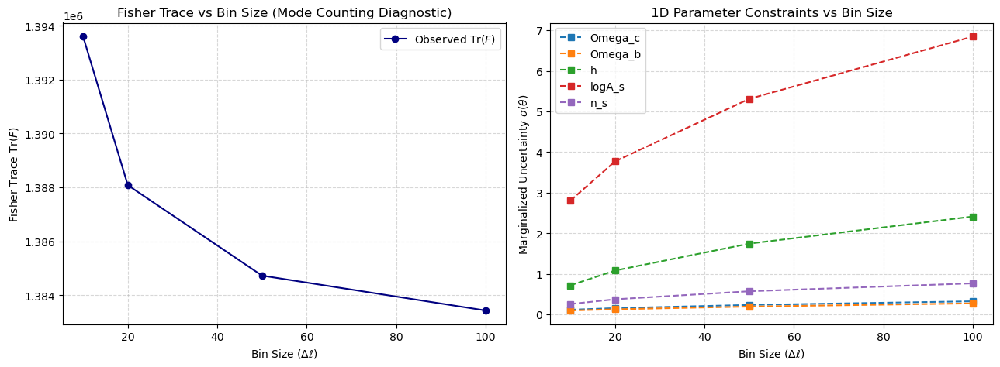

Lensing Ratios l_min = 40, l_max = 2040
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY3_Binsize=100.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
10         | 3.8889e+06     | 45.3455      | OK
20         | 3.2234e+06     | 41.7628      | OK
50         | 3.1446e+06     | 38.2367      | OK
100        | 3.5735e+09     | 55.5729      | OK


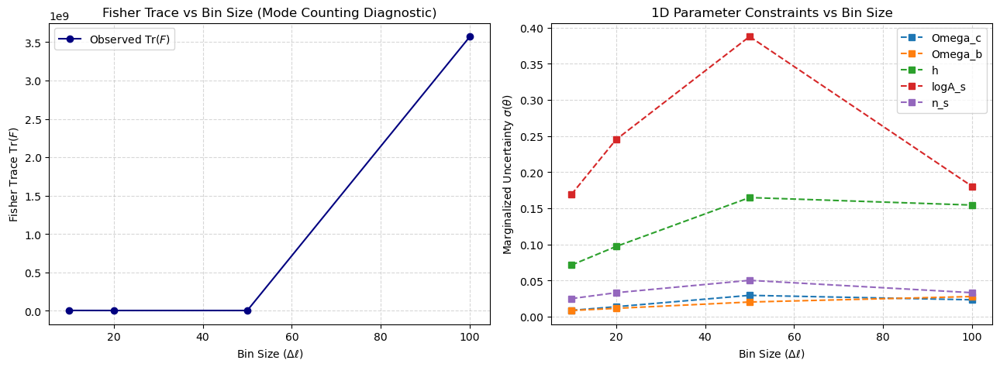

Primaries
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=10.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=100.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=20.txt
Filepath:  Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=50.txt
Bin Size   | Trace F        | log det(F)   | Status
----------------------------------------------------
10         | 3.9774e+08     | 73.7761      | OK
20         | 3.9635e+08     | 73.7482      | OK
50         | 3.8765e+08     | 73.5694      | OK
100        | 3.6402e+08     | 73.0291      | OK


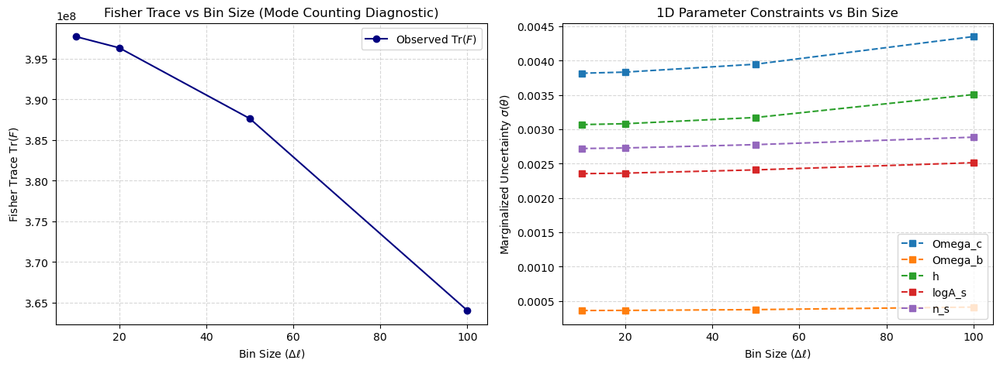

In [40]:
# --- Run Diagnostic ---

# lensing ratios
print("Lensing Ratios")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

print("Lensing Ratios l_min = 1000")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

print("Lensing Ratios l_min = 2000")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

print("Lensing Ratios l_min = 40, l_max = 2040")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

# primaries
print("Primaries")
fisher_dict, param_names_dict = load_txt_fisher_matrices(
    "Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=*.txt"
)

if fisher_dict:
    res = analyze_fisher_matrices(fisher_dict)
    first_b = list(param_names_dict.keys())[0]
    plot_fisher_diagnostics(res, param_names=param_names_dict.get(first_b))
else:
    print("No matching Fisher text files found in the specified path.")

## CC -- with CAMB

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_cc_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.39^{+0.12}_{-0.18}$ | $\Omega_m = 0.39^{+0.27}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.532$ | $\Omega_m = \Omega_\mathrm{m} < 1.13$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.55^{+0.18}_{-0.33}$ | $h = 0.55^{+0.36}_{-0.35}$ |
|  | Fisher Forecast (No Priors) | $h = 0.69\pm 0.98$ | $h = 0.7^{+1.9}_{-1.9}$ |
| --- | --- | --- | --- |

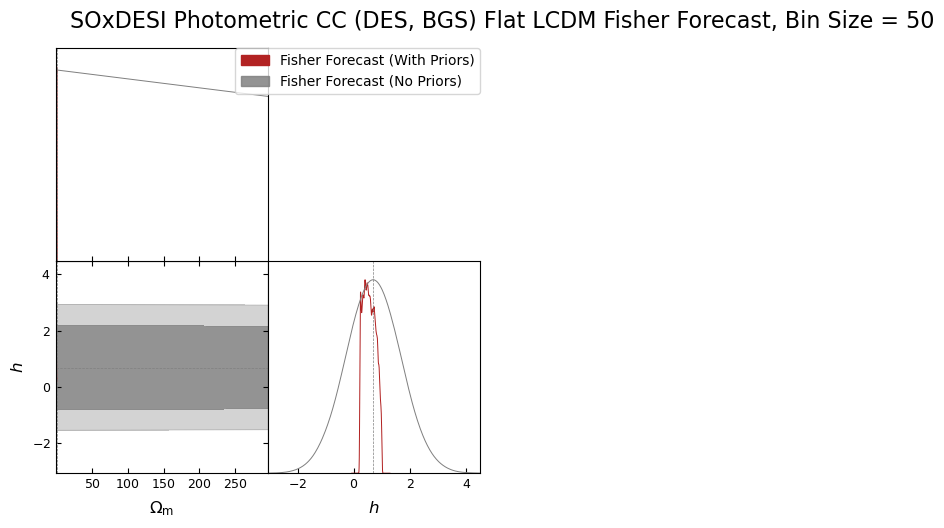

total_time:  0:00:37.700053


In [16]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CC'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_CAMB_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_CC_CAMB_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric CC (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_cc_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.38^{+0.11}_{-0.18}$ | $\Omega_m = 0.38^{+0.26}_{-0.24}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.467$ | $\Omega_m = \Omega_\mathrm{m} < 0.913$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.57^{+0.20}_{-0.27}$ | $h = 0.57^{+0.36}_{-0.36}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.75$ | $h = 0.7^{+1.5}_{-1.5}$ |
| --- | --- | --- | --- |

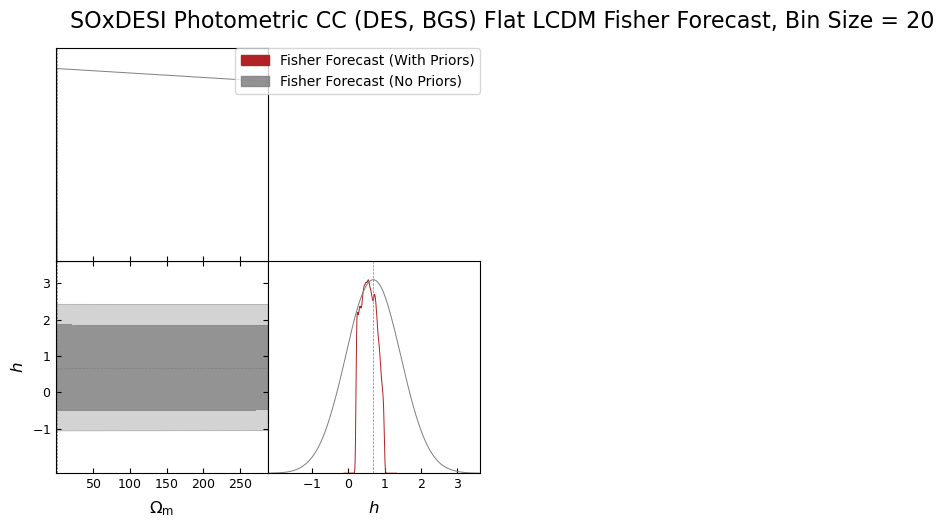

total_time:  0:00:50.685871


In [17]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CC'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_CAMB_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_CC_CAMB_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric CC (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_cc_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.37^{+0.11}_{-0.16}$ | $\Omega_m = 0.37^{+0.24}_{-0.23}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.431$ | $\Omega_m = \Omega_\mathrm{m} < 0.777$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.58\pm 0.20$ | $h = 0.58^{+0.35}_{-0.36}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.65$ | $h = 0.7^{+1.3}_{-1.3}$ |
| --- | --- | --- | --- |

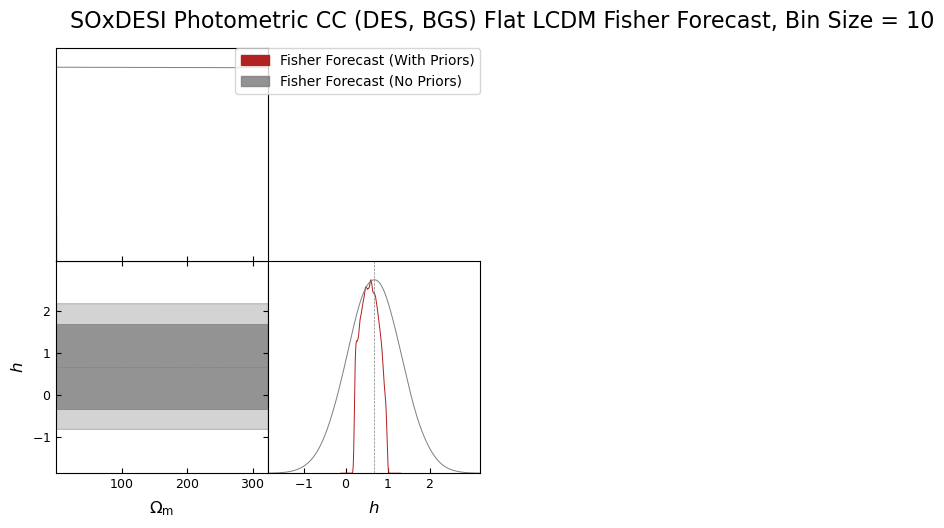

total_time:  0:01:24.100530


In [18]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CC'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_CAMB_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_CC_CAMB_Photo_BGS_DESY5_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric CC (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

## CC

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_cc_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.39^{+0.12}_{-0.18}$ | $\Omega_m = 0.39^{+0.27}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.531$ | $\Omega_m = \Omega_\mathrm{m} < 1.13$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.55^{+0.14}_{-0.33}$ | $h = 0.55^{+0.37}_{-0.35}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.98$ | $h = 0.7^{+1.9}_{-1.9}$ |
| --- | --- | --- | --- |

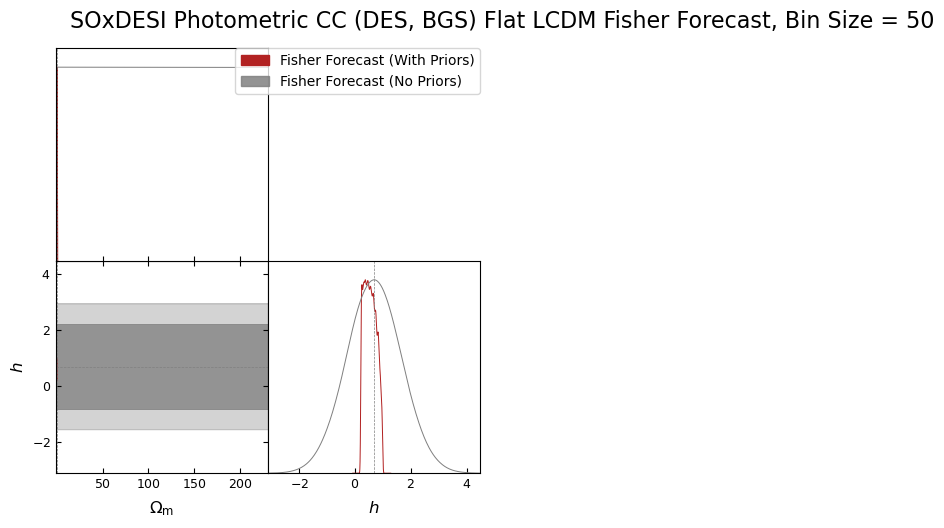

total_time:  0:00:43.737738


In [14]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CC'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/plot_Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/plot_Flat_LCDM_CC_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric CC (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

In [13]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CC'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/no_plot_Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/no_plot_Flat_LCDM_CC_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
total_time:  0:00:31.429085


Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_cc_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.38^{+0.12}_{-0.17}$ | $\Omega_m = 0.38^{+0.26}_{-0.24}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.469$ | $\Omega_m = \Omega_\mathrm{m} < 0.915$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.56^{+0.20}_{-0.32}$ | $h = 0.56^{+0.36}_{-0.35}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.76$ | $h = 0.7^{+1.5}_{-1.5}$ |
| --- | --- | --- | --- |

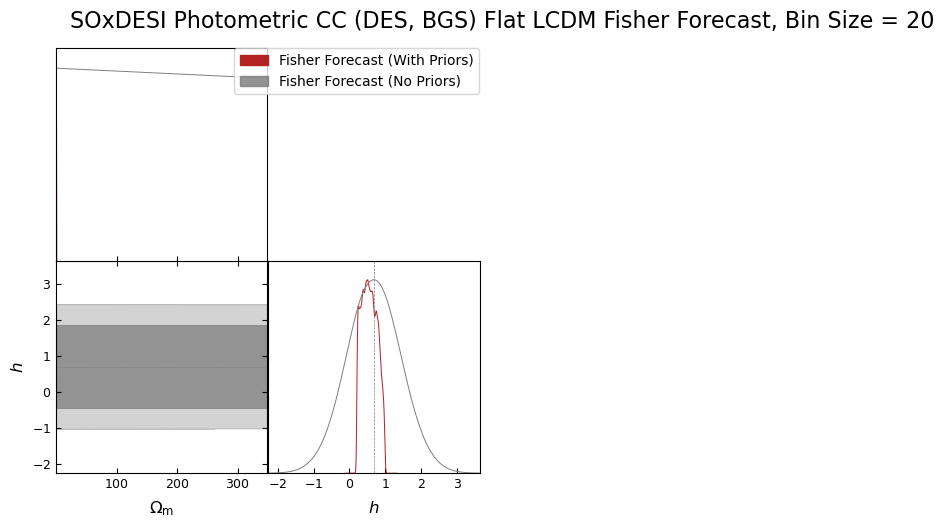

total_time:  0:01:02.435087


In [14]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CC'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_CC_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric CC (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_cc_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.37^{+0.11}_{-0.16}$ | $\Omega_m = 0.37^{+0.25}_{-0.23}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.430$ | $\Omega_m = \Omega_\mathrm{m} < 0.780$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.58\pm 0.21$ | $h = 0.58^{+0.35}_{-0.36}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.65$ | $h = 0.7^{+1.3}_{-1.3}$ |
| --- | --- | --- | --- |

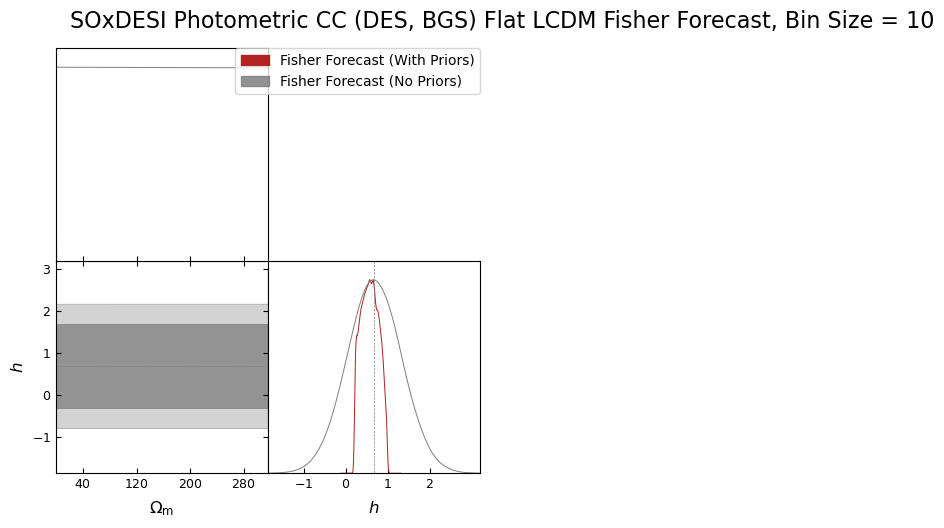

total_time:  0:01:32.291465


In [15]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CC'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_CC_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_CC_Photo_BGS_DESY5_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric CC (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

## GG

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_gg_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0099$ | $\Omega_m = 0.303^{+0.019}_{-0.019}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0099$ | $\Omega_m = 0.303^{+0.019}_{-0.020}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.682\pm 0.030$ | $h = 0.682^{+0.058}_{-0.058}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.029$ | $h = 0.682^{+0.058}_{-0.058}$ |
| --- | --- | --- | --- |

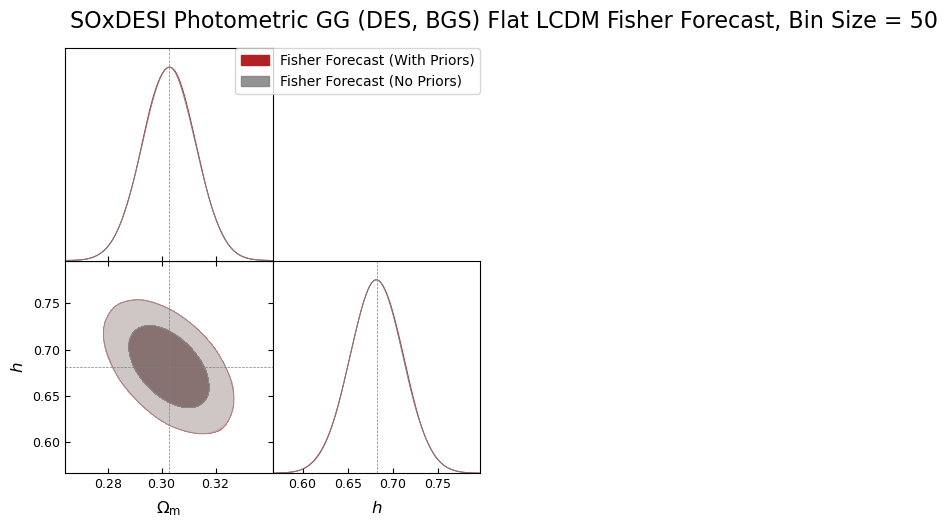

total_time:  0:00:45.278834


In [18]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['GG'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_GG_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_GG_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric GG (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_gg_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3026\pm 0.0084$ | $\Omega_m = 0.303^{+0.016}_{-0.017}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0084$ | $\Omega_m = 0.303^{+0.016}_{-0.016}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.682\pm 0.019$ | $h = 0.682^{+0.037}_{-0.037}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.019$ | $h = 0.682^{+0.037}_{-0.037}$ |
| --- | --- | --- | --- |

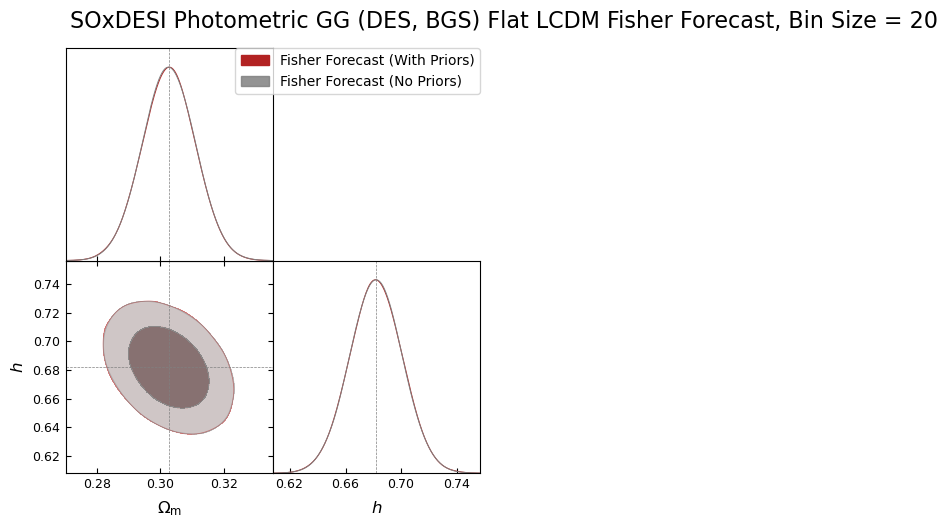

total_time:  0:01:01.474004


In [19]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['GG'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_GG_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_GG_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric GG (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_gg_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0074$ | $\Omega_m = 0.303^{+0.015}_{-0.014}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3026\pm 0.0074$ | $\Omega_m = 0.303^{+0.015}_{-0.015}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.682\pm 0.013$ | $h = 0.682^{+0.026}_{-0.026}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.014$ | $h = 0.682^{+0.026}_{-0.027}$ |
| --- | --- | --- | --- |

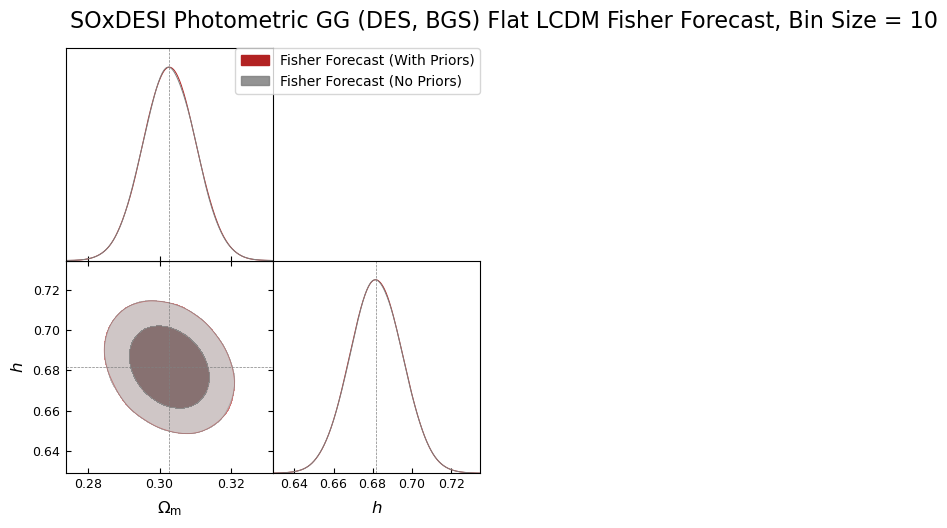

total_time:  0:01:38.211728


In [20]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['GG'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_GG_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_GG_Photo_BGS_DESY5_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric GG (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

## LL

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_ll_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.302\pm 0.012$ | $\Omega_m = 0.302^{+0.024}_{-0.024}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.309$ | $\Omega_m = \Omega_\mathrm{m} < 0.325$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.66^{+0.16}_{-0.13}$ | $h = 0.66^{+0.26}_{-0.27}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.19$ | $h = 0.68^{+0.38}_{-0.37}$ |
| --- | --- | --- | --- |

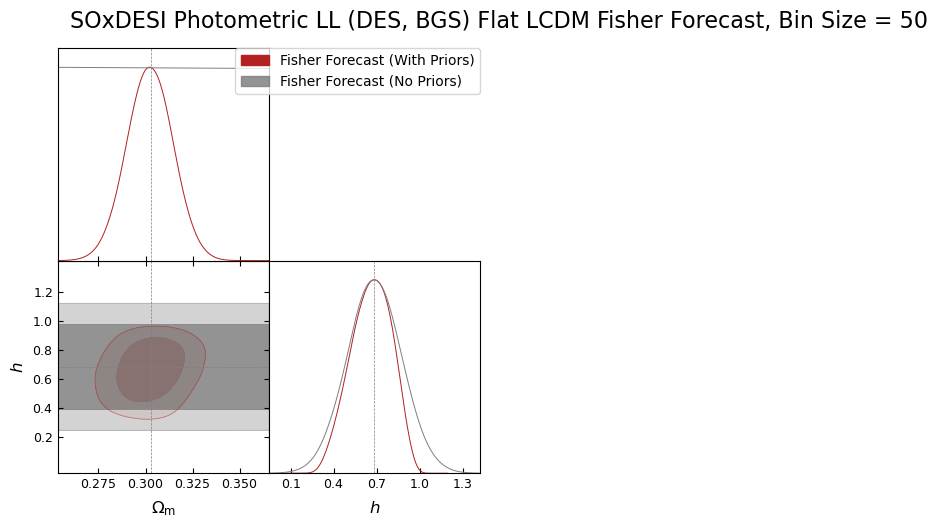

total_time:  0:00:50.563186


In [21]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['LL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LL_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LL_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric LL (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_ll_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.302\pm 0.011$ | $\Omega_m = 0.302^{+0.021}_{-0.021}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.303\pm 0.011$ | $\Omega_m = 0.303^{+0.021}_{-0.021}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.67^{+0.14}_{-0.11}$ | $h = 0.67^{+0.22}_{-0.23}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.14$ | $h = 0.68^{+0.27}_{-0.27}$ |
| --- | --- | --- | --- |

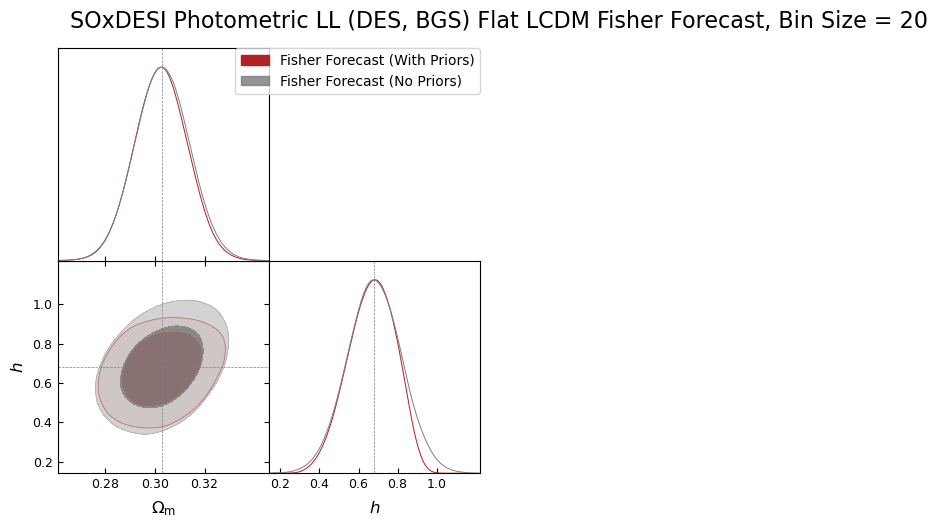

total_time:  0:01:20.373393


In [22]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['LL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LL_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LL_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric LL (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_ll_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3025\pm 0.0092$ | $\Omega_m = 0.303^{+0.018}_{-0.018}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0093$ | $\Omega_m = 0.303^{+0.018}_{-0.018}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.675^{+0.11}_{-0.095}$ | $h = 0.68^{+0.19}_{-0.19}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.11$ | $h = 0.68^{+0.21}_{-0.21}$ |
| --- | --- | --- | --- |

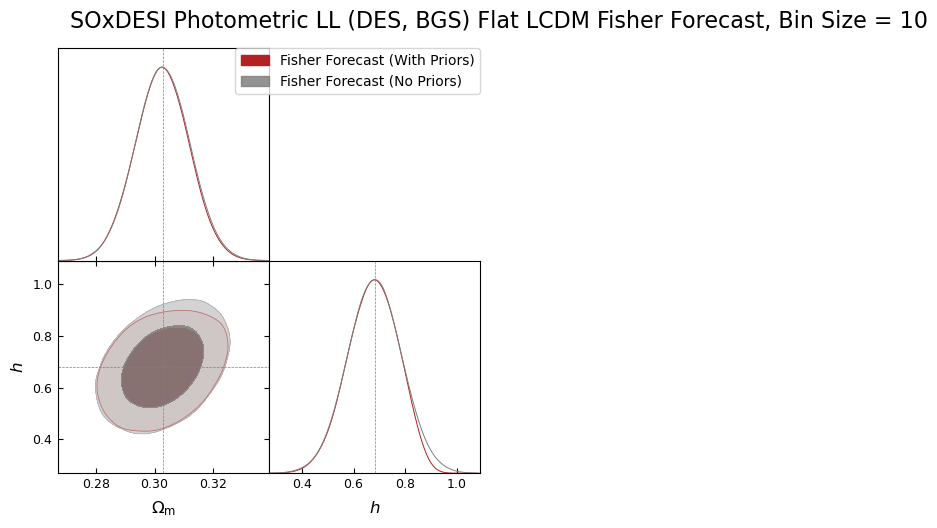

total_time:  0:01:47.549891


In [23]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['LL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LL_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LL_Photo_BGS_DESY5_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric LL (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

## TT

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_tt_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3026\pm 0.0075$ | $\Omega_m = 0.303^{+0.015}_{-0.015}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0074$ | $\Omega_m = 0.303^{+0.015}_{-0.015}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0056$ | $h = 0.682^{+0.011}_{-0.011}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0056$ | $h = 0.682^{+0.011}_{-0.011}$ |
| --- | --- | --- | --- |

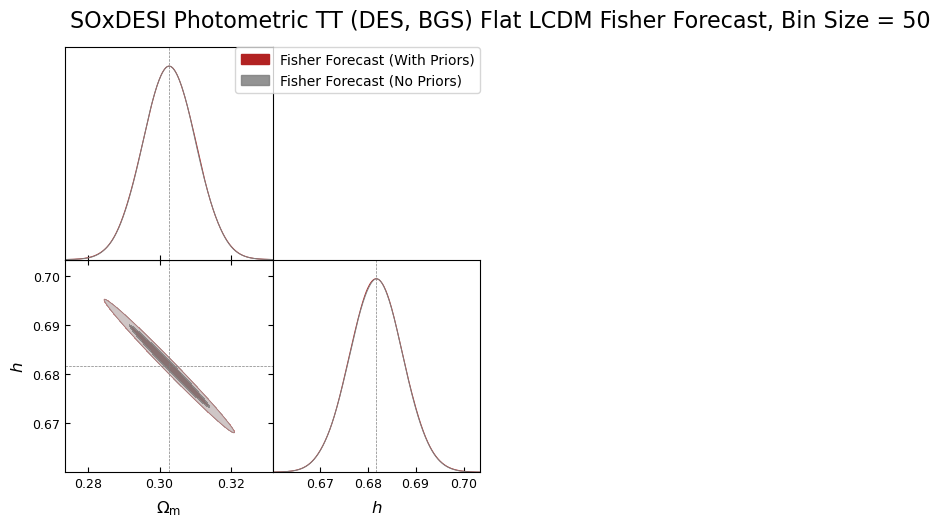

total_time:  0:01:07.806546


In [12]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_TT_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_TT_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric TT (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_tt_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0073$ | $\Omega_m = 0.303^{+0.014}_{-0.014}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0073$ | $\Omega_m = 0.303^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0055$ | $h = 0.682^{+0.011}_{-0.011}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0055$ | $h = 0.682^{+0.011}_{-0.011}$ |
| --- | --- | --- | --- |

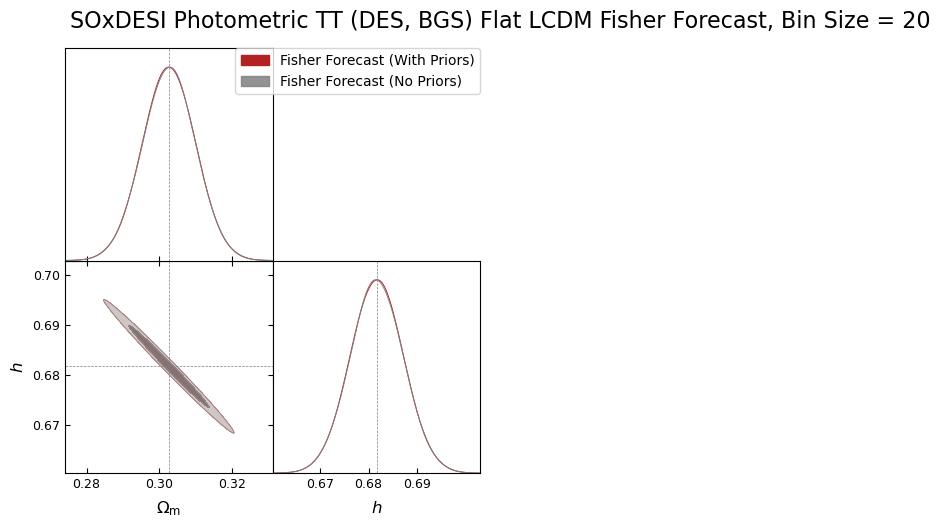

total_time:  0:01:54.185784


In [13]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_TT_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_TT_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric TT (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_tt_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0073$ | $\Omega_m = 0.303^{+0.014}_{-0.014}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3026\pm 0.0073$ | $\Omega_m = 0.303^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0054$ | $h = 0.682^{+0.011}_{-0.011}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0054$ | $h = 0.682^{+0.011}_{-0.011}$ |
| --- | --- | --- | --- |

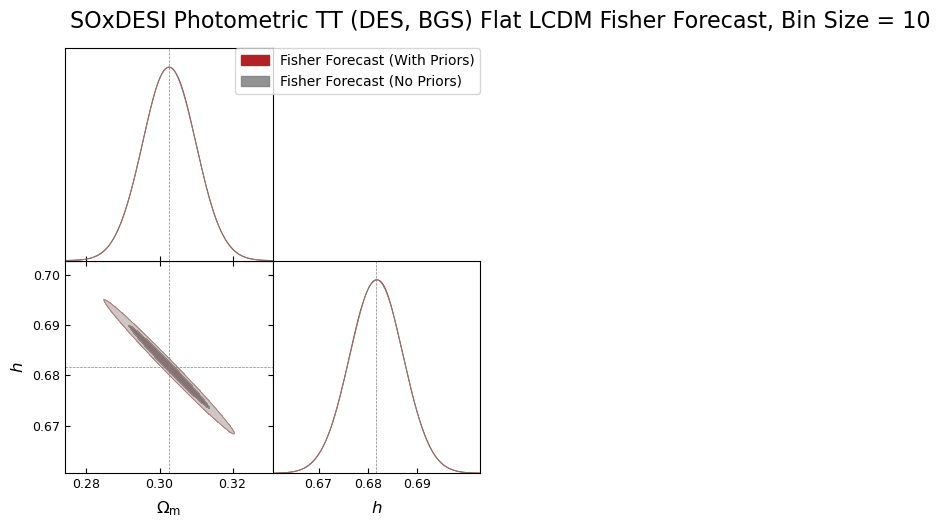

total_time:  0:03:14.868553


In [14]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_TT_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_TT_Photo_BGS_DESY5_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric TT (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

## Lensing Ratios - CG

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_cg_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.309\pm 0.030$ | $\Omega_m = 0.309^{+0.060}_{-0.057}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.320$ | $\Omega_m = \Omega_\mathrm{m} < 0.361$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.67^{+0.16}_{-0.14}$ | $h = 0.67^{+0.27}_{-0.29}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.24$ | $h = 0.68^{+0.47}_{-0.47}$ |
| --- | --- | --- | --- |

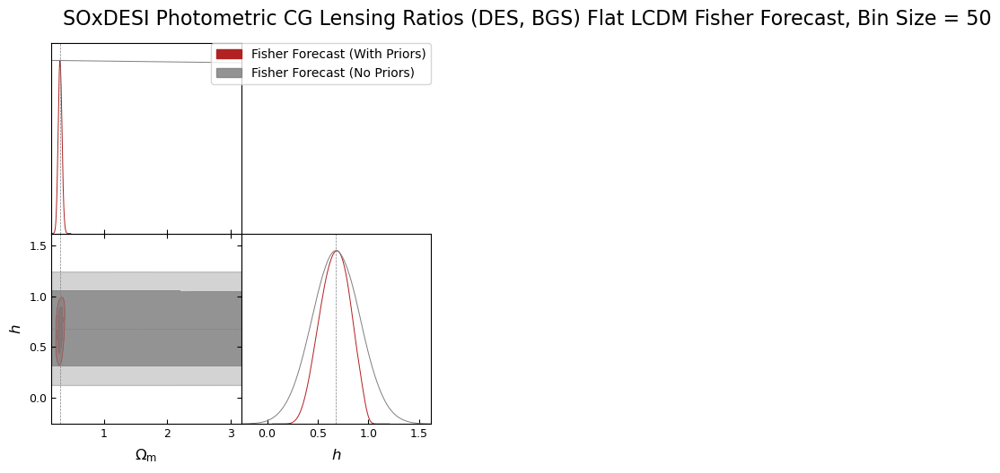

Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_lrg_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50_--_all_sampled_params_plotted.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.239^{+0.036}_{-0.031}$ | $\Omega_{c} = 0.239^{+0.062}_{-0.068}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.253\pm 0.041$ | $\Omega_{c} = 0.253^{+0.080}_{-0.080}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.069^{+0.017}_{-0.055}$ | $\Omega_{b} = 0.069^{+0.070}_{-0.058}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.048\pm 0.052$ | $\Omega_{b} = 0.05^{+0.10}_{-0.10}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.67^{+0.16}_{-0.14}$ | $h = 0.67^{+0.27}_{-0.28}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.24$ | $h = 0.68^{+0.47}_{-0.47}$ |
| --- | --- | --- | --- |
| **$logA_s$** | Fisher Forecast (With Priors) | $logA_s = 3.30\pm 0.49$ | $logA_s = 3.30^{+0.94}_{-0.90}$ |
|  | Fisher Forecast (No Priors) | $logA_s = 3.05\pm 0.78$ | $logA_s = 3.1^{+1.5}_{-1.5}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.992^{+0.043}_{-0.076}$ | $n_s = 0.992^{+0.092}_{-0.090}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.969\pm 0.098$ | $n_s = 0.97^{+0.19}_{-0.19}$ |
| --- | --- | --- | --- |

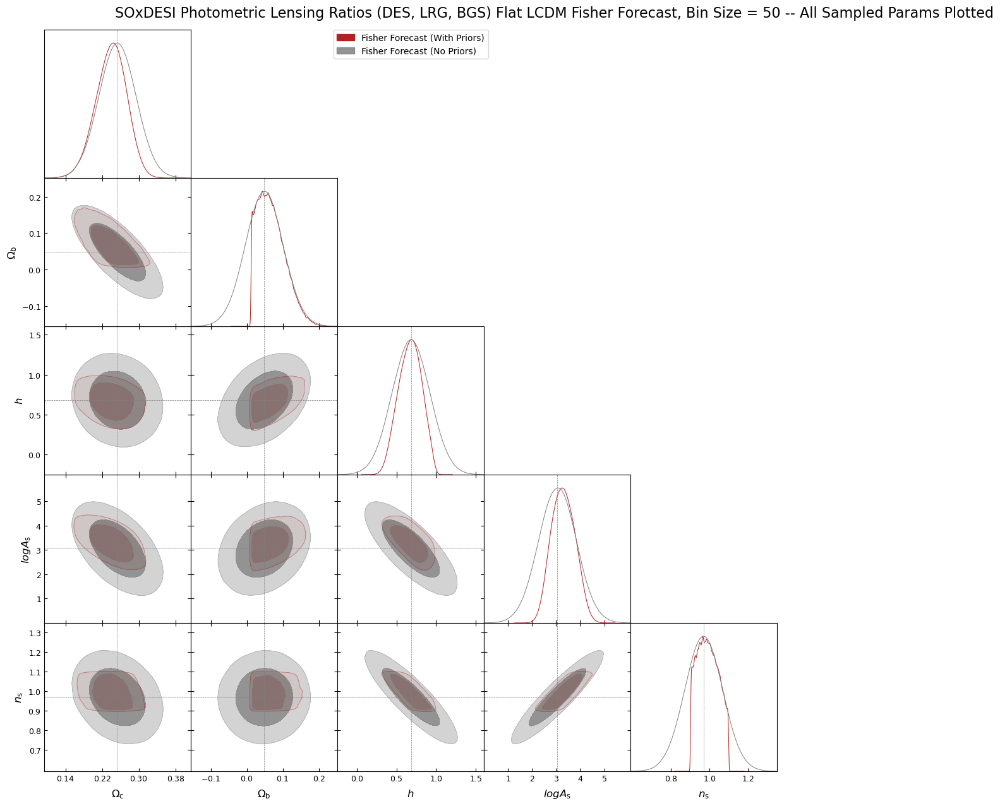

total_time:  0:00:40.897884


In [12]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_CG_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_CG_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric CG Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, LRG, BGS) Flat LCDM Fisher Forecast, Bin Size = 50 -- All Sampled Params Plotted",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_cg_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.306\pm 0.022$ | $\Omega_m = 0.306^{+0.045}_{-0.042}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.315$ | $\Omega_m = \Omega_\mathrm{m} < 0.344$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.65^{+0.15}_{-0.13}$ | $h = 0.65^{+0.25}_{-0.27}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.20$ | $h = 0.68^{+0.39}_{-0.39}$ |
| --- | --- | --- | --- |

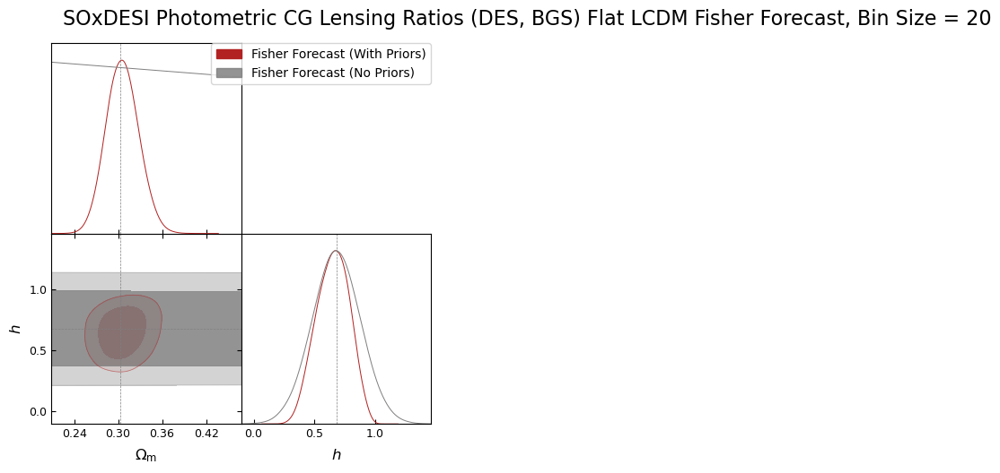

total_time:  0:00:49.126669


In [13]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_CG_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_CG_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric CG Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_cg_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.304\pm 0.017$ | $\Omega_m = 0.304^{+0.034}_{-0.033}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.312$ | $\Omega_m = \Omega_\mathrm{m} < 0.333$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.65^{+0.14}_{-0.12}$ | $h = 0.65^{+0.23}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.17$ | $h = 0.68^{+0.34}_{-0.34}$ |
| --- | --- | --- | --- |

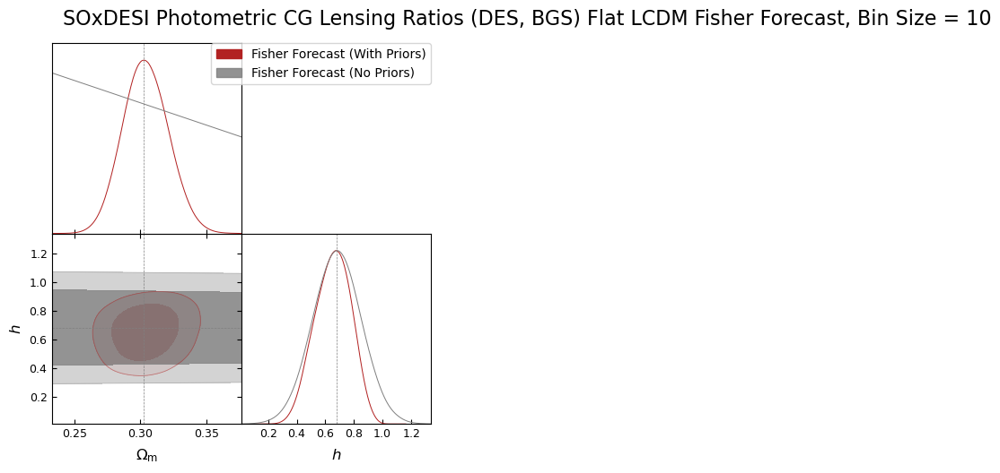

total_time:  0:01:14.562112


In [14]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_CG_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_CG_Photo_BGS_DESY5_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric CG Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_cg_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_5.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.303\pm 0.013$ | $\Omega_m = 0.303^{+0.026}_{-0.025}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.303\pm 0.015$ | $\Omega_m = 0.303^{+0.026}_{-0.026}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.66^{+0.12}_{-0.10}$ | $h = 0.66^{+0.20}_{-0.22}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.14$ | $h = 0.68^{+0.27}_{-0.27}$ |
| --- | --- | --- | --- |

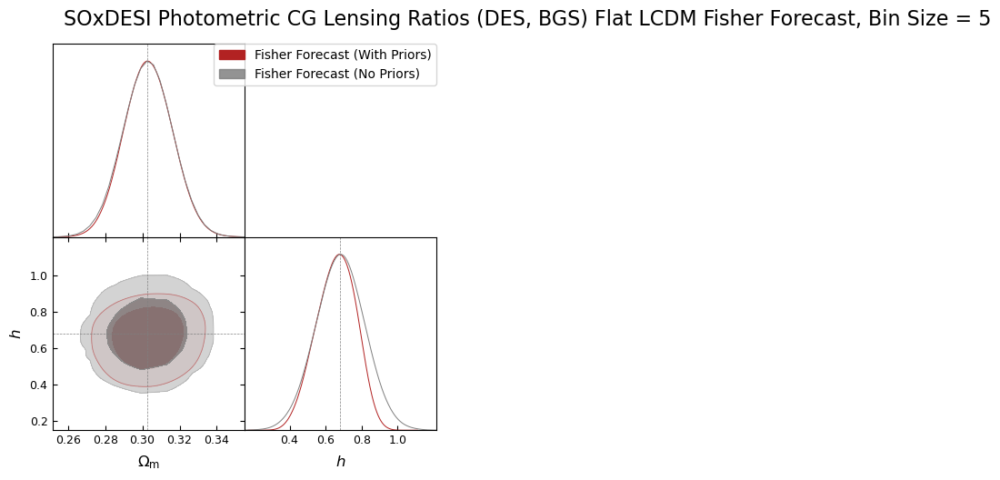

total_time:  0:02:22.674321


In [15]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=5,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_CG_Photo_BGS_DESY3_Binsize=5.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_CG_Photo_BGS_DESY5_Binsize=5.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric CG Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 5",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

## Lensing Ratios - GL

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_gl_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.303\pm 0.023$ | $\Omega_m = 0.303^{+0.045}_{-0.045}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.303\pm 0.023$ | $\Omega_m = 0.303^{+0.045}_{-0.045}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.67^{+0.14}_{-0.12}$ | $h = 0.67^{+0.24}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.15$ | $h = 0.68^{+0.29}_{-0.29}$ |
| --- | --- | --- | --- |

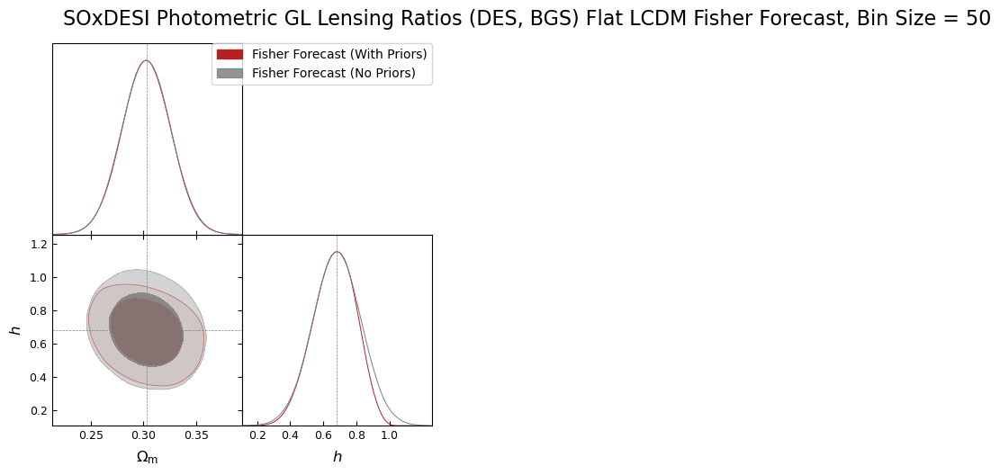

total_time:  0:00:31.643800


In [16]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_GL_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_GL_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric GL Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_gl_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.303\pm 0.017$ | $\Omega_m = 0.303^{+0.033}_{-0.033}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.303\pm 0.017$ | $\Omega_m = 0.303^{+0.032}_{-0.033}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.676^{+0.10}_{-0.090}$ | $h = 0.68^{+0.18}_{-0.19}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.099$ | $h = 0.68^{+0.20}_{-0.19}$ |
| --- | --- | --- | --- |

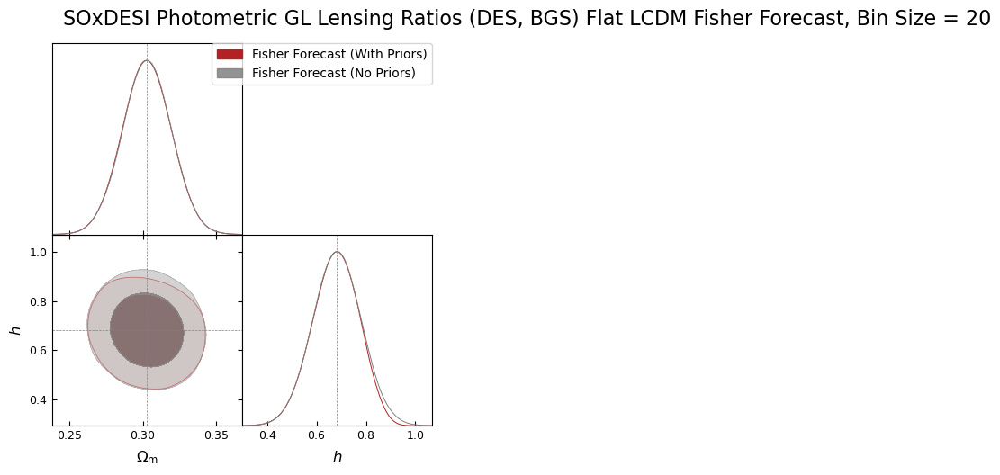

total_time:  0:00:53.607233


In [17]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_GL_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_GL_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric GL Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_gl_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.303\pm 0.013$ | $\Omega_m = 0.303^{+0.025}_{-0.024}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.303\pm 0.013$ | $\Omega_m = 0.303^{+0.025}_{-0.025}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.681\pm 0.073$ | $h = 0.68^{+0.14}_{-0.14}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.074$ | $h = 0.68^{+0.14}_{-0.14}$ |
| --- | --- | --- | --- |

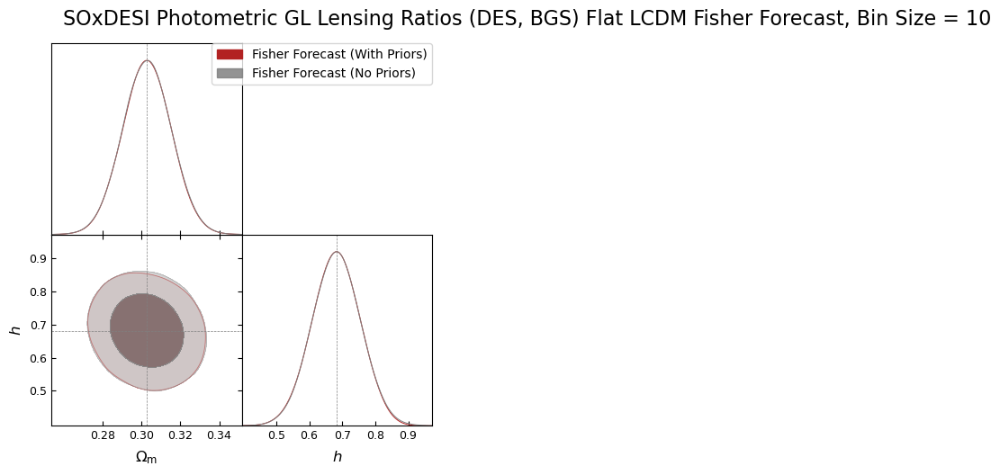

total_time:  0:01:33.027454


In [18]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_GL_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_GL_Photo_BGS_DESY5_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric GL Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_gl_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_5.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0092$ | $\Omega_m = 0.303^{+0.018}_{-0.018}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0092$ | $\Omega_m = 0.303^{+0.018}_{-0.018}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.682\pm 0.053$ | $h = 0.68^{+0.10}_{-0.10}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.053$ | $h = 0.68^{+0.10}_{-0.10}$ |
| --- | --- | --- | --- |

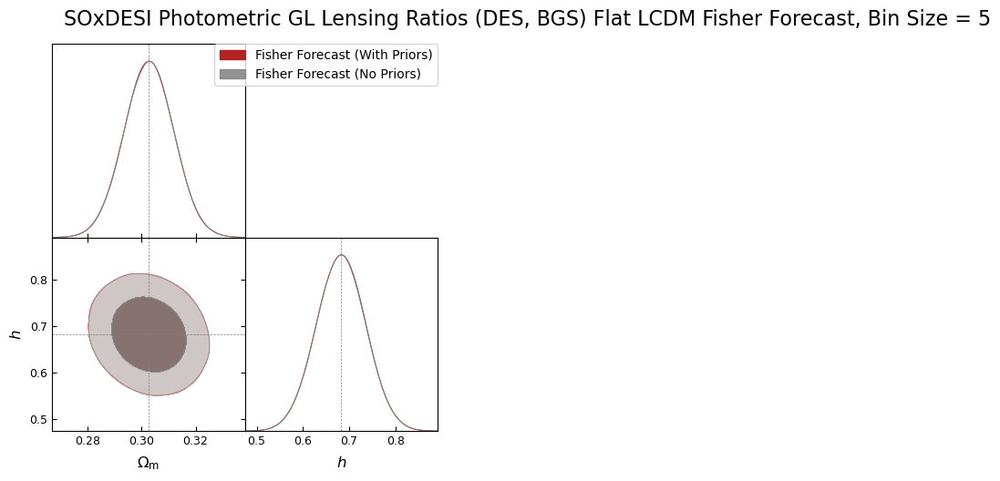

total_time:  0:03:22.298859


In [19]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=5,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_GL_Photo_BGS_DESY3_Binsize=5.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_GL_Photo_BGS_DESY5_Binsize=5.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric GL Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 5",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

## Lensing Ratios ell_min 1000

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_1000_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_100.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.304\pm 0.039$ | $\Omega_m = 0.304^{+0.076}_{-0.075}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.328$ | $\Omega_m = \Omega_\mathrm{m} < 0.407$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.63^{+0.23}_{-0.19}$ | $h = 0.63^{+0.35}_{-0.34}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.41$ | $h = 0.68^{+0.81}_{-0.81}$ |
| --- | --- | --- | --- |

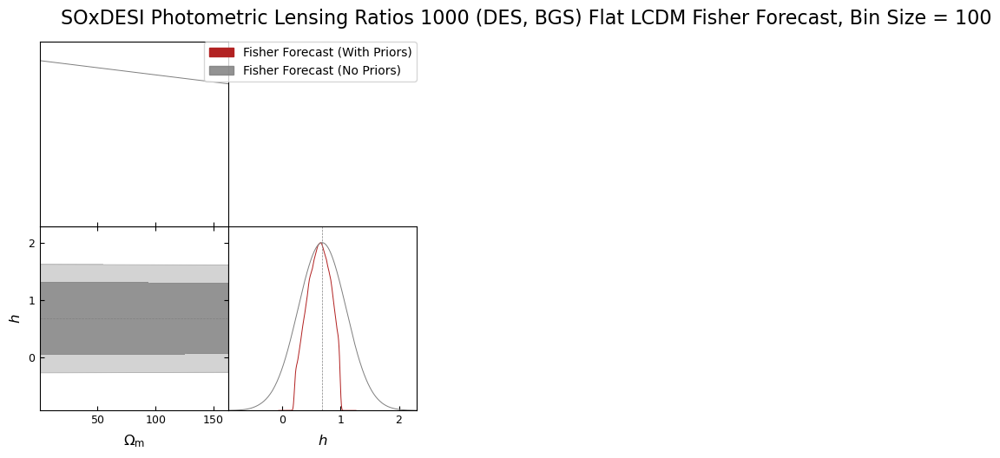

total_time:  0:00:39.620235


In [25]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=100,
    l_min =1000,
    n_ell = 4000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=min1000_SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY3_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY5_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 1000 (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_1000_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.305\pm 0.032$ | $\Omega_m = 0.305^{+0.062}_{-0.061}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.321$ | $\Omega_m = \Omega_\mathrm{m} < 0.373$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.63^{+0.22}_{-0.18}$ | $h = 0.63^{+0.34}_{-0.34}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.32$ | $h = 0.68^{+0.63}_{-0.63}$ |
| --- | --- | --- | --- |

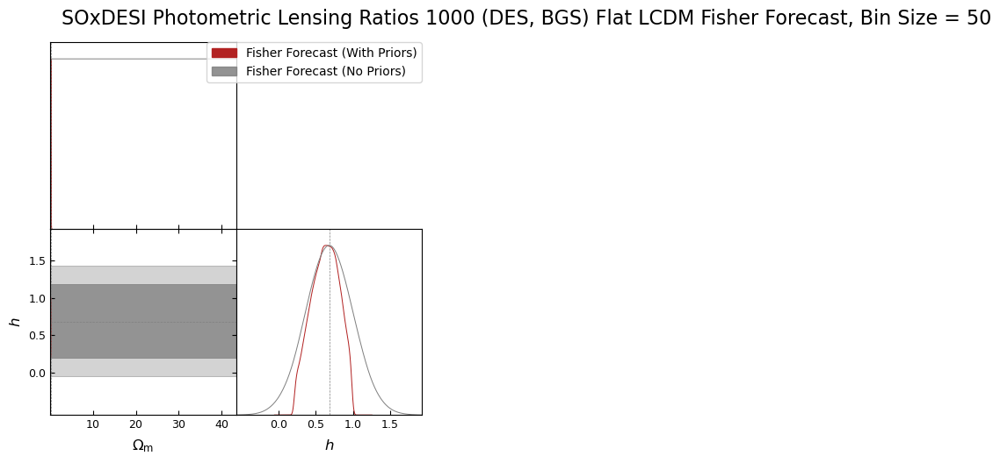

total_time:  0:00:45.216429


In [26]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =1000,
    n_ell = 4000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=min1000_SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 1000 (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_1000_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.303\pm 0.020$ | $\Omega_m = 0.303^{+0.040}_{-0.040}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.313$ | $\Omega_m = \Omega_\mathrm{m} < 0.338$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.64^{+0.18}_{-0.14}$ | $h = 0.64^{+0.28}_{-0.30}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.20$ | $h = 0.68^{+0.39}_{-0.39}$ |
| --- | --- | --- | --- |

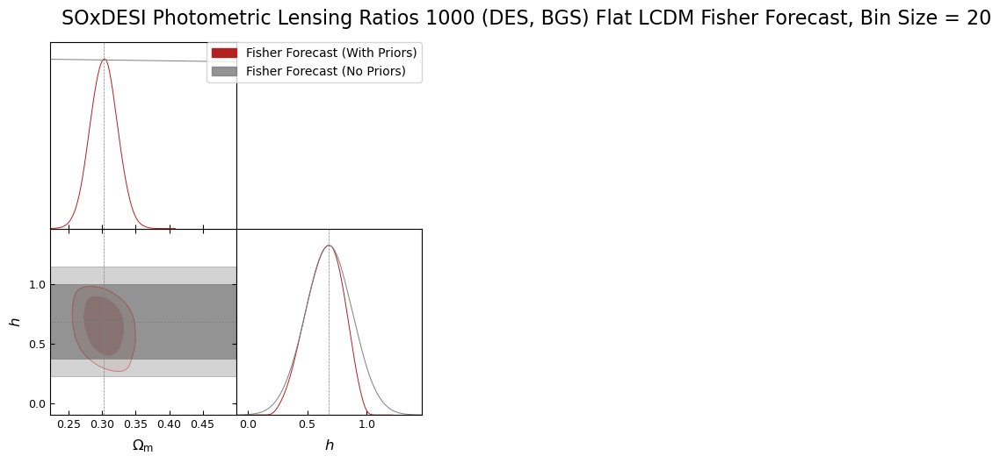

total_time:  0:01:04.441606


In [27]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =1000,
    n_ell = 4000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=min1000_SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 1000 (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_1000_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.303\pm 0.015$ | $\Omega_m = 0.303^{+0.029}_{-0.029}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.303\pm 0.018$ | $\Omega_m = 0.303^{+0.030}_{-0.029}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.66^{+0.14}_{-0.12}$ | $h = 0.66^{+0.24}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.14$ | $h = 0.68^{+0.28}_{-0.28}$ |
| --- | --- | --- | --- |

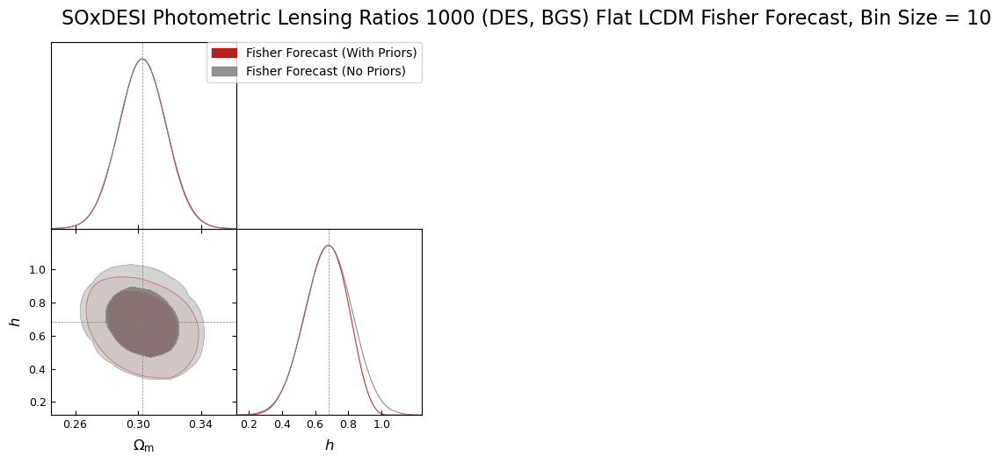

Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_1000_(des_lrg_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10_--_all_sampled_params_plotted.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.253\pm 0.015$ | $\Omega_{c} = 0.253^{+0.029}_{-0.029}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.253\pm 0.015$ | $\Omega_{c} = 0.253^{+0.029}_{-0.029}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.048\pm 0.011$ | $\Omega_{b} = 0.048^{+0.021}_{-0.021}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.048\pm 0.011$ | $\Omega_{b} = 0.048^{+0.021}_{-0.021}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.66^{+0.14}_{-0.12}$ | $h = 0.66^{+0.23}_{-0.26}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.14$ | $h = 0.68^{+0.28}_{-0.28}$ |
| --- | --- | --- | --- |
| **$logA_s$** | Fisher Forecast (With Priors) | $logA_s = 3.11^{+0.37}_{-0.44}$ | $logA_s = 3.11^{+0.78}_{-0.75}$ |
|  | Fisher Forecast (No Priors) | $logA_s = 3.05\pm 0.45$ | $logA_s = 3.05^{+0.88}_{-0.89}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.976^{+0.036}_{-0.049}$ | $n_s = 0.976^{+0.075}_{-0.075}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.969\pm 0.048$ | $n_s = 0.969^{+0.095}_{-0.095}$ |
| --- | --- | --- | --- |

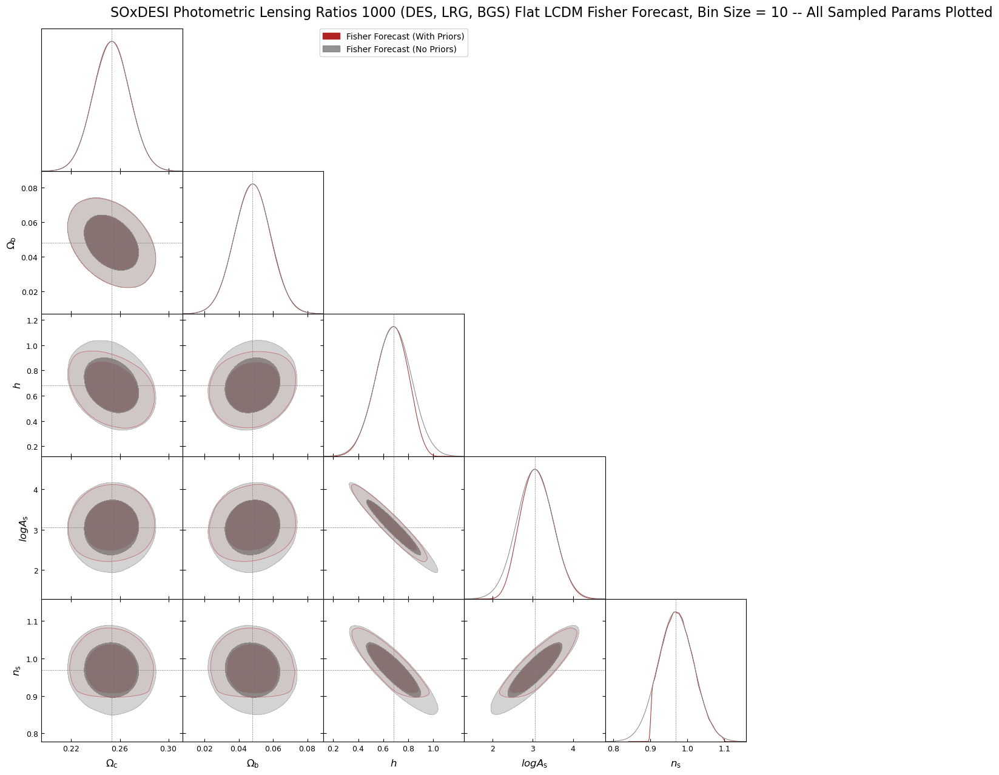

total_time:  0:01:44.688635


In [28]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =1000,
    n_ell = 4000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=min1000_SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR1000_Photo_BGS_DESY5_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 1000 (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 1000 (DES, LRG, BGS) Flat LCDM Fisher Forecast, Bin Size = 10 -- All Sampled Params Plotted",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

## Lensing Ratios ell_min 2000

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.313^{+0.058}_{-0.065}$ | $\Omega_m = 0.31^{+0.13}_{-0.12}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.399$ | $\Omega_m = \Omega_\mathrm{m} < 0.637$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.63^{+0.31}_{-0.16}$ | $h = 0.63^{+0.35}_{-0.37}$ |
|  | Fisher Forecast (No Priors) | $h = 0.7\pm 2.4$ | $h = 0.7^{+4.7}_{-4.7}$ |
| --- | --- | --- | --- |

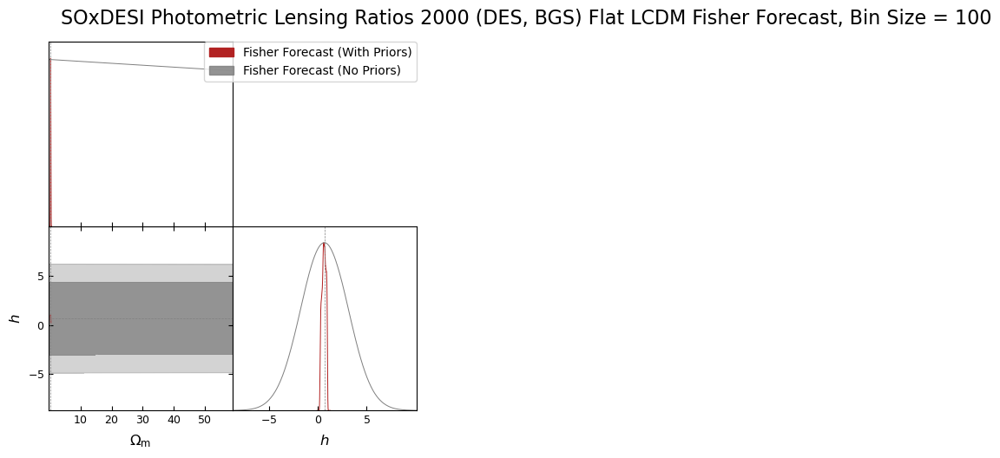

total_time:  0:00:31.812054


In [29]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=100,
    l_min =2000,
    n_ell = 3000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=min2000_SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY3_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY5_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 2000 (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_2000_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.312\pm 0.058$ | $\Omega_m = 0.31^{+0.12}_{-0.11}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.378$ | $\Omega_m = \Omega_\mathrm{m} < 0.562$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.64^{+0.30}_{-0.16}$ | $h = 0.64^{+0.34}_{-0.37}$ |
|  | Fisher Forecast (No Priors) | $h = 0.7\pm 1.7$ | $h = 0.7^{+3.4}_{-3.4}$ |
| --- | --- | --- | --- |

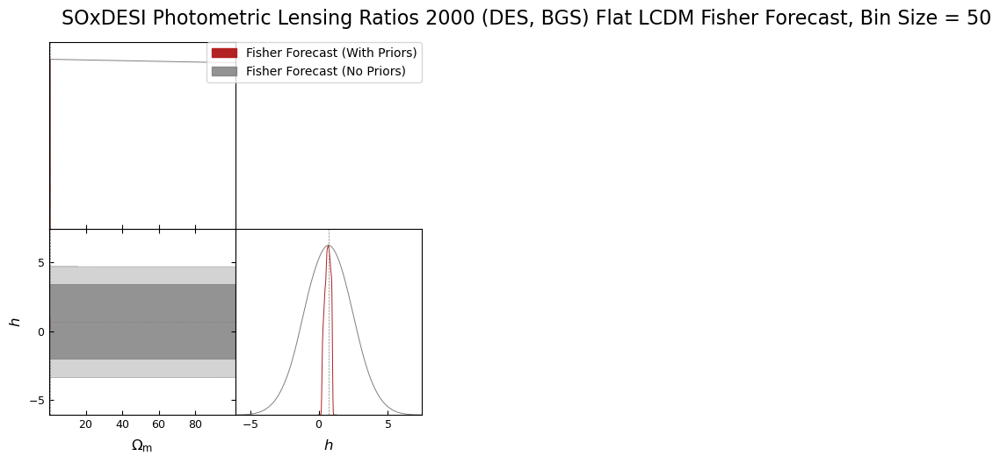

total_time:  0:00:33.321855


In [30]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =2000,
    n_ell = 3000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=min2000_SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 2000 (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_2000_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.311\pm 0.052$ | $\Omega_m = 0.31^{+0.10}_{-0.10}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.356$ | $\Omega_m = \Omega_\mathrm{m} < 0.490$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.63^{+0.26}_{-0.19}$ | $h = 0.63^{+0.35}_{-0.37}$ |
|  | Fisher Forecast (No Priors) | $h = 0.7\pm 1.1$ | $h = 0.7^{+2.1}_{-2.1}$ |
| --- | --- | --- | --- |

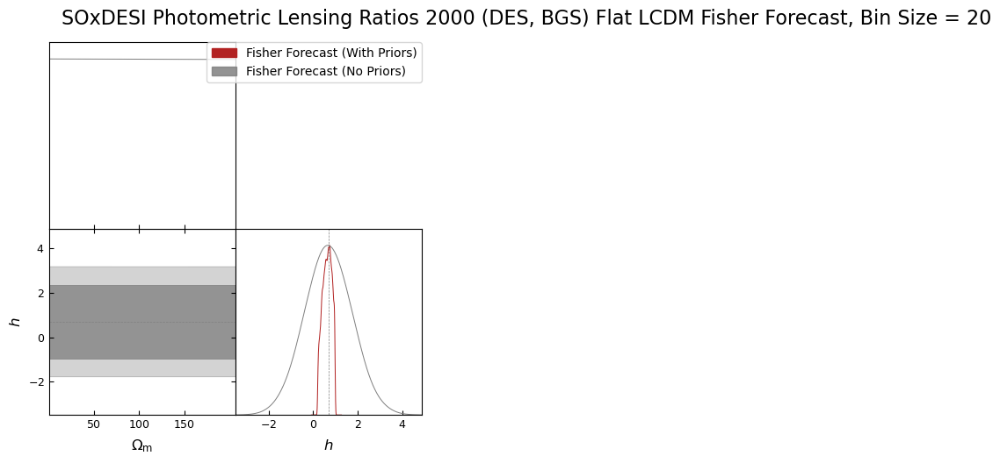

total_time:  0:00:39.930753


In [31]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =2000,
    n_ell = 3000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=min2000_SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 2000 (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_2000_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.309\pm 0.045$ | $\Omega_m = 0.309^{+0.089}_{-0.088}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.343$ | $\Omega_m = \Omega_\mathrm{m} < 0.457$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.63^{+0.25}_{-0.19}$ | $h = 0.63^{+0.35}_{-0.36}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.72$ | $h = 0.7^{+1.4}_{-1.4}$ |
| --- | --- | --- | --- |

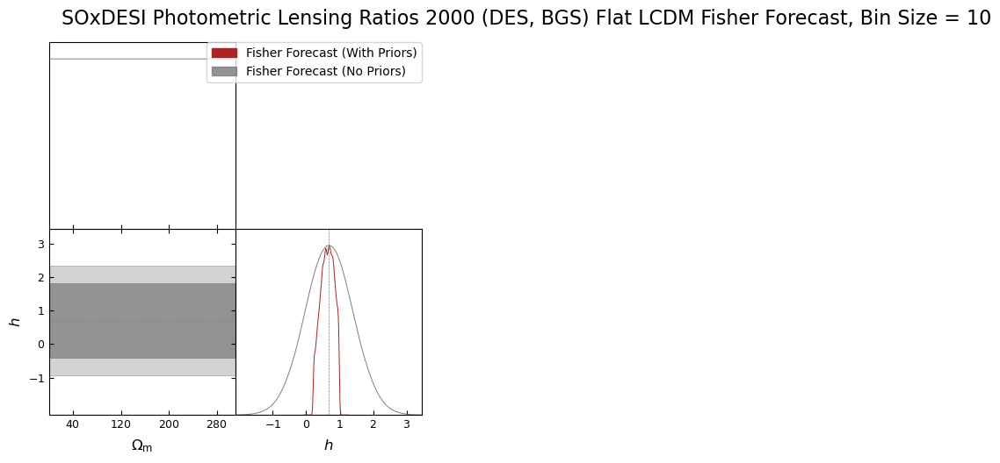

total_time:  0:01:08.501900


In [32]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =2000,
    n_ell = 3000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=min2000_SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR2000_Photo_BGS_DESY5_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 2000 (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

## Lensing Ratios ell_max 2040

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3033^{+0.0028}_{-0.0040}$ | $\Omega_m = 0.3033^{+0.0065}_{-0.0058}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3030^{+0.0033}_{-0.0044}$ | $\Omega_m = 0.3030^{+0.0078}_{-0.0073}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.70^{+0.11}_{-0.15}$ | $h = 0.70^{+0.23}_{-0.21}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.15$ | $h = 0.68^{+0.30}_{-0.30}$ |
| --- | --- | --- | --- |

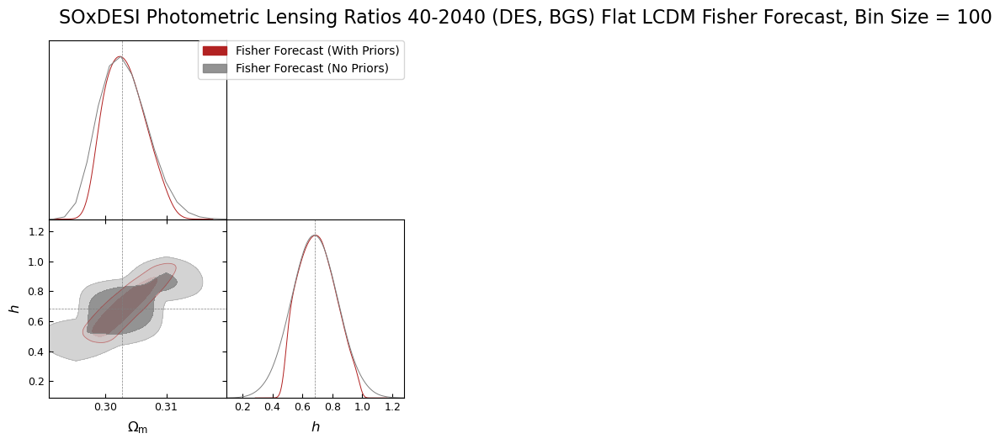

total_time:  0:00:20.015058


In [36]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=100,
    l_min =40,
    n_ell = 2000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=max2040_SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY3_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY5_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 40-2040 (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_40-2040_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.304\pm 0.020$ | $\Omega_m = 0.304^{+0.040}_{-0.040}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.304^{+0.035}_{-0.088}$ | $\Omega_m = \Omega_\mathrm{m} < 0.337$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.67^{+0.15}_{-0.13}$ | $h = 0.67^{+0.26}_{-0.27}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.16$ | $h = 0.68^{+0.32}_{-0.32}$ |
| --- | --- | --- | --- |

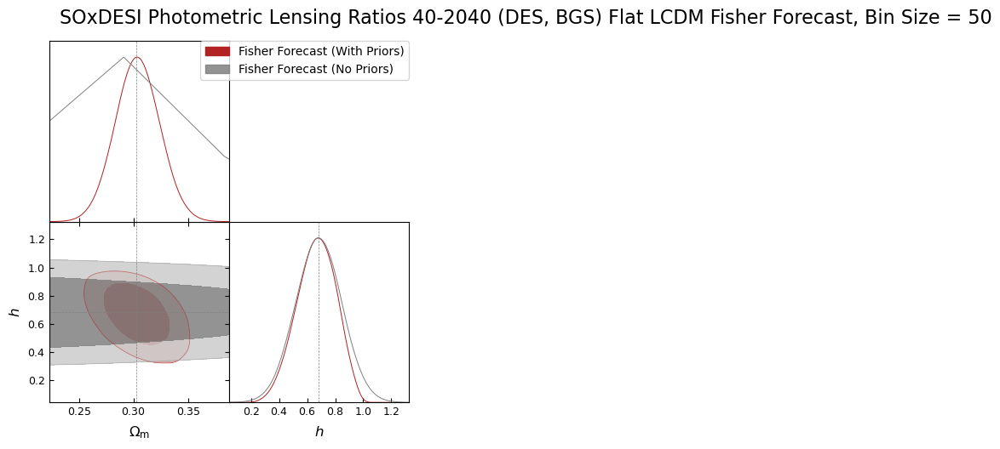

total_time:  0:00:26.266322


In [37]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 2000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=max2040_SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 40-2040 (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_40-2040_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.303\pm 0.011$ | $\Omega_m = 0.303^{+0.022}_{-0.022}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.303\pm 0.011$ | $\Omega_m = 0.303^{+0.022}_{-0.022}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.678\pm 0.094$ | $h = 0.68^{+0.18}_{-0.19}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.097$ | $h = 0.68^{+0.19}_{-0.19}$ |
| --- | --- | --- | --- |

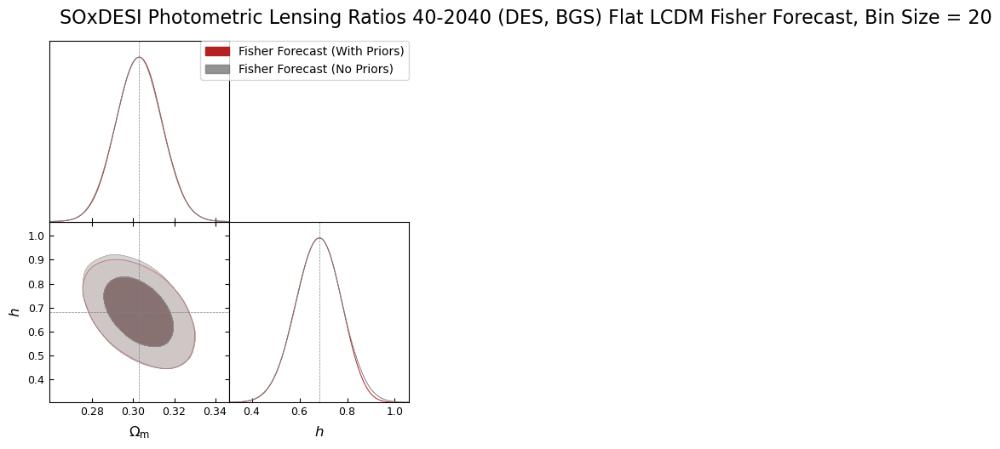

total_time:  0:00:43.693775


In [38]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 2000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=max2040_SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 40-2040 (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_40-2040_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3028\pm 0.0073$ | $\Omega_m = 0.303^{+0.014}_{-0.014}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0073$ | $\Omega_m = 0.303^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.681\pm 0.071$ | $h = 0.68^{+0.14}_{-0.14}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.072$ | $h = 0.68^{+0.14}_{-0.14}$ |
| --- | --- | --- | --- |

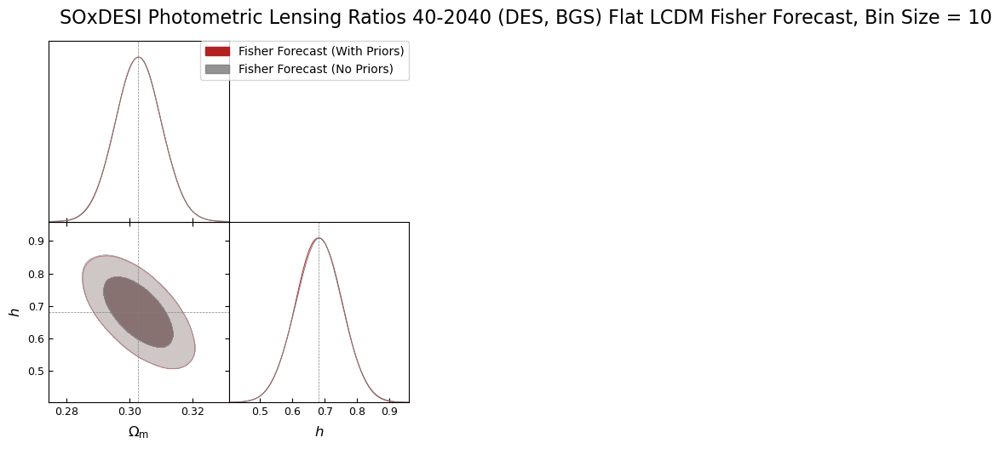

total_time:  0:00:47.354281


In [39]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =40,
    n_ell = 2000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=max2040_SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR2040_Photo_BGS_DESY5_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios 40-2040 (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

## Lensing Ratios

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_100.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3033^{+0.0027}_{-0.0040}$ | $\Omega_m = 0.3033^{+0.0065}_{-0.0058}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3030^{+0.0033}_{-0.0045}$ | $\Omega_m = 0.3030^{+0.0076}_{-0.0071}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.70^{+0.11}_{-0.15}$ | $h = 0.70^{+0.23}_{-0.21}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.15$ | $h = 0.68^{+0.30}_{-0.30}$ |
| --- | --- | --- | --- |

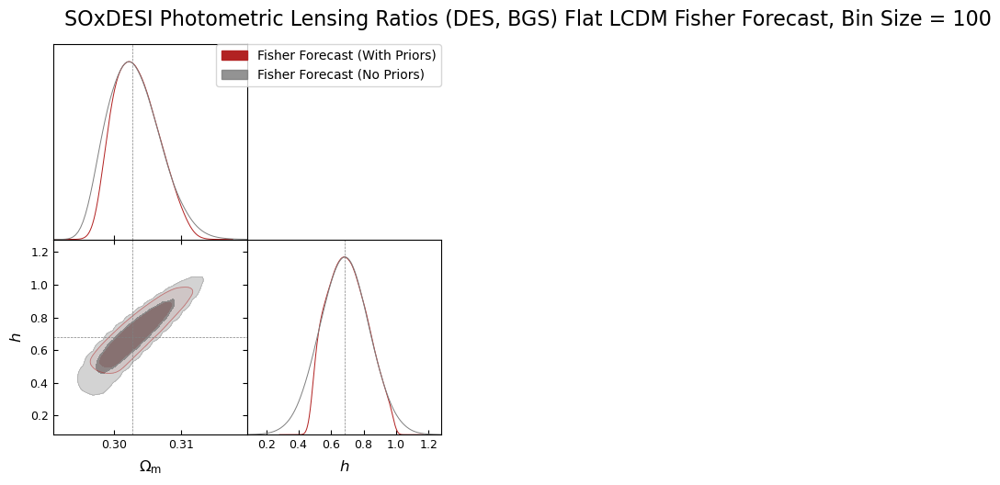

total_time:  0:00:38.741458


In [26]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.303\pm 0.020$ | $\Omega_m = 0.303^{+0.039}_{-0.038}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.303\pm 0.025$ | $\Omega_m = 0.303^{+0.039}_{-0.039}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.67^{+0.15}_{-0.13}$ | $h = 0.67^{+0.26}_{-0.26}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.16$ | $h = 0.68^{+0.31}_{-0.31}$ |
| --- | --- | --- | --- |

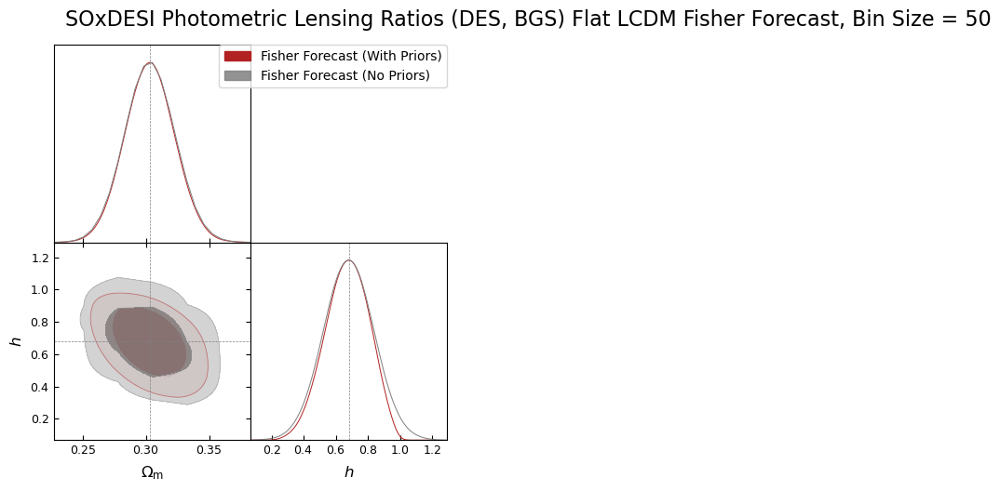

Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_lrg_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50_--_all_sampled_params_plotted.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.252\pm 0.028$ | $\Omega_{c} = 0.252^{+0.054}_{-0.057}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.253\pm 0.031$ | $\Omega_{c} = 0.253^{+0.060}_{-0.060}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.049^{+0.018}_{-0.021}$ | $\Omega_{b} = 0.049^{+0.034}_{-0.036}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.048\pm 0.021$ | $\Omega_{b} = 0.048^{+0.041}_{-0.041}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.67^{+0.15}_{-0.13}$ | $h = 0.67^{+0.26}_{-0.26}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.16$ | $h = 0.68^{+0.31}_{-0.31}$ |
| --- | --- | --- | --- |
| **$logA_s$** | Fisher Forecast (With Priors) | $logA_s = 3.10^{+0.29}_{-0.37}$ | $logA_s = 3.10^{+0.64}_{-0.61}$ |
|  | Fisher Forecast (No Priors) | $logA_s = 3.05\pm 0.37$ | $logA_s = 3.05^{+0.72}_{-0.72}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.974^{+0.034}_{-0.045}$ | $n_s = 0.974^{+0.070}_{-0.071}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.969\pm 0.044$ | $n_s = 0.969^{+0.087}_{-0.087}$ |
| --- | --- | --- | --- |

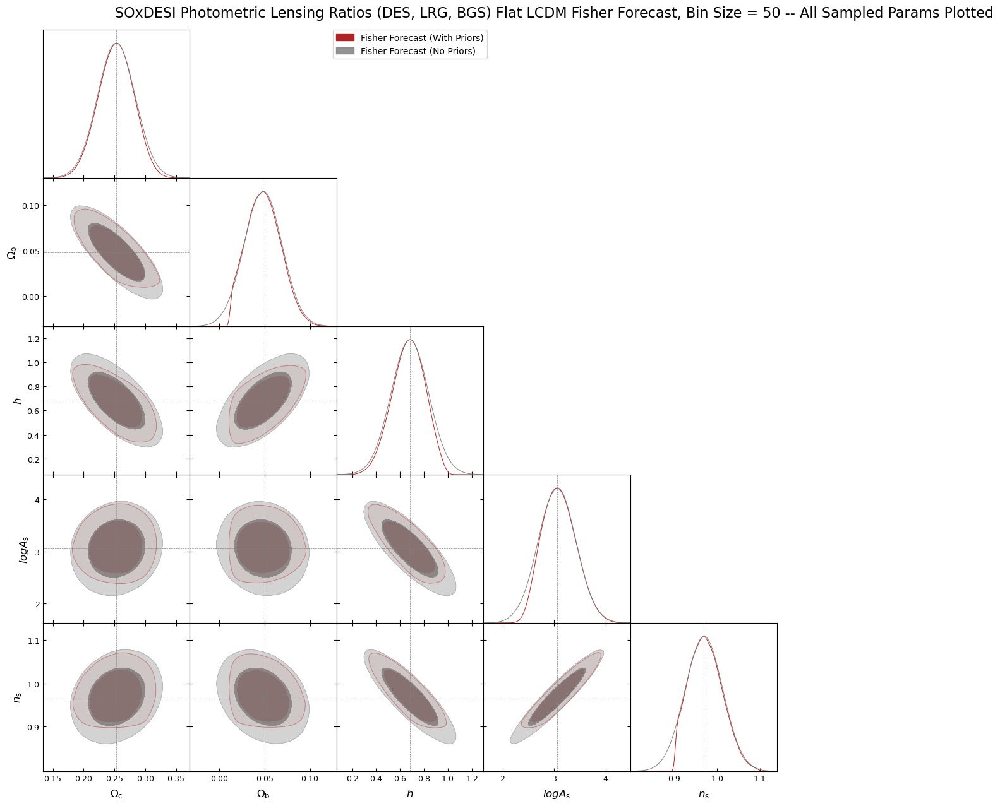

total_time:  0:00:38.811964


In [13]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, LRG, BGS) Flat LCDM Fisher Forecast, Bin Size = 50 -- All Sampled Params Plotted",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.303\pm 0.011$ | $\Omega_m = 0.303^{+0.021}_{-0.021}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.303\pm 0.011$ | $\Omega_m = 0.303^{+0.021}_{-0.021}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.680\pm 0.093$ | $h = 0.68^{+0.18}_{-0.18}$ |
|  | Fisher Forecast (No Priors) | $h = 0.681\pm 0.095$ | $h = 0.68^{+0.19}_{-0.19}$ |
| --- | --- | --- | --- |

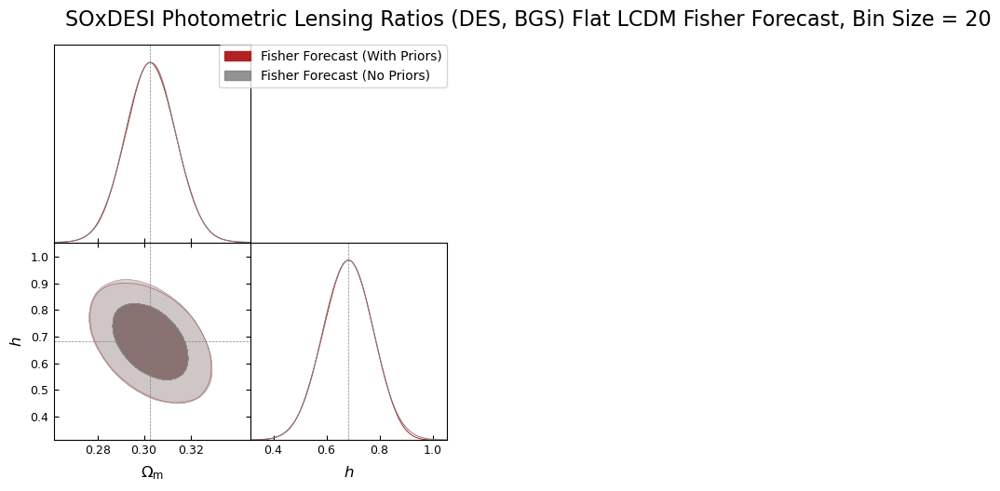

total_time:  0:00:58.577724


In [16]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

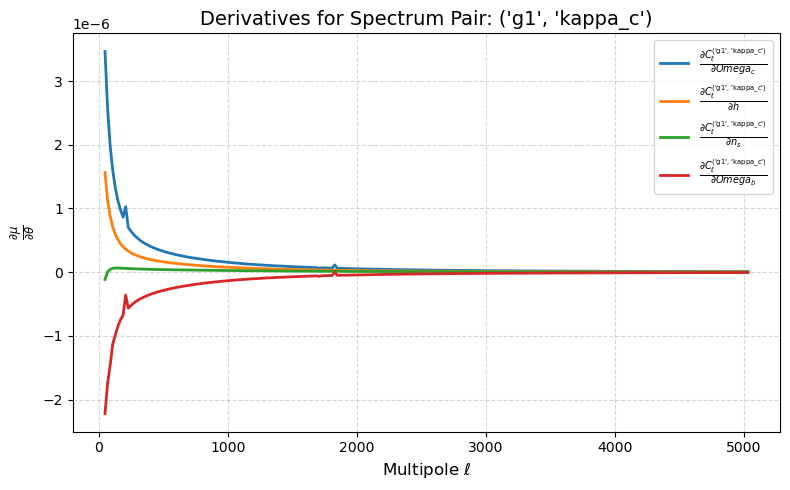

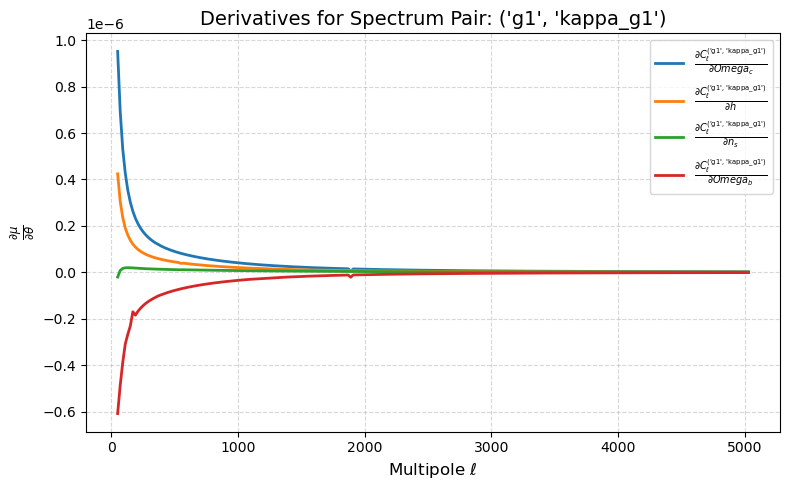

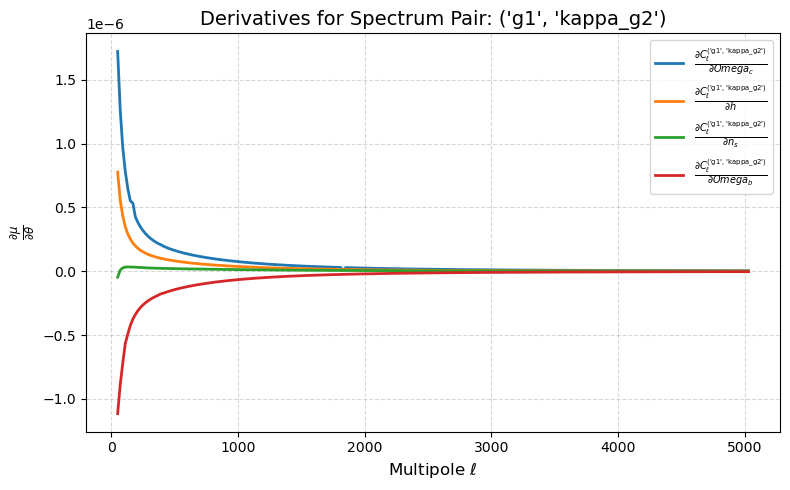

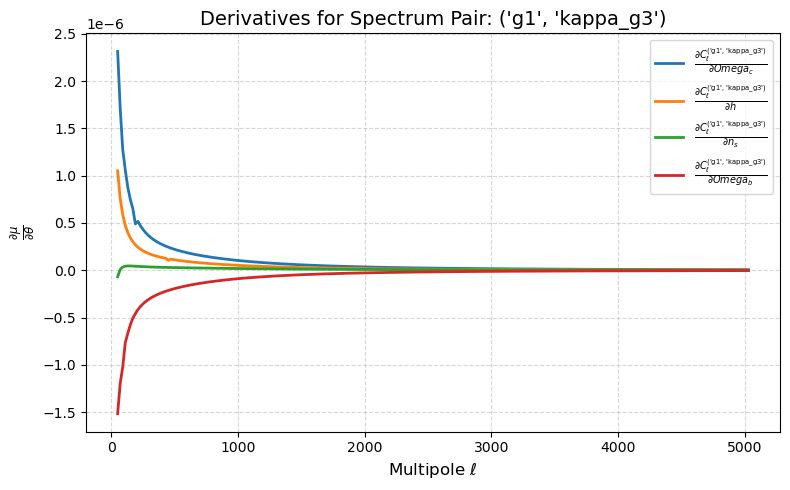

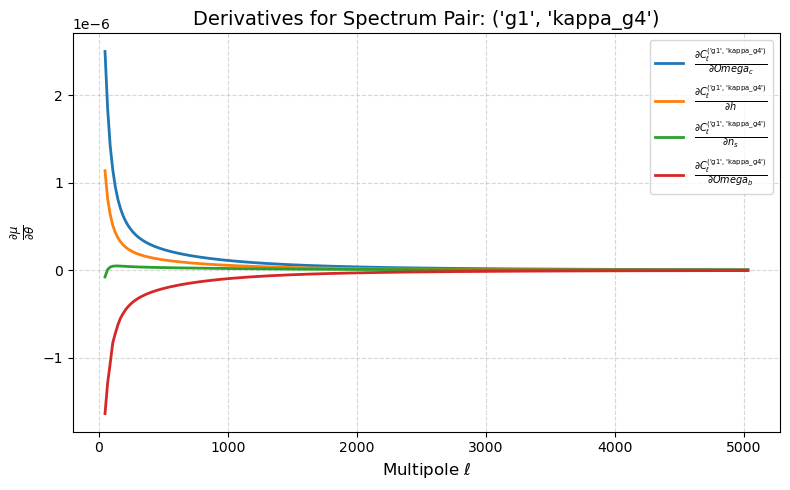

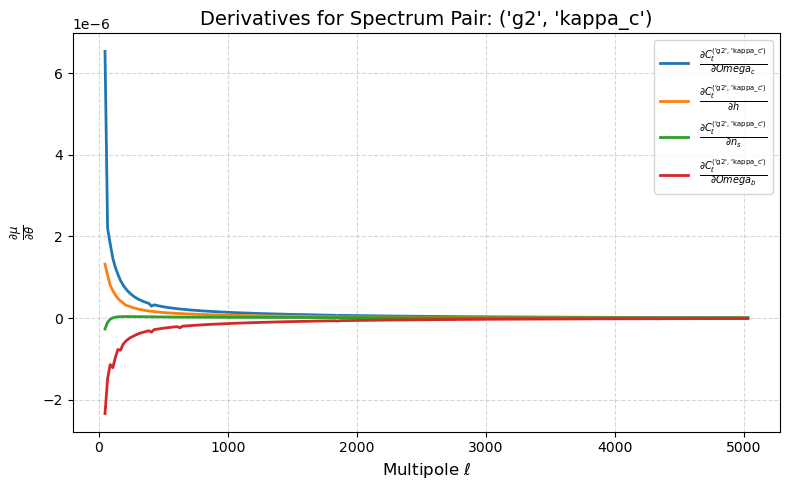

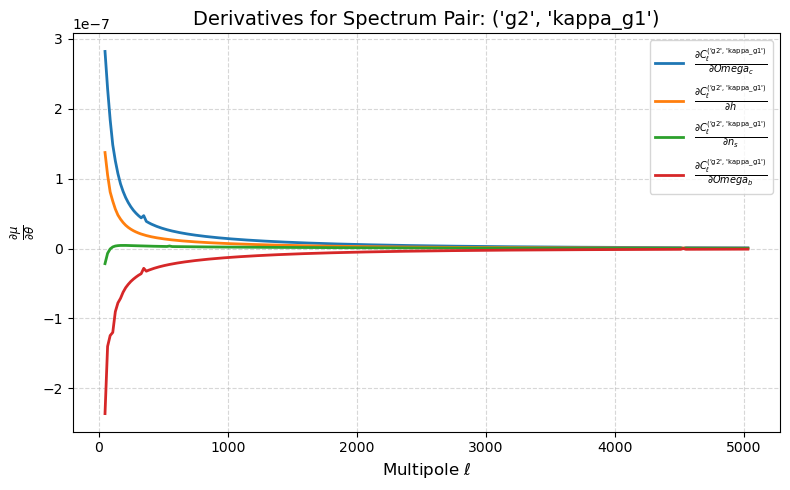

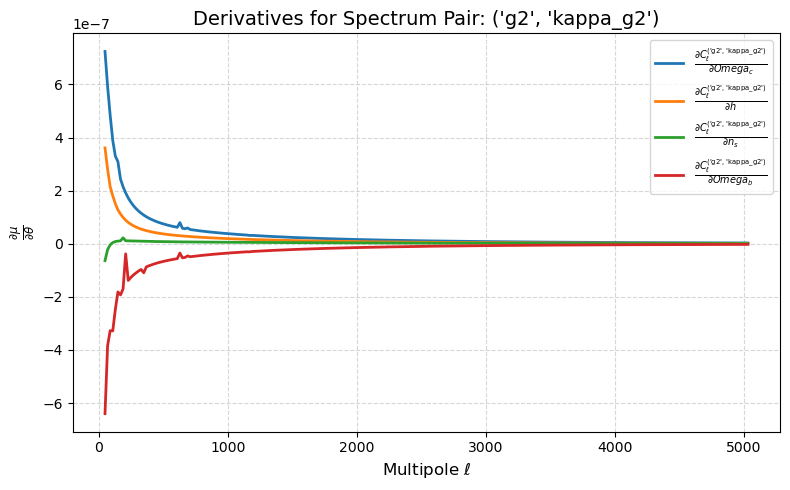

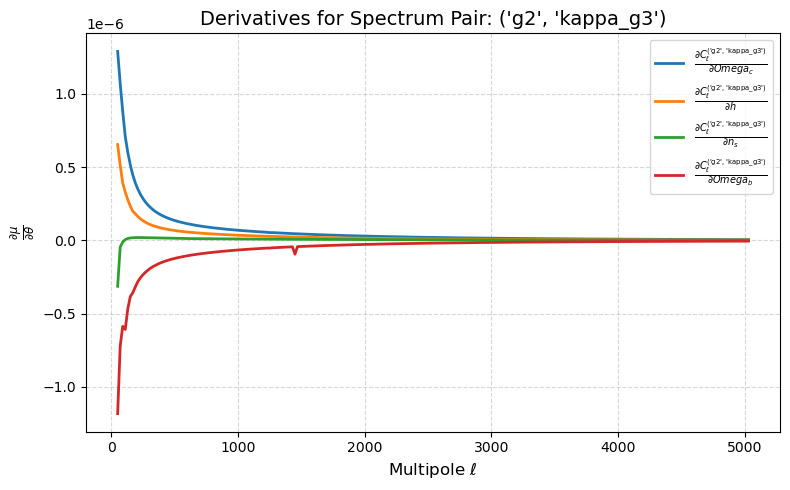

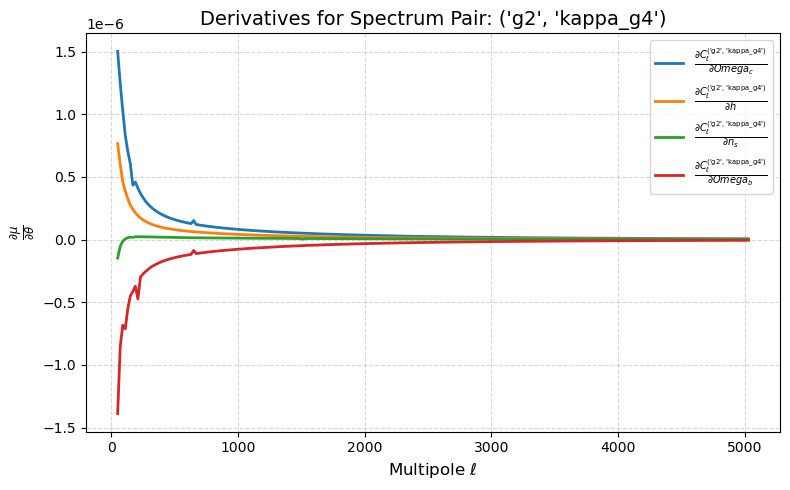

In [19]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0071$ | $\Omega_m = 0.303^{+0.014}_{-0.014}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0071$ | $\Omega_m = 0.303^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.681\pm 0.069$ | $h = 0.68^{+0.14}_{-0.14}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.070$ | $h = 0.68^{+0.14}_{-0.14}$ |
| --- | --- | --- | --- |

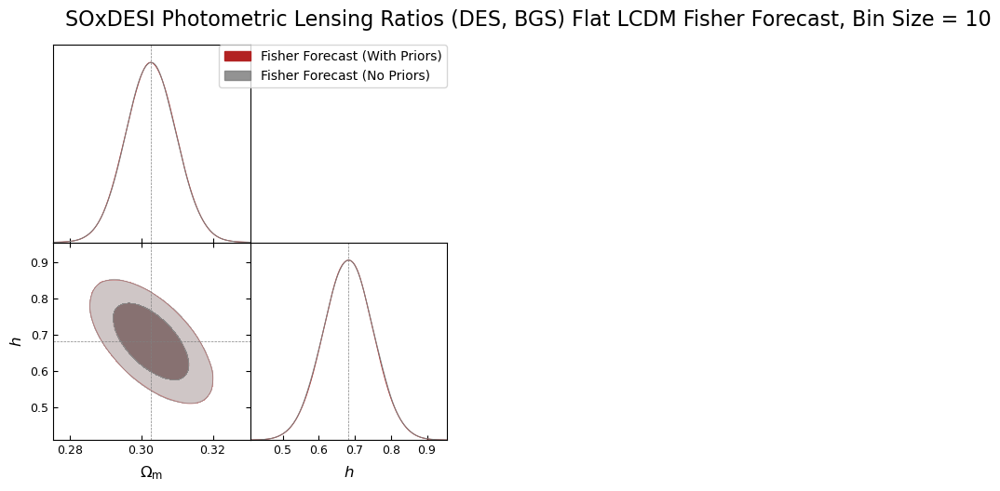

Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_lrg_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10_--_all_sampled_params_plotted.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2532\pm 0.0086$ | $\Omega_{c} = 0.253^{+0.017}_{-0.017}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2532\pm 0.0086$ | $\Omega_{c} = 0.253^{+0.017}_{-0.017}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.0480\pm 0.0085$ | $\Omega_{b} = 0.048^{+0.017}_{-0.017}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.0481\pm 0.0086$ | $\Omega_{b} = 0.048^{+0.017}_{-0.017}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.682\pm 0.069$ | $h = 0.68^{+0.14}_{-0.14}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.069$ | $h = 0.68^{+0.14}_{-0.14}$ |
| --- | --- | --- | --- |
| **$logA_s$** | Fisher Forecast (With Priors) | $logA_s = 3.06\pm 0.16$ | $logA_s = 3.06^{+0.32}_{-0.32}$ |
|  | Fisher Forecast (No Priors) | $logA_s = 3.05\pm 0.16$ | $logA_s = 3.05^{+0.32}_{-0.32}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.969\pm 0.021$ | $n_s = 0.969^{+0.041}_{-0.040}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.969\pm 0.021$ | $n_s = 0.969^{+0.040}_{-0.041}$ |
| --- | --- | --- | --- |

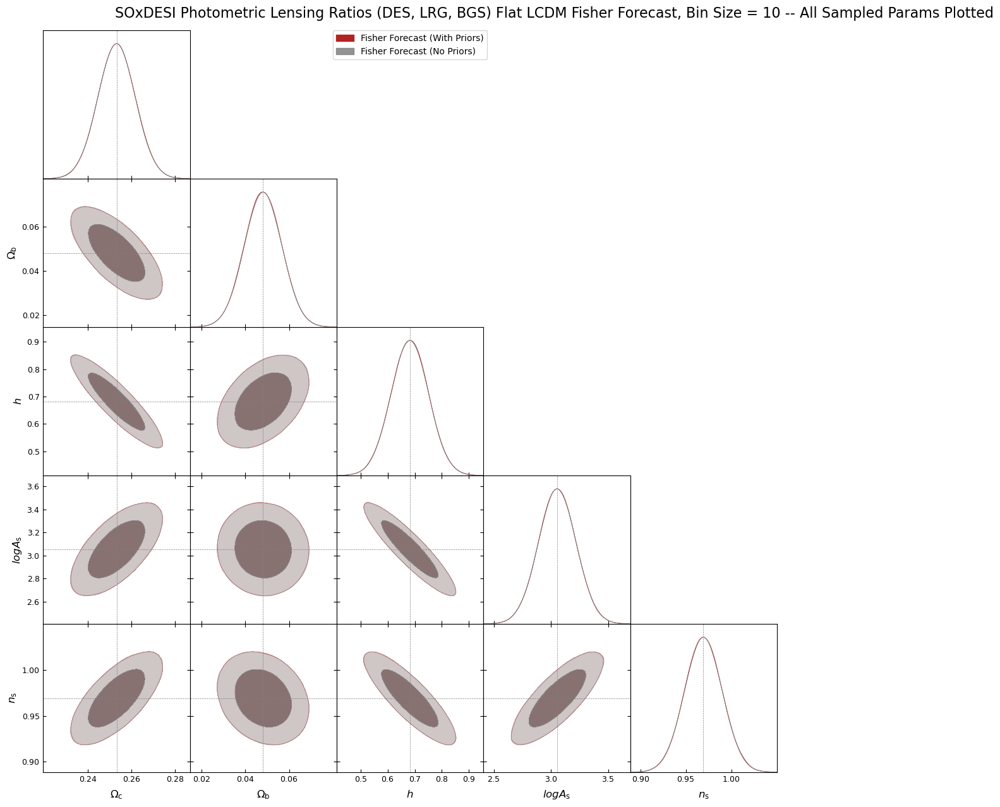

total_time:  0:01:51.369721


In [15]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, LRG, BGS) Flat LCDM Fisher Forecast, Bin Size = 10 -- All Sampled Params Plotted",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_5.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0050$ | $\Omega_m = 0.3027^{+0.0098}_{-0.0098}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0050$ | $\Omega_m = 0.3027^{+0.0098}_{-0.0098}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.682\pm 0.049$ | $h = 0.682^{+0.096}_{-0.096}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.049$ | $h = 0.682^{+0.096}_{-0.096}$ |
| --- | --- | --- | --- |

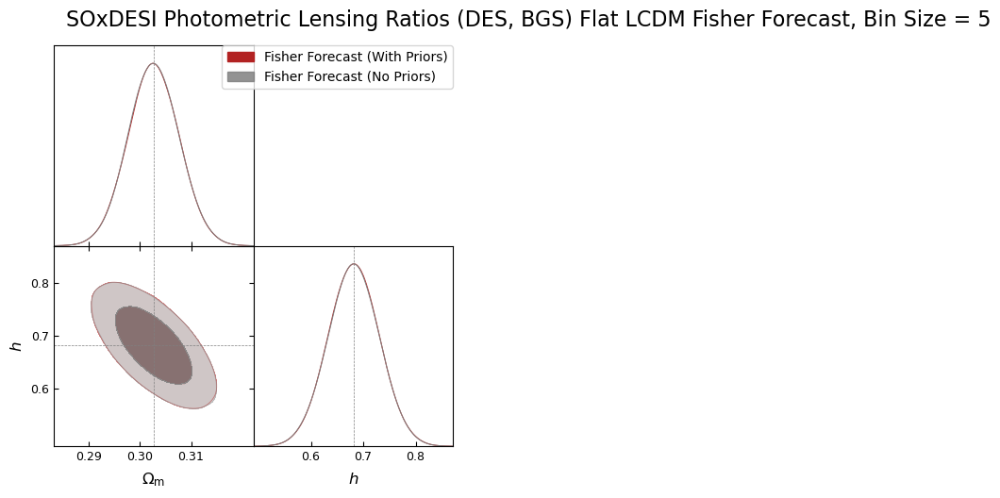

Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_lrg_bgs)_flat_lcdm_fisher_forecast_bin_size_=_5_--_all_sampled_params_plotted.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2532\pm 0.0057$ | $\Omega_{c} = 0.253^{+0.011}_{-0.011}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2532\pm 0.0057$ | $\Omega_{c} = 0.253^{+0.011}_{-0.011}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.0481\pm 0.0058$ | $\Omega_{b} = 0.048^{+0.011}_{-0.011}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.0481\pm 0.0058$ | $\Omega_{b} = 0.048^{+0.011}_{-0.011}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.682\pm 0.049$ | $h = 0.682^{+0.096}_{-0.096}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.049$ | $h = 0.682^{+0.095}_{-0.096}$ |
| --- | --- | --- | --- |
| **$logA_s$** | Fisher Forecast (With Priors) | $logA_s = 3.06\pm 0.11$ | $logA_s = 3.06^{+0.22}_{-0.22}$ |
|  | Fisher Forecast (No Priors) | $logA_s = 3.06\pm 0.11$ | $logA_s = 3.06^{+0.23}_{-0.22}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.969\pm 0.016$ | $n_s = 0.969^{+0.031}_{-0.031}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.969\pm 0.016$ | $n_s = 0.969^{+0.031}_{-0.031}$ |
| --- | --- | --- | --- |

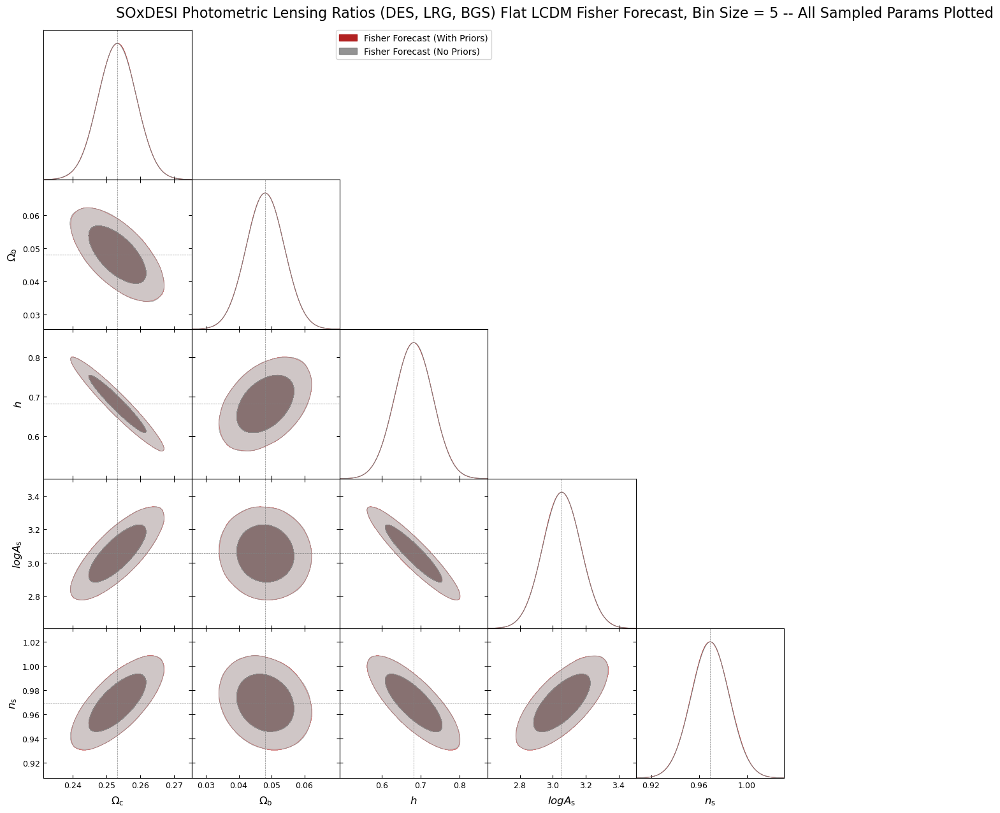

total_time:  0:05:18.779371


In [25]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=5,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=5.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=5.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 5",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, LRG, BGS) Flat LCDM Fisher Forecast, Bin Size = 5 -- All Sampled Params Plotted",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

### Primaries

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_100.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0048$ | $\Omega_m = 0.3027^{+0.0093}_{-0.0093}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0048$ | $\Omega_m = 0.3027^{+0.0093}_{-0.0094}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0035$ | $h = 0.6817^{+0.0069}_{-0.0069}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0035$ | $h = 0.6817^{+0.0069}_{-0.0069}$ |
| --- | --- | --- | --- |

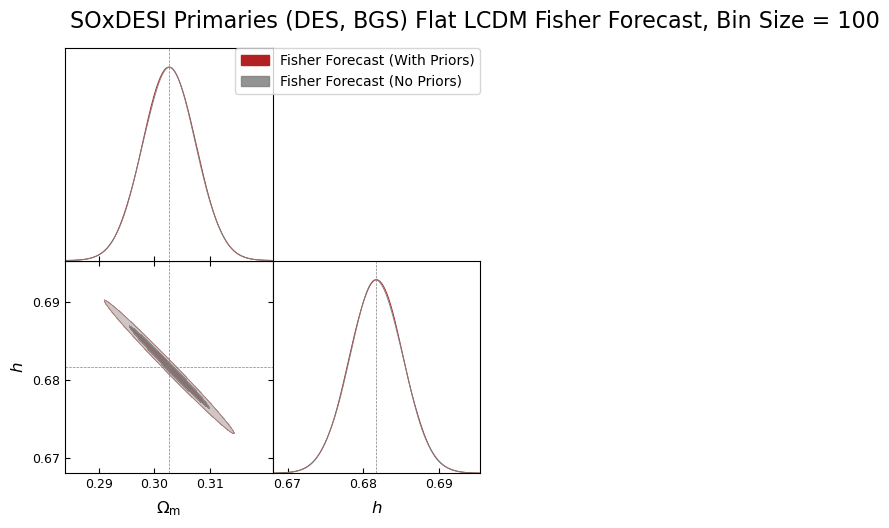

total_time:  0:00:47.612543


In [20]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0043$ | $\Omega_m = 0.3027^{+0.0085}_{-0.0085}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0043$ | $\Omega_m = 0.3027^{+0.0085}_{-0.0084}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0032$ | $h = 0.6817^{+0.0062}_{-0.0062}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0032$ | $h = 0.6817^{+0.0062}_{-0.0062}$ |
| --- | --- | --- | --- |

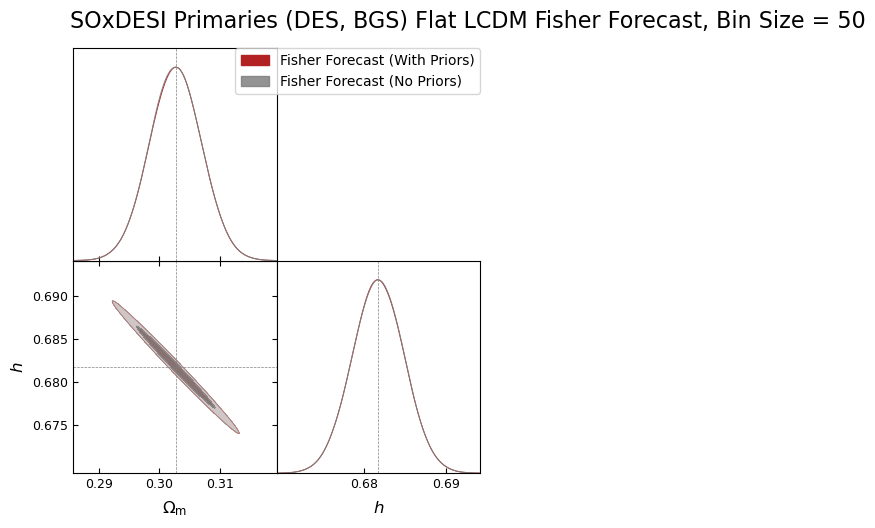

total_time:  0:01:01.222992


In [20]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

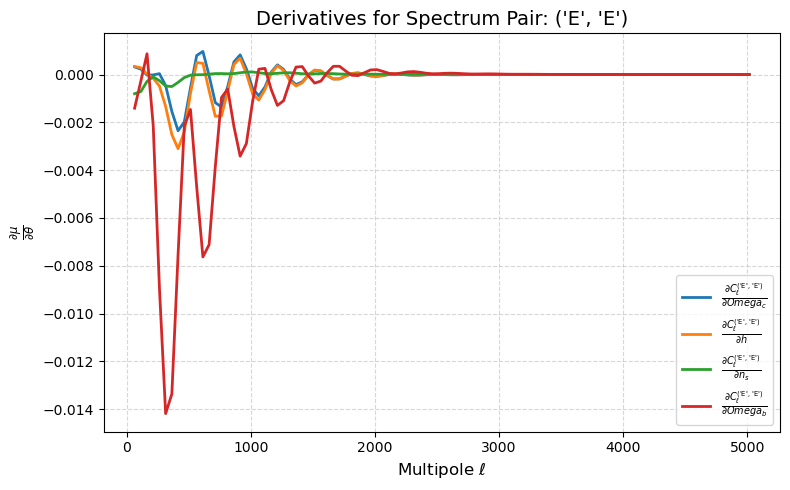

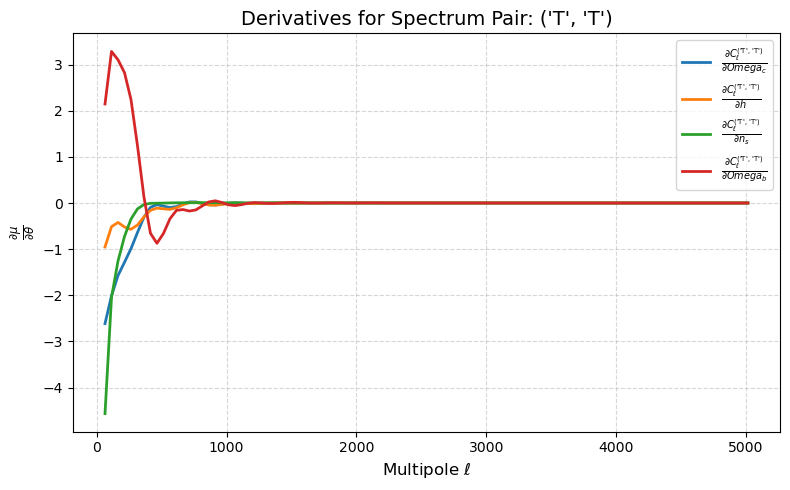

In [21]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0042$ | $\Omega_m = 0.3027^{+0.0082}_{-0.0082}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0042$ | $\Omega_m = 0.3027^{+0.0082}_{-0.0082}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0060}_{-0.0060}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0060}_{-0.0060}$ |
| --- | --- | --- | --- |

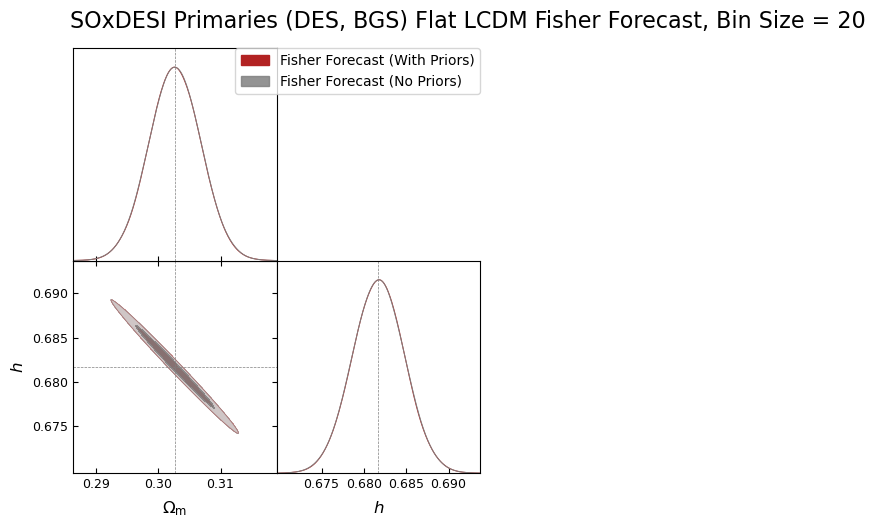

total_time:  0:02:06.473864


In [22]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_10.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0042$ | $\Omega_m = 0.3027^{+0.0082}_{-0.0082}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0042$ | $\Omega_m = 0.3027^{+0.0082}_{-0.0081}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0060}_{-0.0060}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0060}_{-0.0060}$ |
| --- | --- | --- | --- |

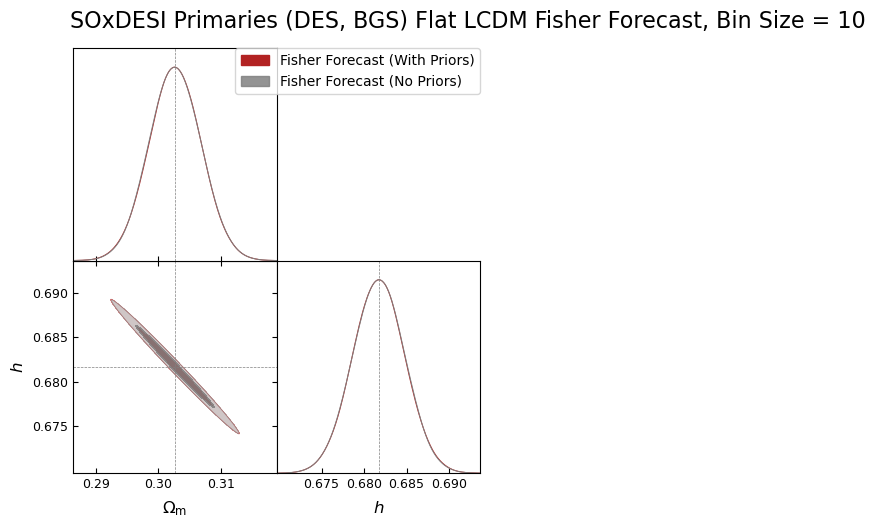

total_time:  0:03:29.499120


In [23]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_Primaries_Photo_BGS_DESY3_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

### Lensing Ratios + Primaries

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0015$ | $\Omega_m = 0.3027^{+0.0030}_{-0.0030}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0015$ | $\Omega_m = 0.3027^{+0.0030}_{-0.0030}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0012$ | $h = 0.6817^{+0.0023}_{-0.0023}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0012$ | $h = 0.6817^{+0.0023}_{-0.0023}$ |
| --- | --- | --- | --- |

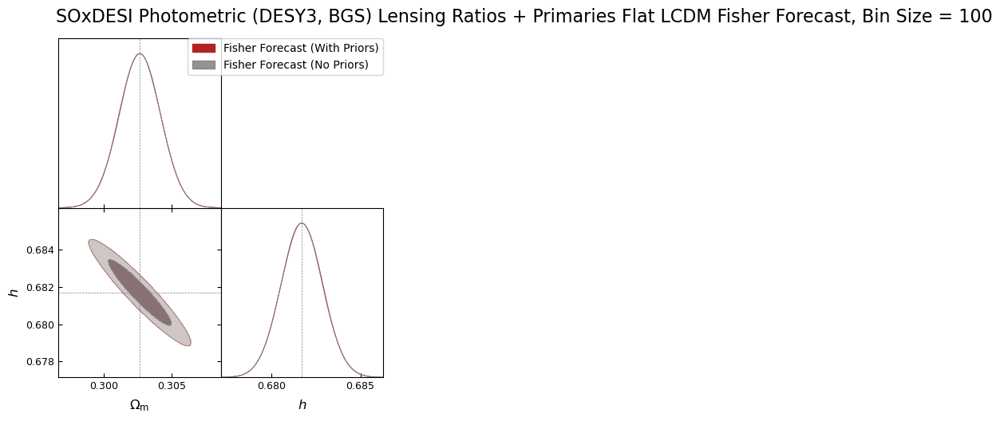

total_time:  0:00:39.647133


In [13]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric (DESY3, BGS) Lensing Ratios + Primaries Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0015$ | $\Omega_m = 0.3027^{+0.0029}_{-0.0029}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0015$ | $\Omega_m = 0.3027^{+0.0029}_{-0.0029}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0011$ | $h = 0.6817^{+0.0022}_{-0.0022}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0011$ | $h = 0.6817^{+0.0022}_{-0.0022}$ |
| --- | --- | --- | --- |

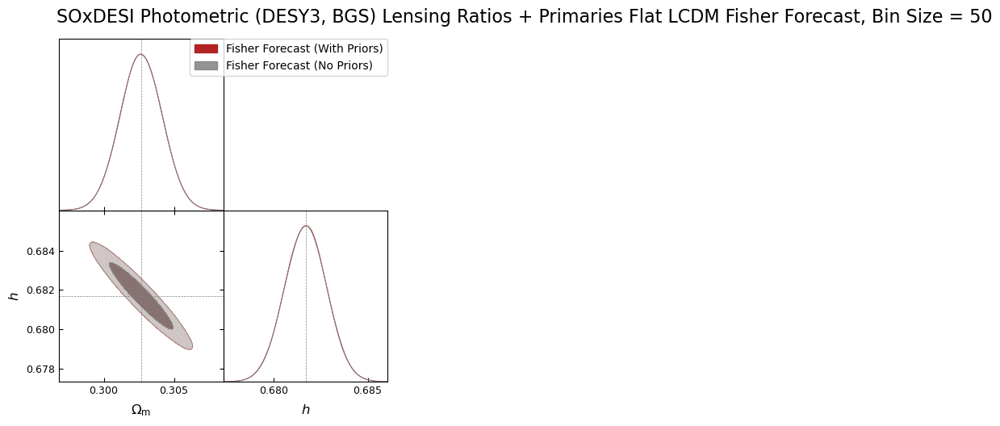

total_time:  0:01:00.619089


In [14]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric (DESY3, BGS) Lensing Ratios + Primaries Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0015$ | $\Omega_m = 0.3027^{+0.0029}_{-0.0028}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0015$ | $\Omega_m = 0.3027^{+0.0028}_{-0.0028}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0011$ | $h = 0.6817^{+0.0021}_{-0.0021}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0011$ | $h = 0.6817^{+0.0021}_{-0.0021}$ |
| --- | --- | --- | --- |

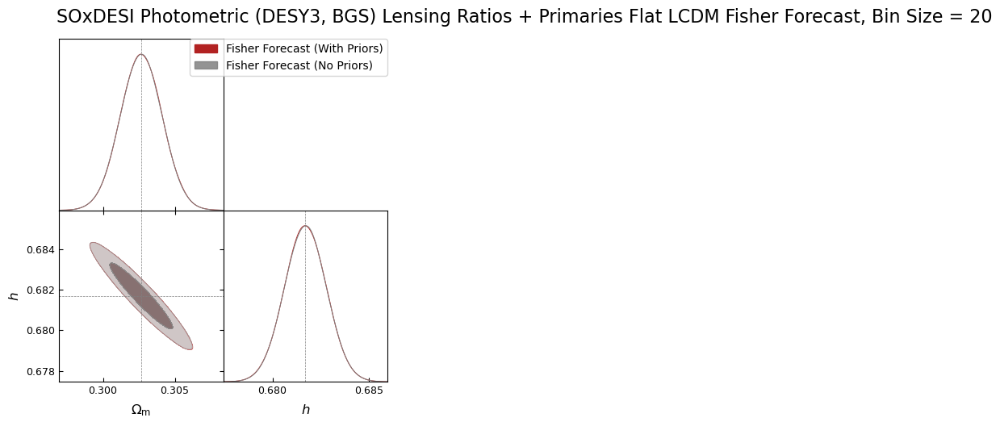

total_time:  0:01:55.806054


In [15]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric (DESY3, BGS) Lensing Ratios + Primaries Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0012$ | $\Omega_m = 0.3027^{+0.0024}_{-0.0024}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0012$ | $\Omega_m = 0.3027^{+0.0024}_{-0.0024}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.68170\pm 0.00092$ | $h = 0.6817^{+0.0018}_{-0.0018}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68170\pm 0.00091$ | $h = 0.6817^{+0.0018}_{-0.0018}$ |
| --- | --- | --- | --- |

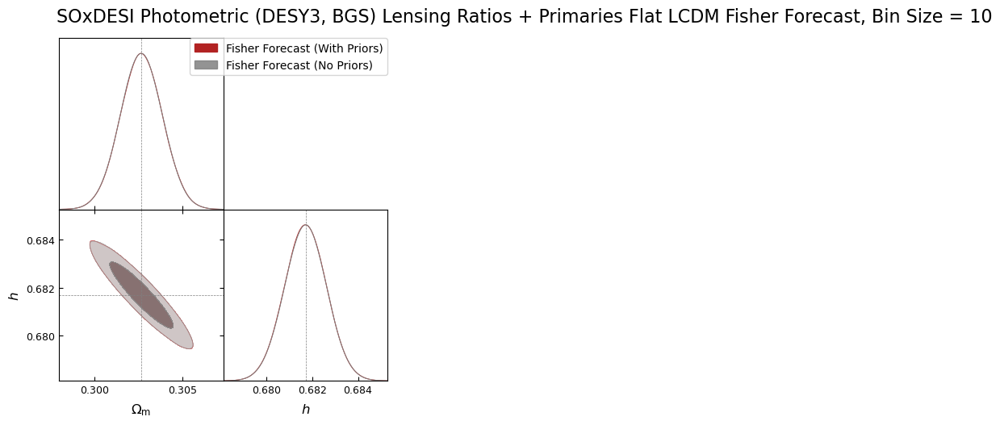

total_time:  0:03:27.700768


In [16]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=10,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=10.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LRP_Photo_BGS_DESY3_Binsize=10.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric (DESY3, BGS) Lensing Ratios + Primaries Flat LCDM Fisher Forecast, Bin Size = 10",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

# MCMC -- LR

## Syntax

In [ ]:
cd $SCRATCH
module load python
conda activate cosmo311
cd ~/DESIxSO

rm -rf /pscratch/sd/l/lialubit/run_task_*

export COBAYA_USE_FILE_LOCKING=False
export OMP_NUM_THREADS=64
export OMP_PLACES=threads
export OMP_PROC_BIND=spread

time srun -n 4 -c 64 --cpu_bind=cores bash -c '
export PYTHONPATH="${HOME}/DESIxSO:${PYTHONPATH}"
TASK_YAML="run_config_${SLURM_PROCID}.yaml"
cp yaml/flat_LCDM_LR_Photo_BGS_DES_bin1_bs50_likelihood.yaml $TASK_YAML
MY_SEED=$((1234 + SLURM_PROCID))
sed -i "s/seed:.*/seed: ${MY_SEED}/g" $TASK_YAML
$(which cobaya-run) $TASK_YAML -o /pscratch/sd/l/lialubit/run_task_${SLURM_PROCID}/chain
rm -f $TASK_YAML
'

In [ ]:
CHAIN_DEST="chains/flat_LCDM_LR_Photo_BGS_DES_bin1_bs50_likelihood"
mkdir -p $CHAIN_DEST

for i in {0..3}; do
    cp /pscratch/sd/l/lialubit/run_task_${i}/chain.1.txt $CHAIN_DEST/chain_task_${i}.txt
    ln -sf chain_task_${i}.txt $CHAIN_DEST/cosmo_run.${i}.txt
done

# Copy the paramnames file so your plotting code works immediately
cp /pscratch/sd/l/lialubit/run_task_0/chain.paramnames $CHAIN_DEST/chain_task.paramnames
cp /pscratch/sd/l/lialubit/run_task_0/chain.paramnames $CHAIN_DEST/cosmo_run.paramnames

## Fishers to Compare to

Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_100.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.256^{+0.016}_{-0.021}$ | $\Omega_{c} = 0.256^{+0.033}_{-0.032}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.253\pm 0.020$ | $\Omega_{c} = 0.253^{+0.040}_{-0.040}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.051^{+0.019}_{-0.025}$ | $\Omega_{b} = 0.051^{+0.039}_{-0.039}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.048\pm 0.024$ | $\Omega_{b} = 0.048^{+0.048}_{-0.048}$ |
| --- | --- | --- | --- |

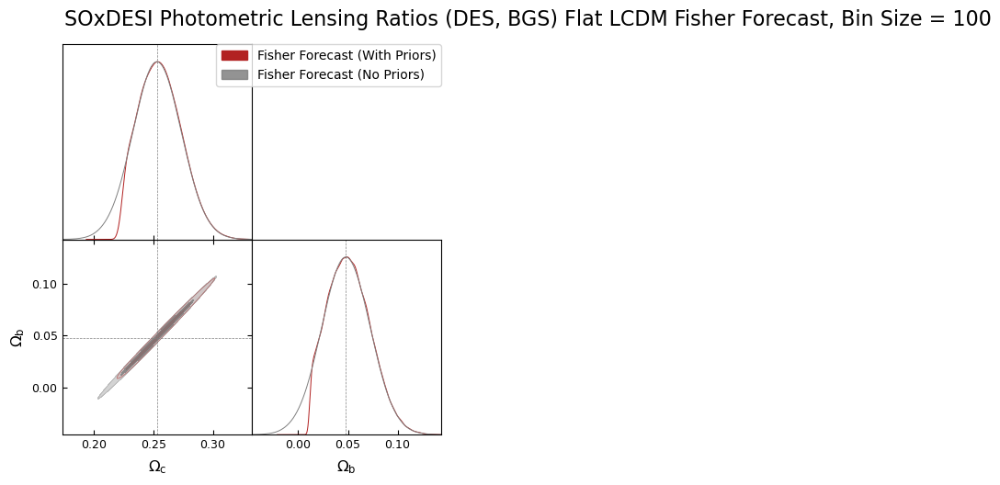

total_time:  0:00:11.372367


In [11]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions_bin1,
    source_data=DES_source_data_bin1,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise_bin1,
    shape_noise_source=DES_shape_noise_bin1,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b']
params_to_plot = ['Omega_c', 'Omega_b']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_bin1_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_bin1_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.254^{+0.014}_{-0.016}$ | $\Omega_{c} = 0.254^{+0.028}_{-0.028}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.253\pm 0.016$ | $\Omega_{c} = 0.253^{+0.031}_{-0.031}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.049^{+0.017}_{-0.019}$ | $\Omega_{b} = 0.049^{+0.033}_{-0.034}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.048\pm 0.019$ | $\Omega_{b} = 0.048^{+0.037}_{-0.037}$ |
| --- | --- | --- | --- |

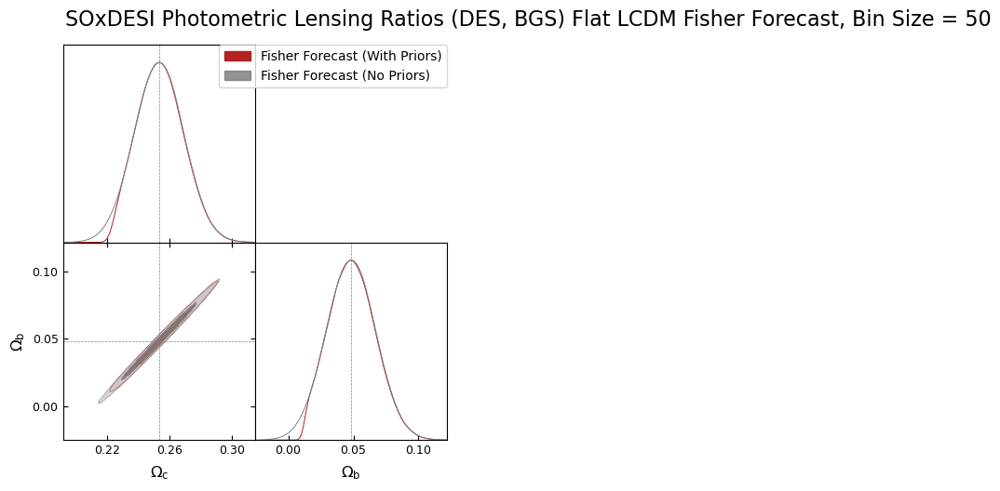

total_time:  0:00:08.218380


In [12]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions_bin1,
    source_data=DES_source_data_bin1,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise_bin1,
    shape_noise_source=DES_shape_noise_bin1,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b']
params_to_plot = ['Omega_c', 'Omega_b']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_bin1_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_bin1_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.253\pm 0.011$ | $\Omega_{c} = 0.253^{+0.021}_{-0.021}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.253\pm 0.011$ | $\Omega_{c} = 0.253^{+0.021}_{-0.021}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.048\pm 0.013$ | $\Omega_{b} = 0.048^{+0.025}_{-0.025}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.048\pm 0.013$ | $\Omega_{b} = 0.048^{+0.025}_{-0.025}$ |
| --- | --- | --- | --- |

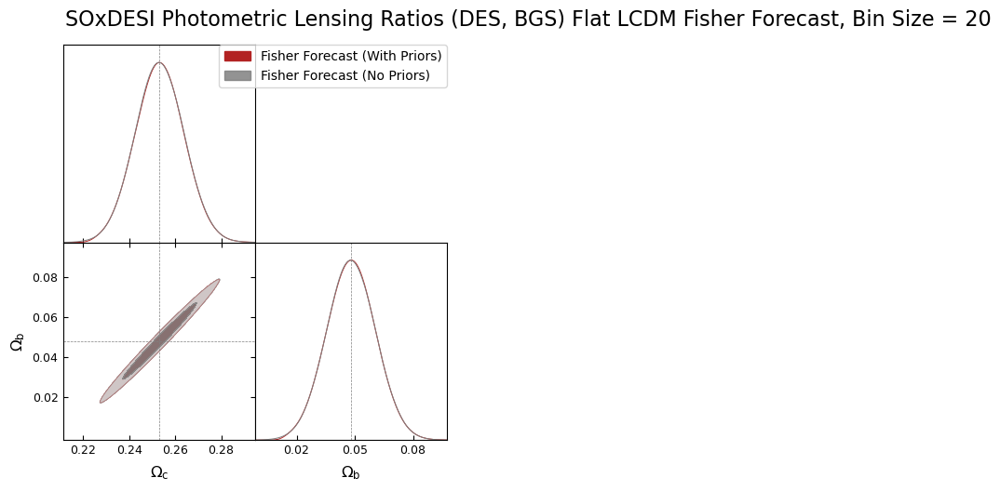

total_time:  0:00:10.023391


In [13]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions_bin1,
    source_data=DES_source_data_bin1,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise_bin1,
    shape_noise_source=DES_shape_noise_bin1,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b']
params_to_plot = ['Omega_c', 'Omega_b']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_bin1_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_bin1_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

## Covariances and MCMCs

In [14]:
# calculate and save flat LCDM fiducial data vector and covariance matrix for single bin w/lensing ratios primaries

# ensure output directory exists
os.makedirs('cobaya_data', exist_ok=True)

# extract other parameters directly, or hardcode them if they are constant for this generation step
l_min = 40
n_ell = 5000
binsize = 100
magnification_bias_lenses = 0.8

# build covariance and spectra dictionary w/o emulator, so they'll be maximally accurate
cov_obj, fiducial_spectra_dict, f_map = \
    build_covariance_from_data(
        flat_LCDM_cosmology,
        BGS_distributions_bin1,
        DES_source_data_bin1,
        f_sky_c = 0.4,
        f_sky_g = 0.4,
        f_sky_l = 0.1,
        f_sky_c_g = 0.295,
        f_sky_c_l = 0.0306,
        f_sky_g_l = 0.0306,
        f_sky_c_g_l = 0.0306,
        l_min=l_min,
        n_ell=n_ell,
        binsize=binsize,
        shot_noise_lens=BGS_shot_noise_bin1,
        shape_noise_source=DES_shape_noise_bin1,
        cmb_noise_kk=SO_cmb_noise_kk,
        cmb_noise_TT=SO_goal_cmb_noise_TT,
        cmb_noise_EE=SO_goal_cmb_noise_EE,
        magnification_bias_lenses=magnification_bias_lenses,
        desired_spectra=['CG', 'GL'],
        linear_emulator=None,
        boost_emulator=None,
        cmb_primaries = True,
        z_max = 6,
        n_chi = 1024
    )

# get the covariance matrix
covariance_matrix = cov_obj.matrix

# extract and flatten the fiducial data vector
observed_data_vector = build_data_vector(forecast_map = f_map, spectra_dict = fiducial_spectra_dict, n_ell = n_ell, binsize = binsize)

# Save to files
data_vector_filename = 'cobaya_data/flat_LCDM_LR_Photo_BGS_DES_bin1_data_vector_binsize_100.npy'
covariance_filename = 'cobaya_data/flat_LCDM_LR_Photo_BGS_DES_bin1_covariance_matrix_binsize_100.npy'

np.save(data_vector_filename, observed_data_vector)
np.save(covariance_filename, covariance_matrix)

In [15]:
# calculate and save flat LCDM fiducial data vector and covariance matrix for single bin w/lensing ratios primaries

# ensure output directory exists
os.makedirs('cobaya_data', exist_ok=True)

# extract other parameters directly, or hardcode them if they are constant for this generation step
l_min = 40
n_ell = 5000
binsize = 50
magnification_bias_lenses = 0.8

# build covariance and spectra dictionary w/o emulator, so they'll be maximally accurate
cov_obj, fiducial_spectra_dict, f_map = \
    build_covariance_from_data(
        flat_LCDM_cosmology,
        BGS_distributions_bin1,
        DES_source_data_bin1,
        f_sky_c = 0.4,
        f_sky_g = 0.4,
        f_sky_l = 0.1,
        f_sky_c_g = 0.295,
        f_sky_c_l = 0.0306,
        f_sky_g_l = 0.0306,
        f_sky_c_g_l = 0.0306,
        l_min=l_min,
        n_ell=n_ell,
        binsize=binsize,
        shot_noise_lens=BGS_shot_noise_bin1,
        shape_noise_source=DES_shape_noise_bin1,
        cmb_noise_kk=SO_cmb_noise_kk,
        cmb_noise_TT=SO_goal_cmb_noise_TT,
        cmb_noise_EE=SO_goal_cmb_noise_EE,
        magnification_bias_lenses=magnification_bias_lenses,
        desired_spectra=['CG', 'GL'],
        linear_emulator=None,
        boost_emulator=None,
        cmb_primaries = True,
        z_max = 6,
        n_chi = 1024
    )

# get the covariance matrix
covariance_matrix = cov_obj.matrix

# extract and flatten the fiducial data vector
observed_data_vector = build_data_vector(forecast_map = f_map, spectra_dict = fiducial_spectra_dict, n_ell = n_ell, binsize = binsize)

# Save to files
data_vector_filename = 'cobaya_data/flat_LCDM_LR_Photo_BGS_DES_bin1_data_vector_binsize_50.npy'
covariance_filename = 'cobaya_data/flat_LCDM_LR_Photo_BGS_DES_bin1_covariance_matrix_binsize_50.npy'

np.save(data_vector_filename, observed_data_vector)
np.save(covariance_filename, covariance_matrix)

In [16]:
# calculate and save flat LCDM fiducial data vector and covariance matrix for single bin w/lensing ratios primaries

# ensure output directory exists
os.makedirs('cobaya_data', exist_ok=True)

# extract other parameters directly, or hardcode them if they are constant for this generation step
f_sky = 0.4
l_min = 40
n_ell = 5000
binsize = 20
magnification_bias_lenses = 0.8

# build covariance and spectra dictionary w/o emulator, so they'll be maximally accurate
cov_obj, fiducial_spectra_dict, f_map = \
    build_covariance_from_data(
        flat_LCDM_cosmology,
        BGS_distributions_bin1,
        DES_source_data_bin1,
        f_sky_c = 0.4,
        f_sky_g = 0.4,
        f_sky_l = 0.1,
        f_sky_c_g = 0.295,
        f_sky_c_l = 0.0306,
        f_sky_g_l = 0.0306,
        f_sky_c_g_l = 0.0306,
        l_min=l_min,
        n_ell=n_ell,
        binsize=binsize,
        shot_noise_lens=BGS_shot_noise_bin1,
        shape_noise_source=DES_shape_noise_bin1,
        cmb_noise_kk=SO_cmb_noise_kk,
        cmb_noise_TT=SO_goal_cmb_noise_TT,
        cmb_noise_EE=SO_goal_cmb_noise_EE,
        magnification_bias_lenses=magnification_bias_lenses,
        desired_spectra=['CG', 'GL'],
        linear_emulator=None,
        boost_emulator=None,
        cmb_primaries = True,
        z_max = 6,
        n_chi = 1024
    )

# get the covariance matrix
covariance_matrix = cov_obj.matrix

# extract and flatten the fiducial data vector
observed_data_vector = build_data_vector(forecast_map = f_map, spectra_dict = fiducial_spectra_dict, n_ell = n_ell, binsize = binsize)

# Save to files
data_vector_filename = 'cobaya_data/flat_LCDM_LR_Photo_BGS_DES_bin1_data_vector_binsize_20.npy'
covariance_filename = 'cobaya_data/flat_LCDM_LR_Photo_BGS_DES_bin1_covariance_matrix_binsize_20.npy'

np.save(data_vector_filename, observed_data_vector)
np.save(covariance_filename, covariance_matrix)

Reading fiducial values from: /global/homes/l/lialubit/DESIxSO/yaml/flat_LCDM_LR_Photo_BGS_DES_bin1_bs100_likelihood.yaml
Processing 4 chains from: /global/homes/l/lialubit/DESIxSO/chains/flat_LCDM_LR_Photo_BGS_DES_bin1_bs100_likelihood


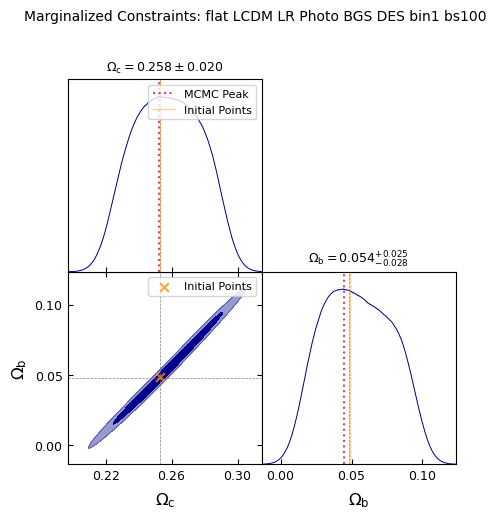

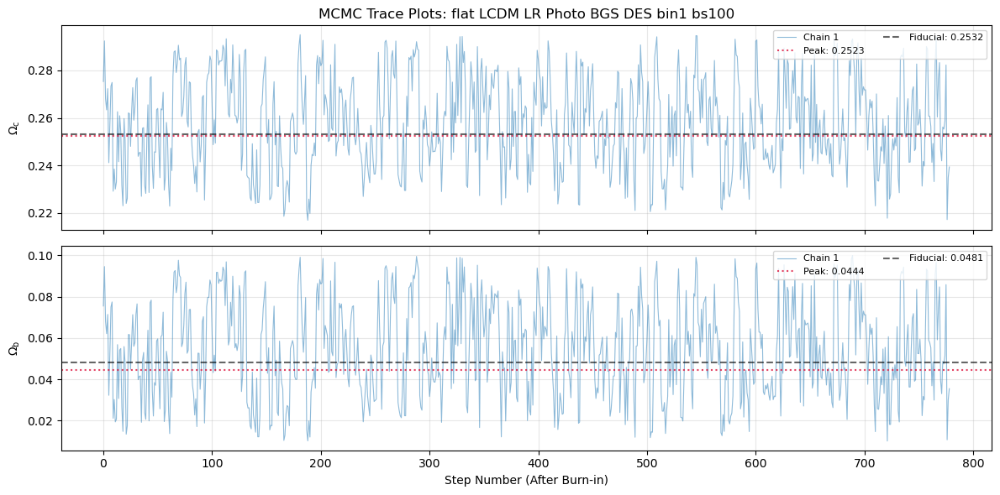

| Parameter | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :---: | :---: |
| **$\Omega_\mathrm{c}$** | $\Omega_\mathrm{c} = 0.258\pm 0.020$ | $\Omega_\mathrm{c} = 0.258^{+0.035}_{-0.035}$ |
| --- | --- | --- |
| **$\Omega_\mathrm{b}$** | $\Omega_\mathrm{b} = 0.054^{+0.025}_{-0.028}$ | $\Omega_\mathrm{b} = 0.054^{+0.042}_{-0.040}$ |
| --- | --- | --- |

In [20]:
# plot MCMC for binsize 100

# 60 min, [0 : mcmc]  - Convergence of means: R-1 = 0.010080 after 5016 accepted steps = sum([1293, 1244, 1200, 1279])

# Define your environment paths
chain_folder = os.path.expanduser('~/DESIxSO/chains/flat_LCDM_LR_Photo_BGS_DES_bin1_bs100_likelihood')
yaml_file_path = '/global/homes/l/lialubit/DESIxSO/yaml/flat_LCDM_LR_Photo_BGS_DES_bin1_bs100_likelihood.yaml'
params_to_sample = ['Omega_c', 'Omega_b']
params_to_plot = ['Omega_c', 'Omega_b']

# Call the clean-name variant of the function
plot_cobaya_mcmc_results(
    chain_dir=chain_folder,
    yaml_path=yaml_file_path,
    sampled_params=params_to_sample,
    plot_params=params_to_plot,
    num_chains=4,
    burn_in_fraction=0.4,
    plot_triangle=True,
    plot_traces=True,
    save_triangle=False,
    save_traces=False,
    print_summary=True,
)

Reading fiducial values from: /global/homes/l/lialubit/DESIxSO/yaml/flat_LCDM_LR_Photo_BGS_DES_bin1_bs50_likelihood.yaml
Processing 4 chains from: /global/homes/l/lialubit/DESIxSO/chains/flat_LCDM_LR_Photo_BGS_DES_bin1_bs50_likelihood


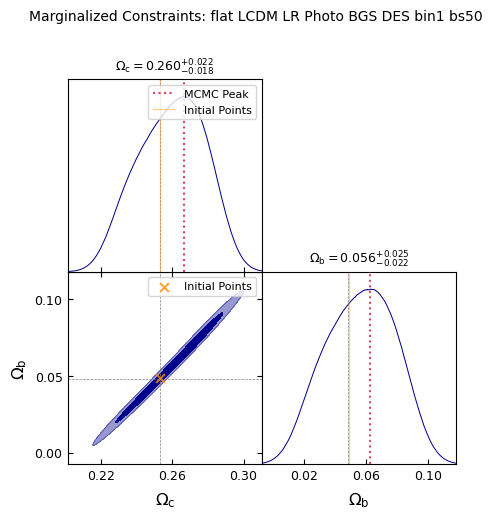

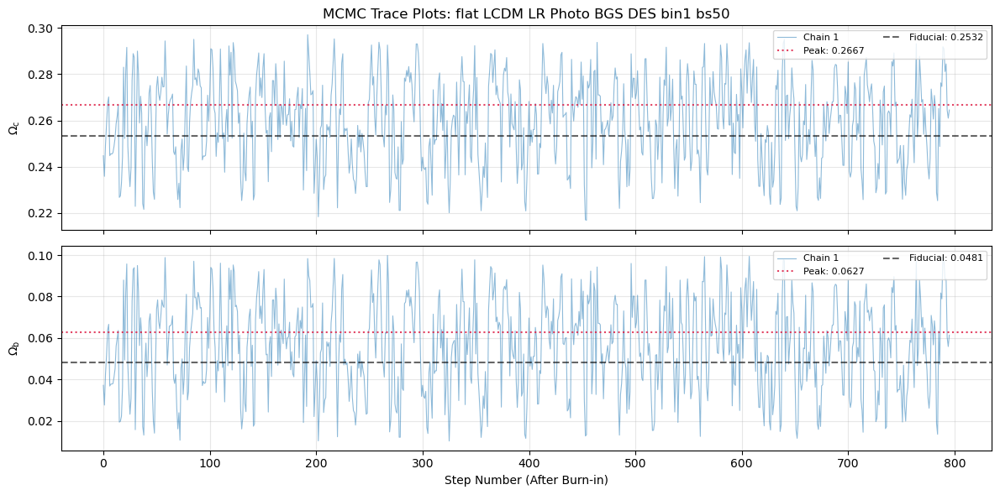

| Parameter | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :---: | :---: |
| **$\Omega_\mathrm{c}$** | $\Omega_\mathrm{c} = 0.260^{+0.022}_{-0.018}$ | $\Omega_\mathrm{c} = 0.260^{+0.032}_{-0.035}$ |
| --- | --- | --- |
| **$\Omega_\mathrm{b}$** | $\Omega_\mathrm{b} = 0.056^{+0.025}_{-0.022}$ | $\Omega_\mathrm{b} = 0.056^{+0.040}_{-0.041}$ |
| --- | --- | --- |

In [23]:
# plot MCMC for binsize 50

# Define your environment paths
chain_folder = os.path.expanduser('~/DESIxSO/chains/flat_LCDM_LR_Photo_BGS_DES_bin1_bs50_likelihood')
yaml_file_path = '/global/homes/l/lialubit/DESIxSO/yaml/flat_LCDM_LR_Photo_BGS_DES_bin1_bs50_likelihood.yaml'
params_to_sample = ['Omega_c', 'Omega_b']
params_to_plot = ['Omega_c', 'Omega_b']

# Call the clean-name variant of the function
plot_cobaya_mcmc_results(
    chain_dir=chain_folder,
    yaml_path=yaml_file_path,
    sampled_params=params_to_sample,
    plot_params=params_to_plot,
    num_chains=4,
    burn_in_fraction=0.4,
    plot_triangle=True,
    plot_traces=True,
    save_triangle=False,
    save_traces=False,
    print_summary=True,
)

In [ ]:
# plot MCMC for binsize 20

# Define your environment paths
chain_folder = os.path.expanduser('~/DESIxSO/chains/flat_LCDM_LR_Photo_BGS_DES_bin1_bs20_likelihood')
yaml_file_path = '/global/homes/l/lialubit/DESIxSO/yaml/flat_LCDM_LR_Photo_BGS_DES_bin1_bs20_likelihood.yaml'
params_to_sample = ['Omega_c', 'Omega_b']
params_to_plot = ['Omega_c', 'Omega_b']

# Call the clean-name variant of the function
plot_cobaya_mcmc_results(
    chain_dir=chain_folder,
    yaml_path=yaml_file_path,
    sampled_params=params_to_sample,
    plot_params=params_to_plot,
    num_chains=4,
    burn_in_fraction=0.4,
    plot_triangle=True,
    plot_traces=True,
    save_triangle=False,
    save_traces=False,
    print_summary=True,
)

## Fisher/MCMC Overlays

Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_100.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.256^{+0.016}_{-0.021}$ | $\Omega_{c} = 0.256^{+0.033}_{-0.032}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.253\pm 0.020$ | $\Omega_{c} = 0.253^{+0.040}_{-0.040}$ |
|  | Cobaya MCMC | $\Omega_{c} = 0.258^{+0.022}_{-0.020}$ | $\Omega_{c} = 0.258^{+0.033}_{-0.035}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.051^{+0.019}_{-0.025}$ | $\Omega_{b} = 0.051^{+0.039}_{-0.039}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.048\pm 0.024$ | $\Omega_{b} = 0.048^{+0.047}_{-0.048}$ |
|  | Cobaya MCMC | $\Omega_{b} = 0.055\pm 0.023$ | $\Omega_{b} = 0.055^{+0.040}_{-0.040}$ |
| --- | --- | --- | --- |

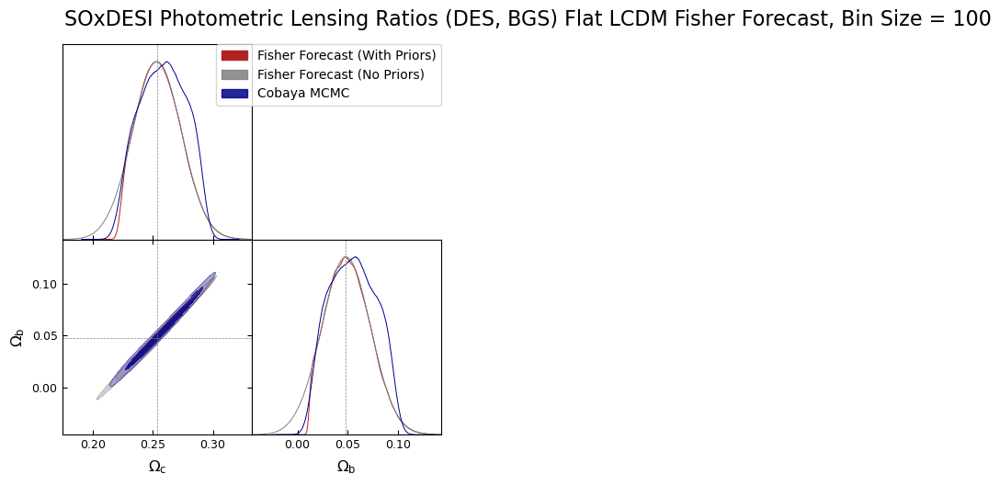

total_time:  0:00:08.210084


In [21]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions_bin1,
    source_data=DES_source_data_bin1,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise_bin1,
    shape_noise_source=DES_shape_noise_bin1,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b']
params_to_plot = ['Omega_c', 'Omega_b']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_bin1_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_bin1_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir='chains/flat_LCDM_LR_Photo_BGS_DES_bin1_bs100_likelihood',
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    num_chains=4, 
    burn_in_fraction=0.2,
    overlay_priorless=True,
    num_samples=200000,
    plot_folder = "plots/Fisher Forecasts",
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.254^{+0.014}_{-0.016}$ | $\Omega_{c} = 0.254^{+0.028}_{-0.028}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.253\pm 0.016$ | $\Omega_{c} = 0.253^{+0.031}_{-0.031}$ |
|  | Cobaya MCMC | $\Omega_{c} = 0.259^{+0.021}_{-0.019}$ | $\Omega_{c} = 0.259^{+0.033}_{-0.034}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.049\pm 0.018$ | $\Omega_{b} = 0.049^{+0.033}_{-0.034}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.048\pm 0.019$ | $\Omega_{b} = 0.048^{+0.037}_{-0.037}$ |
|  | Cobaya MCMC | $\Omega_{b} = 0.056\pm 0.023$ | $\Omega_{b} = 0.056^{+0.041}_{-0.040}$ |
| --- | --- | --- | --- |

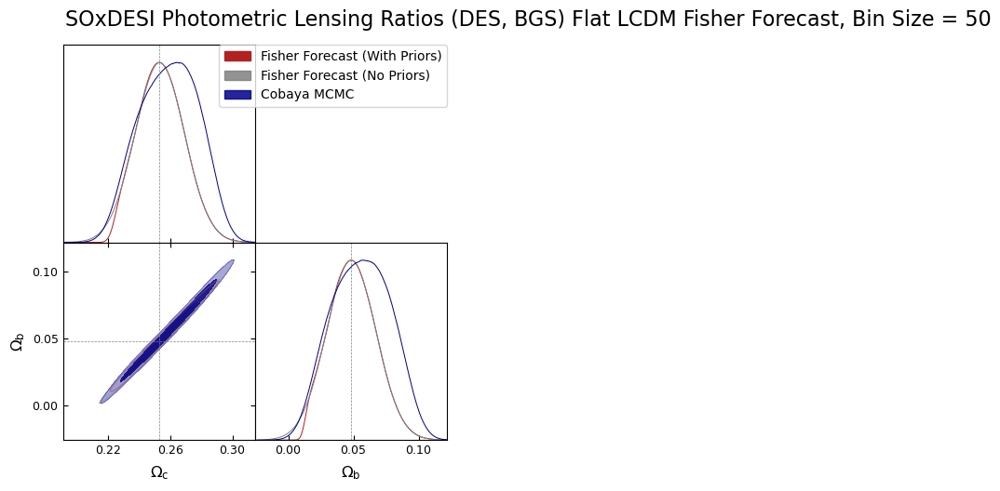

total_time:  0:00:17.172806


In [24]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions_bin1,
    source_data=DES_source_data_bin1,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise_bin1,
    shape_noise_source=DES_shape_noise_bin1,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b']
params_to_plot = ['Omega_c', 'Omega_b']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_bin1_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_bin1_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir='chains/flat_LCDM_LR_Photo_BGS_DES_bin1_bs50_likelihood',
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    num_chains=4, 
    burn_in_fraction=0.2,
    overlay_priorless=True,
    num_samples=200000,
    plot_folder = "plots/Fisher Forecasts",
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

In [ ]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions_bin1,
    source_data=DES_source_data_bin1,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise_bin1,
    shape_noise_source=DES_shape_noise_bin1,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b']
params_to_plot = ['Omega_c', 'Omega_b']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_bin1_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_bin1_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir='chains/flat_LCDM_LR_Photo_BGS_DES_bin1_bs20_likelihood',
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    num_chains=4, 
    burn_in_fraction=0.2,
    overlay_priorless=True,
    num_samples=200000,
    plot_folder = "plots/Fisher Forecasts",
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

# Step Dict Testing

## LR

Curved w0waCDM:

Omega_b = 0.04974
Omega_c = 0.2680
Omega_k = 0.00077
w0 = -0.7621
wa = -0.8073
h = 0.6682
n_s = 0.9644
A_s = 2.095e-9
ln1010A_s = 3.04213864637
Neff = 3.046 # SM prediction
m_nu = 0.06
T_CMB = 2.7255


-- do a step sweep with step size from 10^-1 to 10^-5 times each parameter and see where things stablize

In [ ]:
# make step dicts, with steps relative to parameter values

cosmo_dict = {
    'Omega_b': 0.04974,
    'Omega_c': 0.2680,
    'Omega_k': 0.00077,
    'w0': -0.7621,
    'wa': -0.8073,
    'h': 0.6682,
    'n_s': 0.9644,
    'A_s': 2.095e-9,
    'Neff': 3.046,
    'm_nu': 0.06,
    'T_CMB': 2.7255,
}

step_dict_1 = {key: val * 1e-1 for key, val in cosmo_dict.items()}
step_dict_2 = {key: val * 1e-2 for key, val in cosmo_dict.items()}
step_dict_3 = {key: val * 1e-3 for key, val in cosmo_dict.items()}
step_dict_4 = {key: val * 1e-4 for key, val in cosmo_dict.items()}
step_dict_5 = {key: val * 1e-5 for key, val in cosmo_dict.items()}

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_100.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3033^{+0.0028}_{-0.0040}$ | $\Omega_m = 0.3033^{+0.0065}_{-0.0058}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3030^{+0.0033}_{-0.0044}$ | $\Omega_m = 0.3030^{+0.0075}_{-0.0071}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.70^{+0.11}_{-0.15}$ | $h = 0.70^{+0.23}_{-0.21}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.15$ | $h = 0.68^{+0.30}_{-0.30}$ |
| --- | --- | --- | --- |

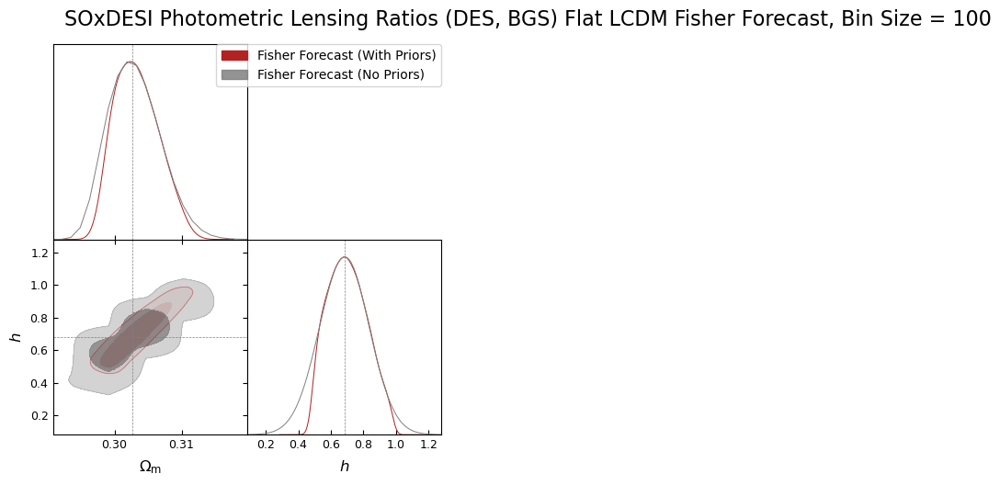

total_time:  0:00:30.104011


In [12]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 
            
# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_w0waCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s', 'Omega_k', 'w0', 'wa']
params_to_plot = params_to_sample

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Curved_w0waCDM_LR_Photo_BGS_DESY3_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Curved_w0wa_LR_Photo_BGS_DESY5_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Curved w0wa0 Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

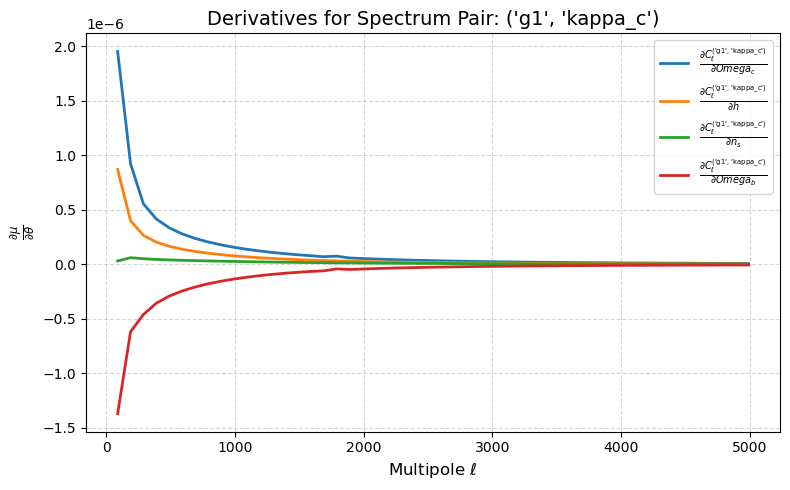

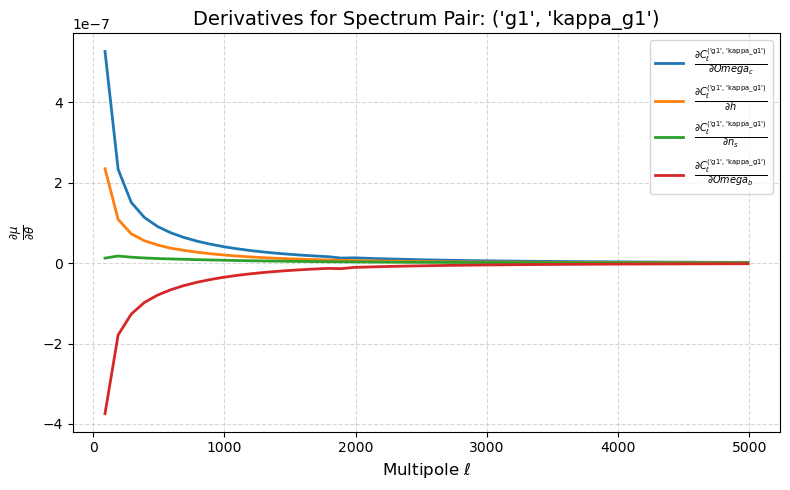

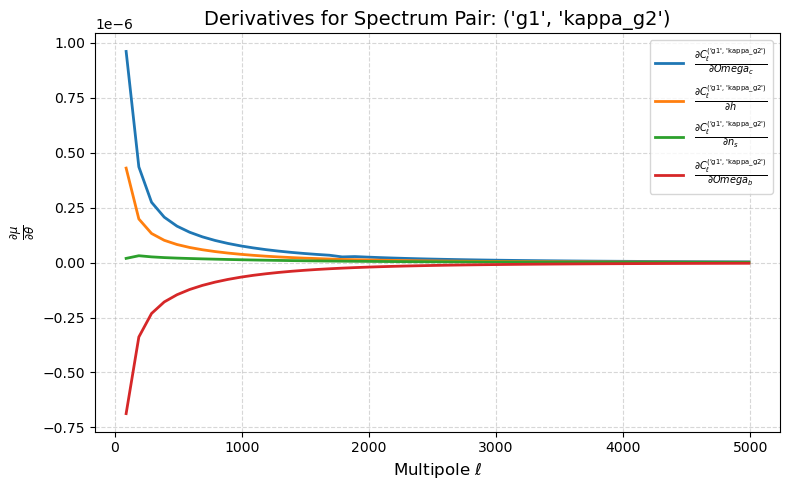

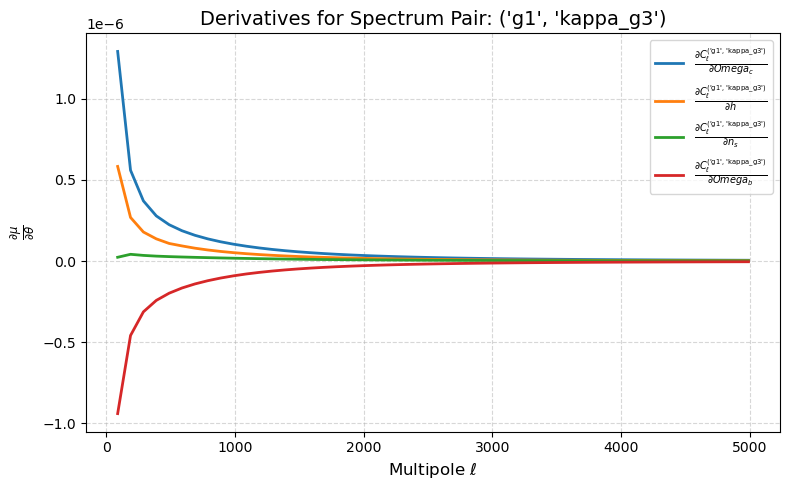

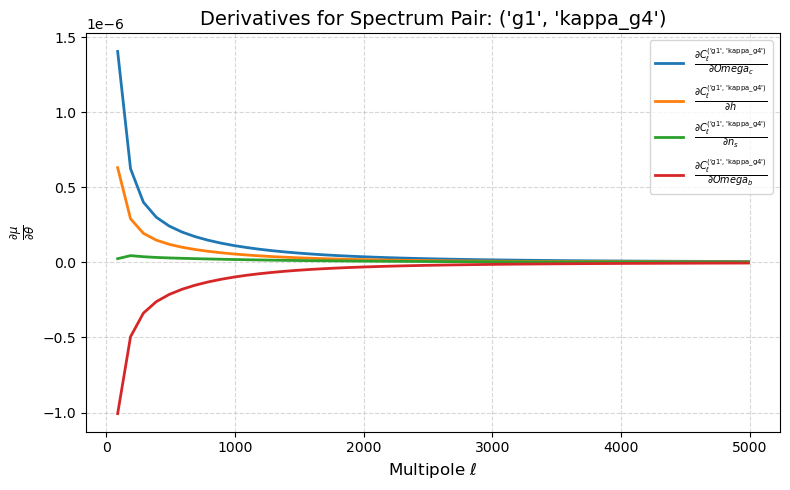

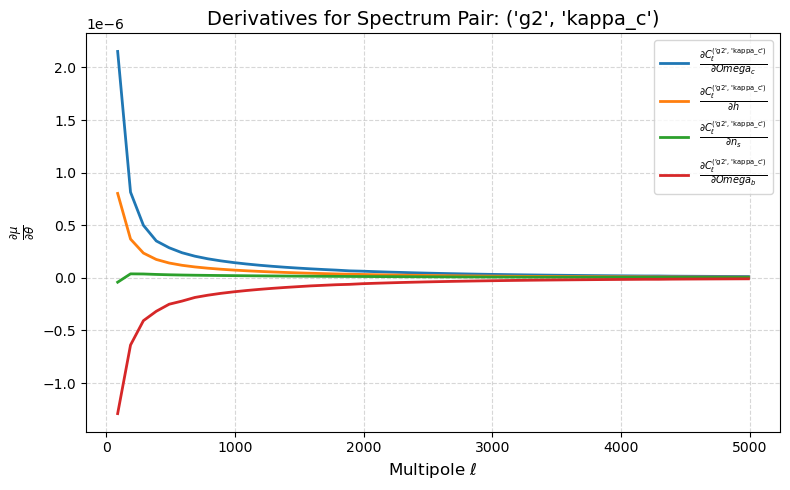

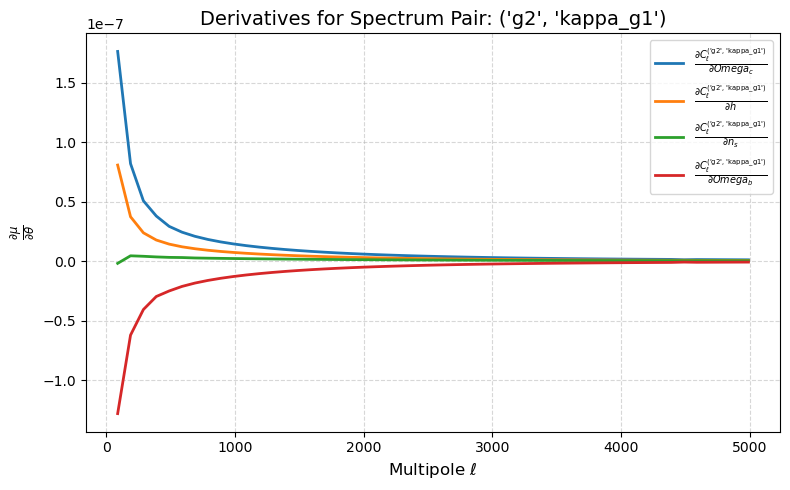

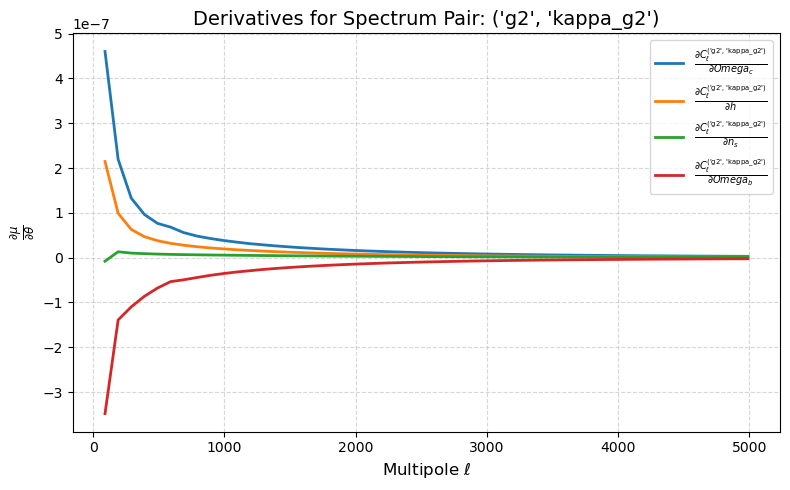

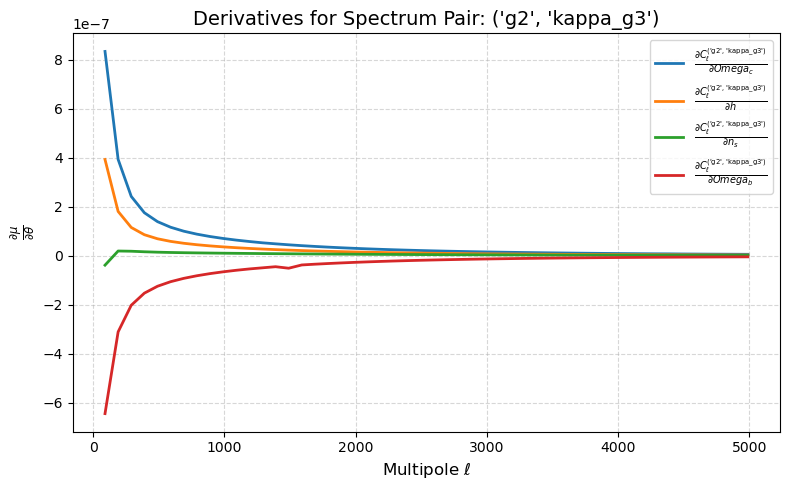

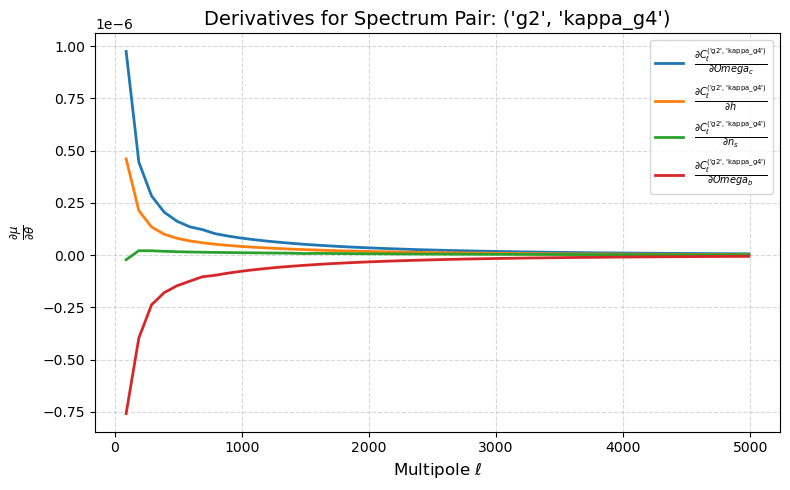

In [13]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.303\pm 0.019$ | $\Omega_m = 0.303^{+0.037}_{-0.037}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.30\pm 0.13$ | $\Omega_m = 0.303^{+0.082}_{-0.083}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.67^{+0.15}_{-0.13}$ | $h = 0.67^{+0.26}_{-0.26}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.16$ | $h = 0.68^{+0.31}_{-0.31}$ |
| --- | --- | --- | --- |

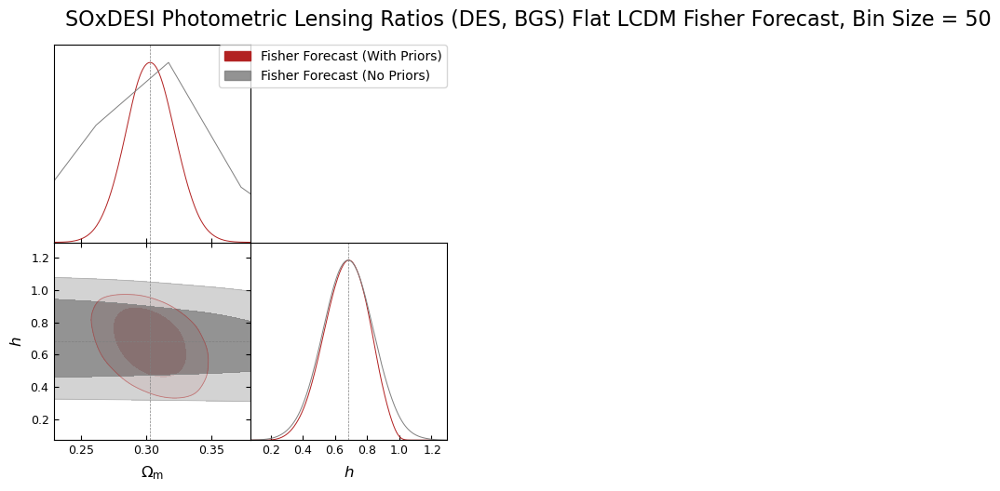

total_time:  0:00:43.486659


In [14]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 
            
# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

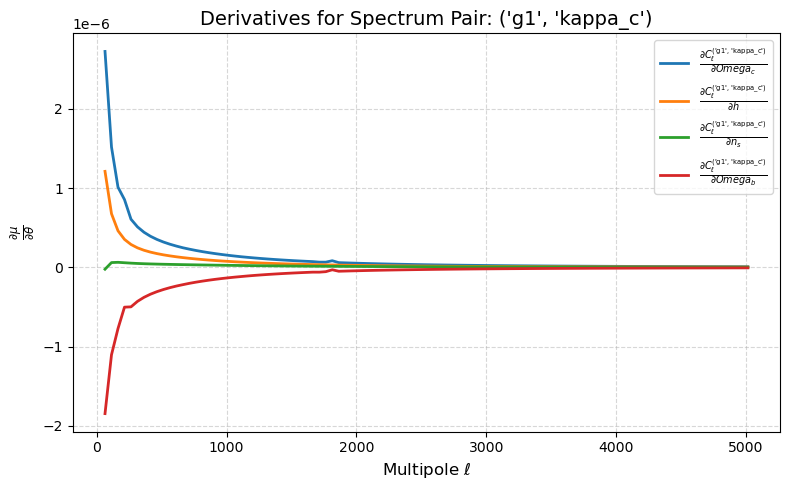

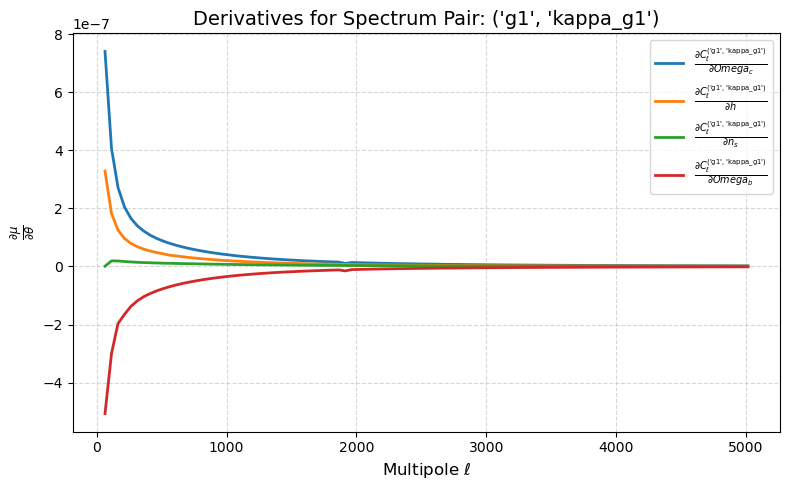

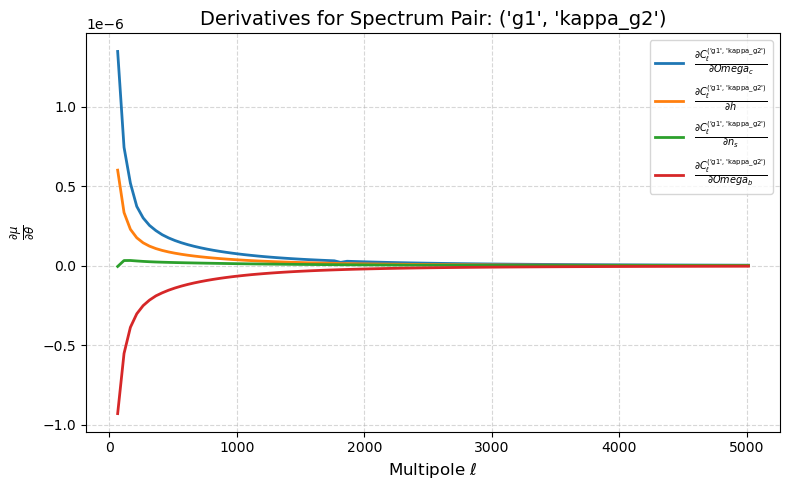

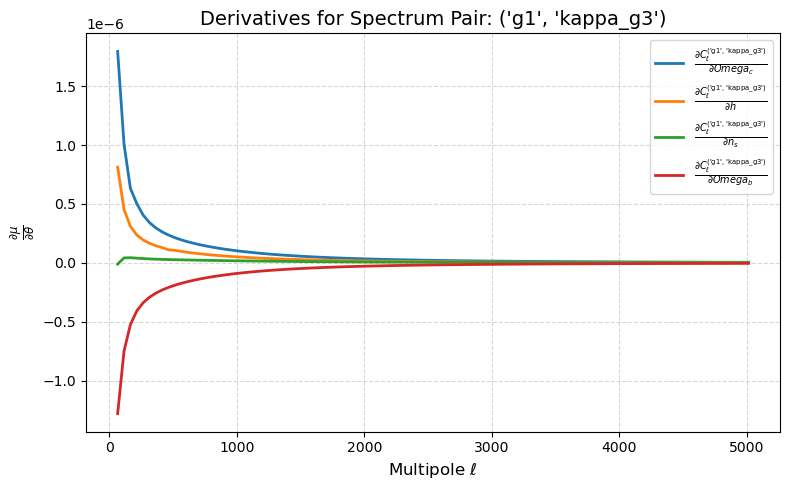

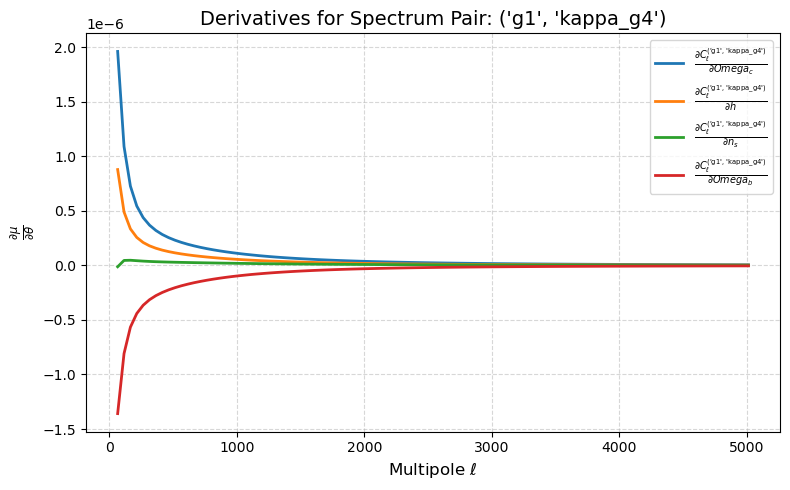

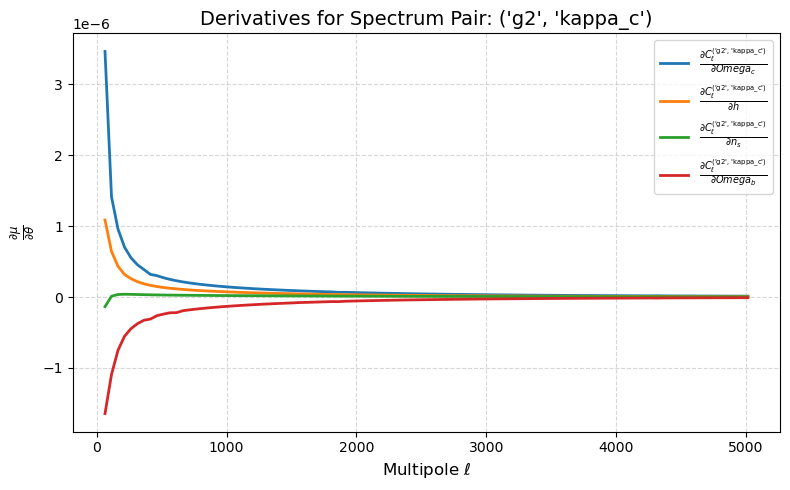

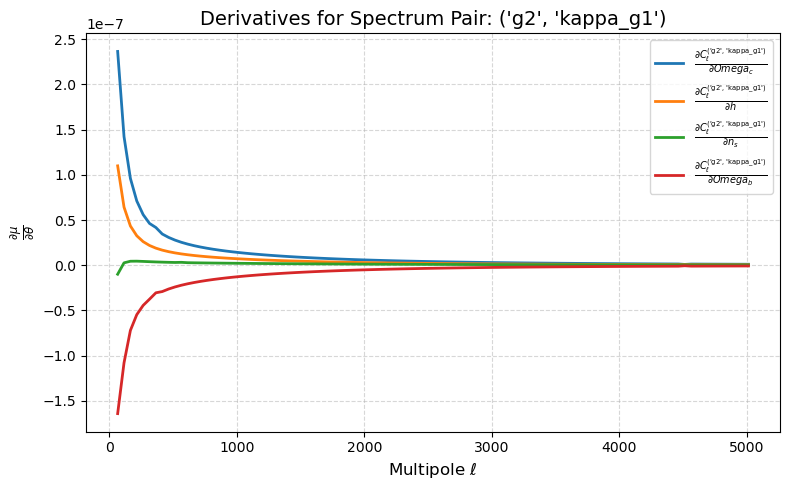

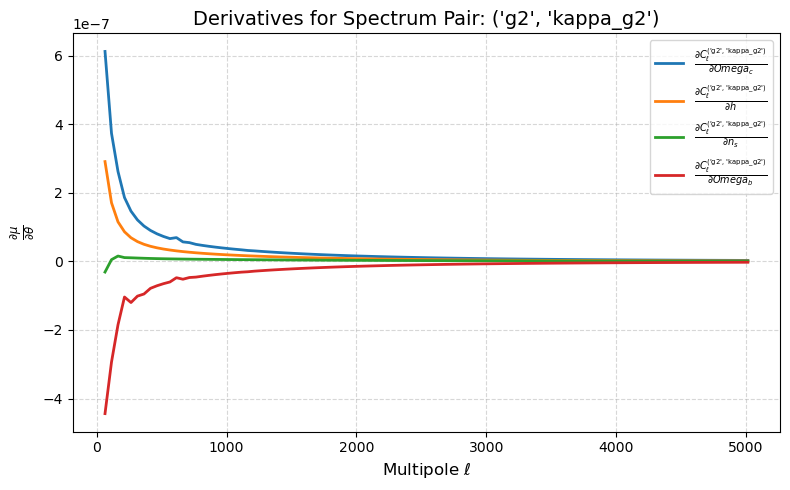

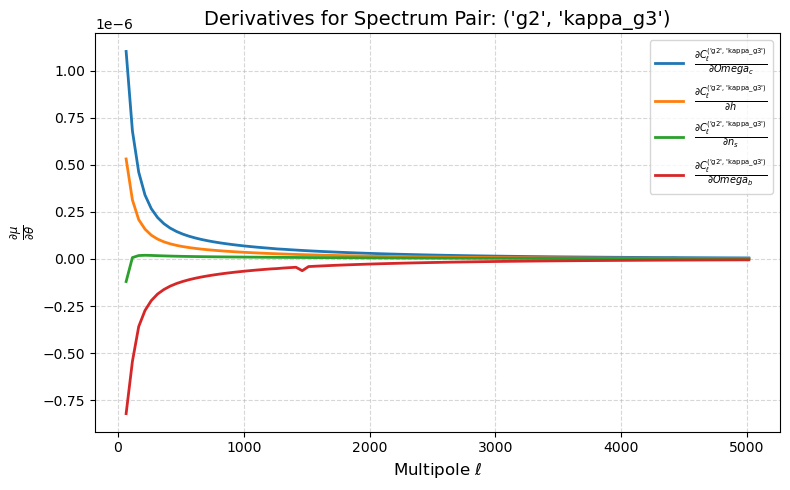

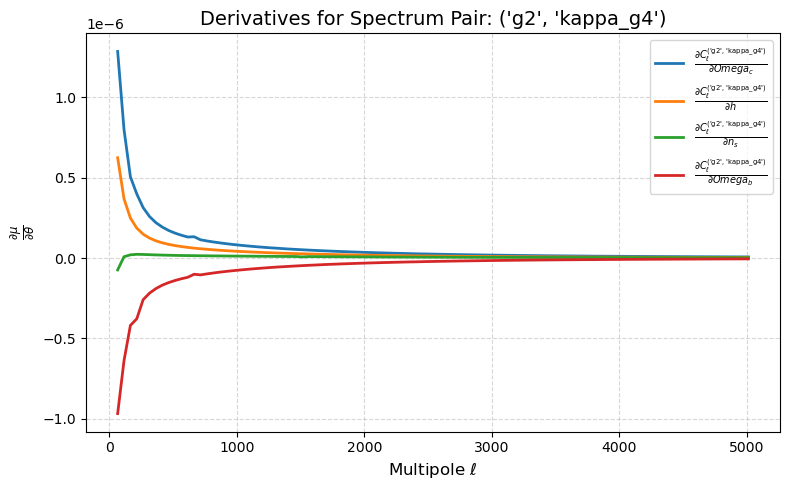

In [15]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.303\pm 0.011$ | $\Omega_m = 0.303^{+0.021}_{-0.021}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.303\pm 0.011$ | $\Omega_m = 0.303^{+0.021}_{-0.021}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.680\pm 0.093$ | $h = 0.68^{+0.18}_{-0.19}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.095$ | $h = 0.68^{+0.19}_{-0.19}$ |
| --- | --- | --- | --- |

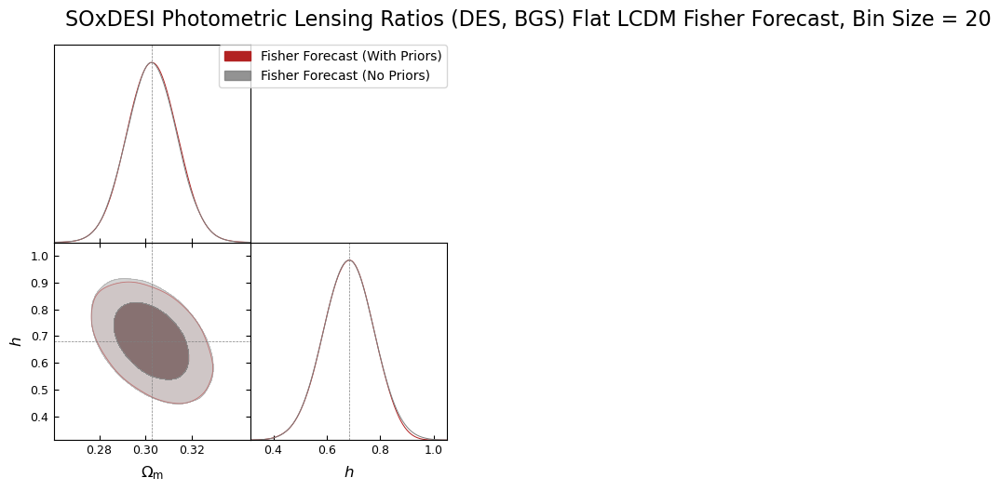

total_time:  0:01:11.843186


In [16]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

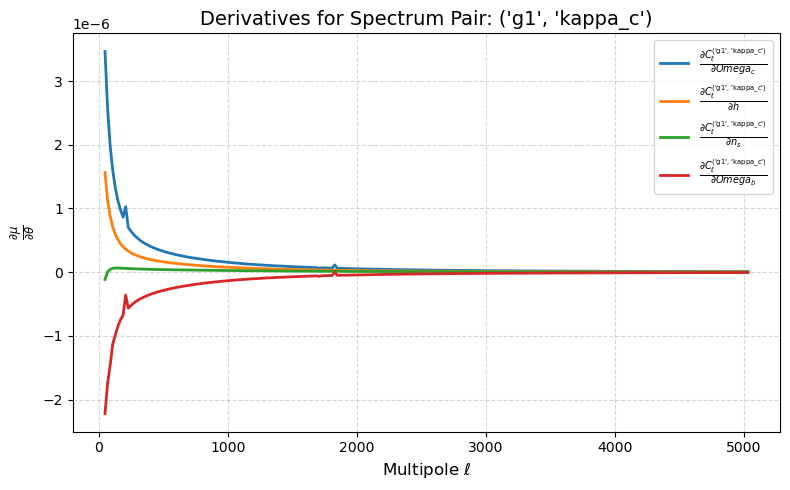

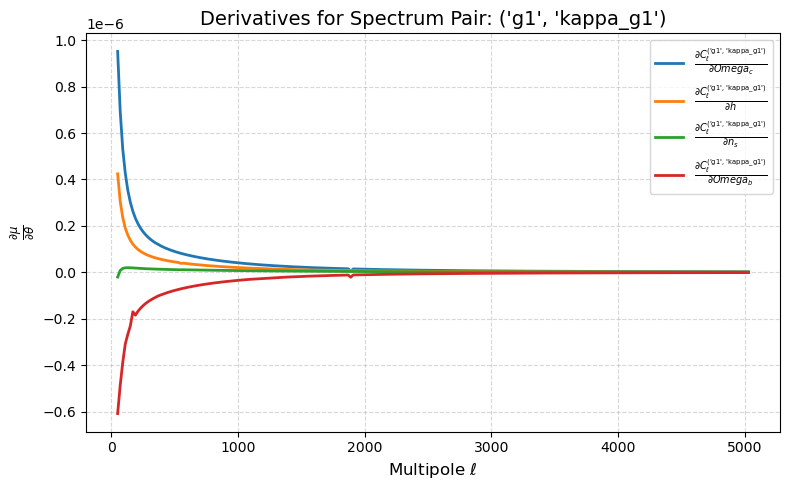

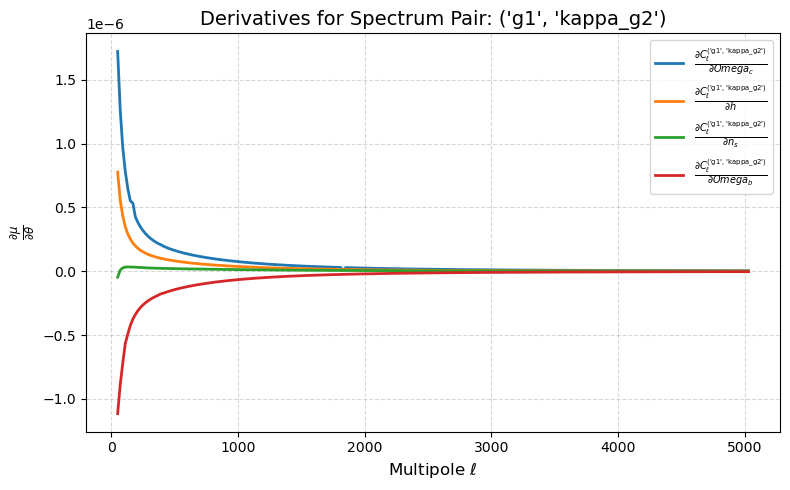

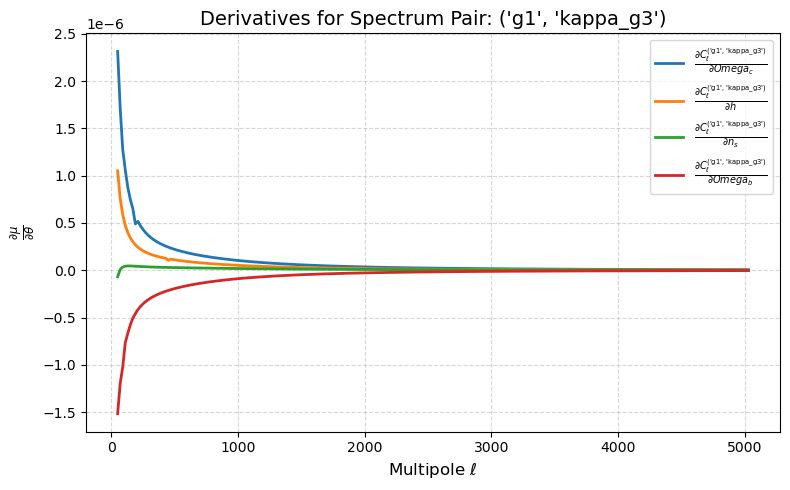

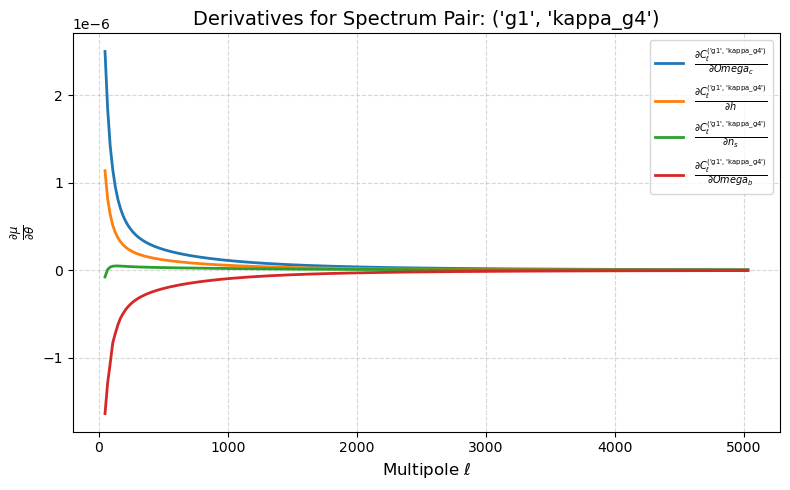

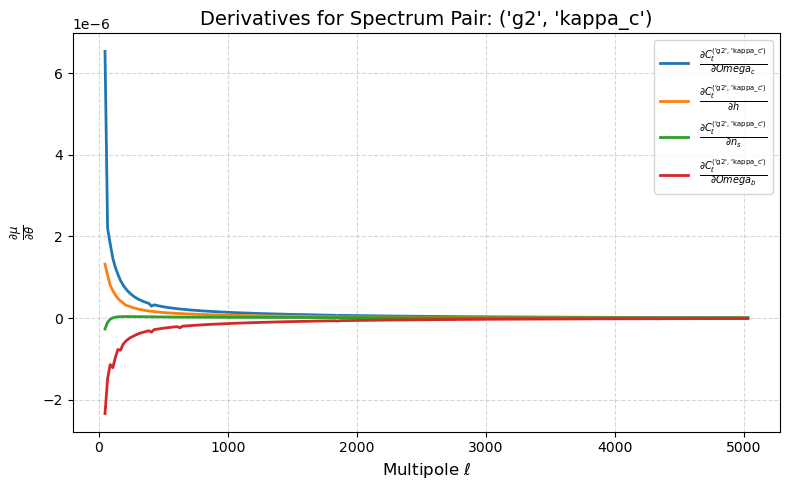

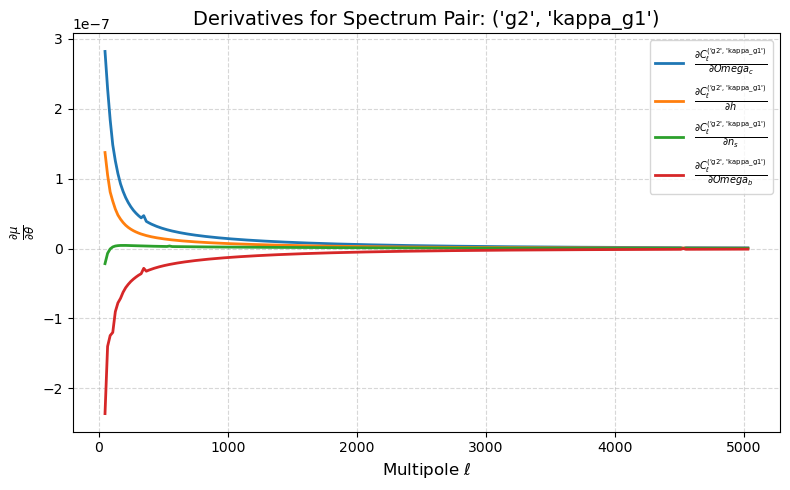

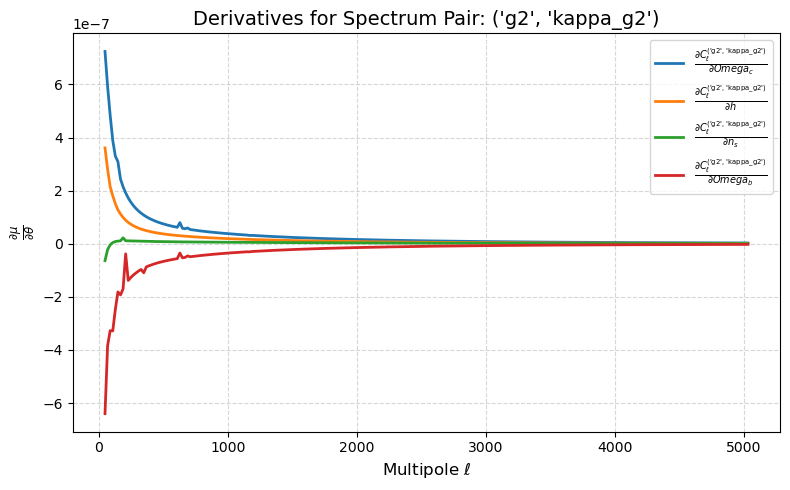

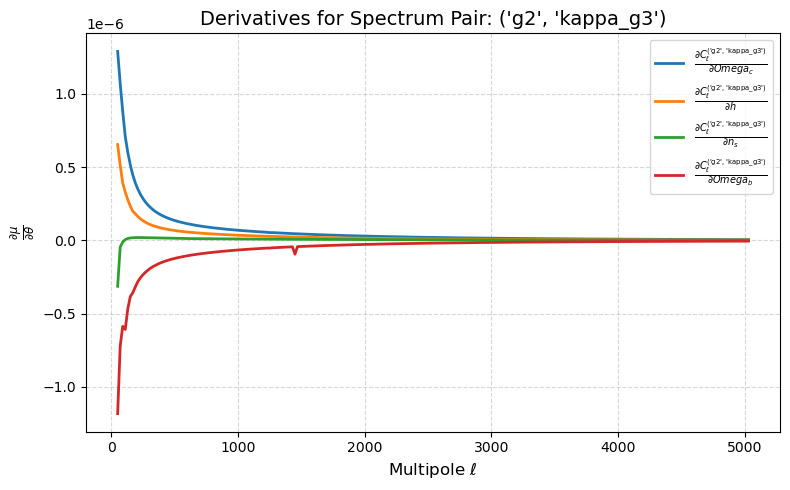

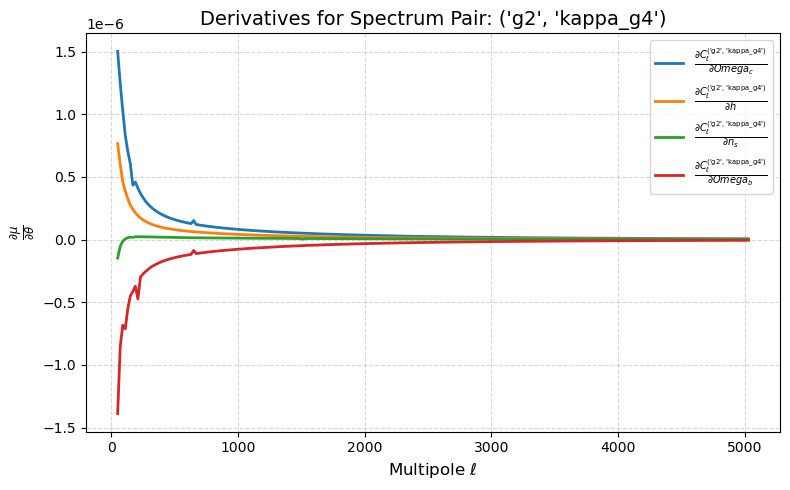

In [17]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_100.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3051^{+0.0089}_{-0.010}$ | $\Omega_m = 0.305^{+0.019}_{-0.018}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.309$ | $\Omega_m = \Omega_\mathrm{m} < 0.323$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.72\pm 0.14$ | $h = 0.72^{+0.27}_{-0.24}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.22$ | $h = 0.68^{+0.43}_{-0.43}$ |
| --- | --- | --- | --- |

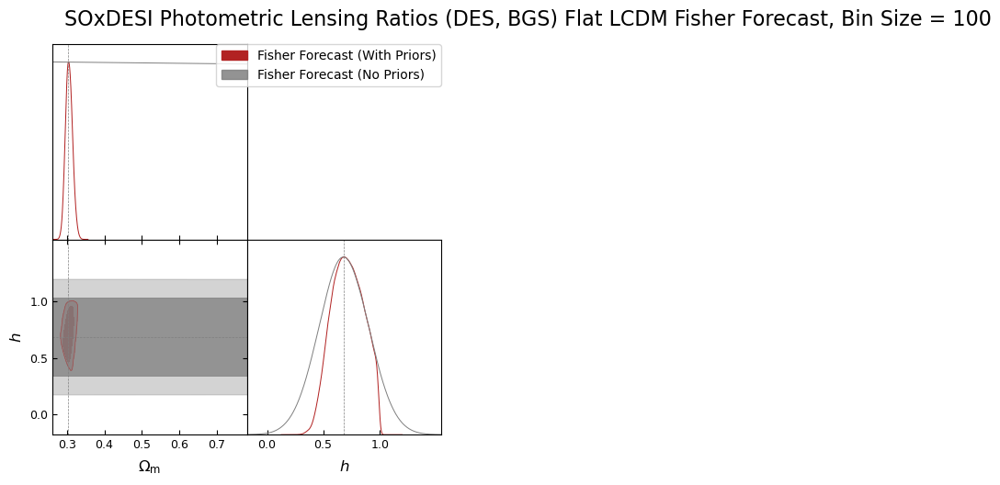

total_time:  0:00:34.117427


In [19]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 


multiplier = 3

for key in step_dict:
    step_dict[key] *= multiplier

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

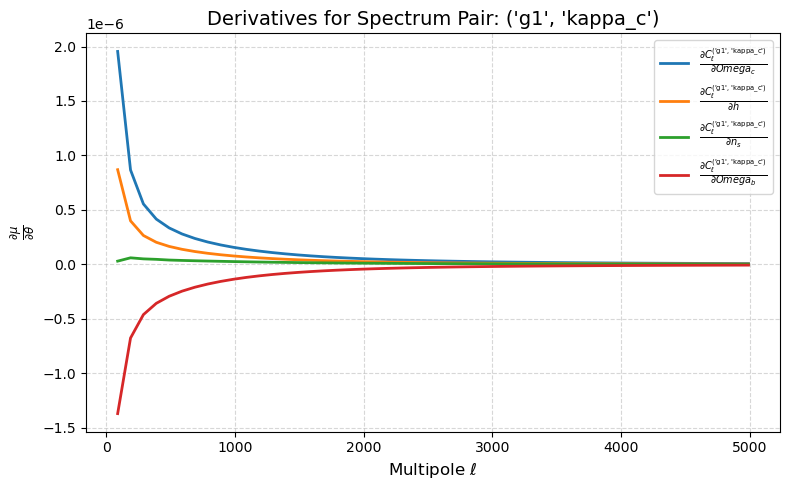

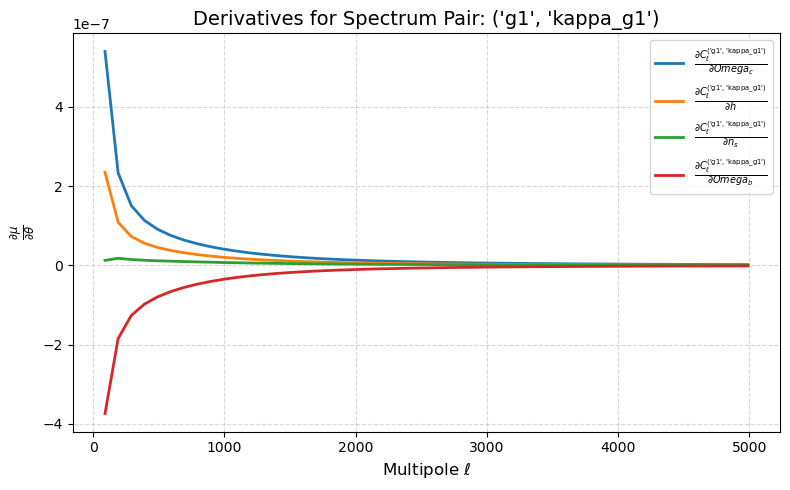

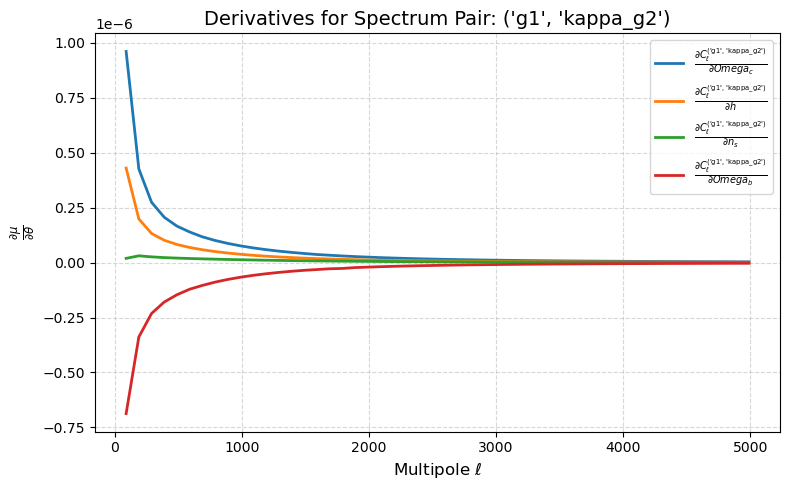

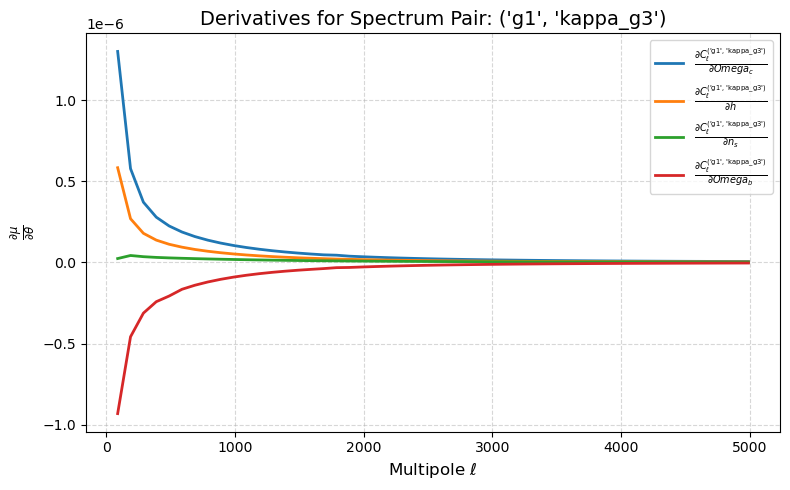

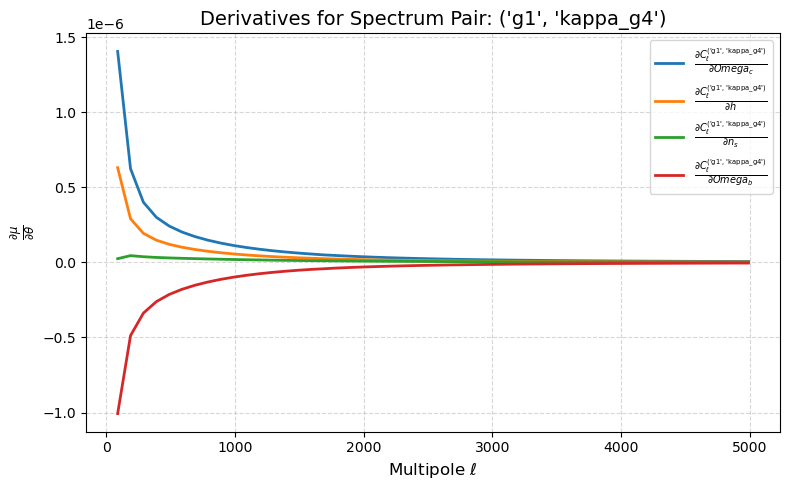

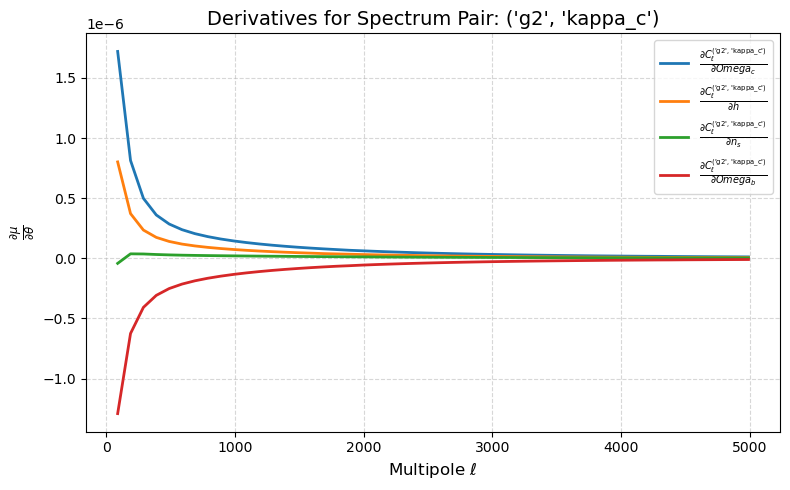

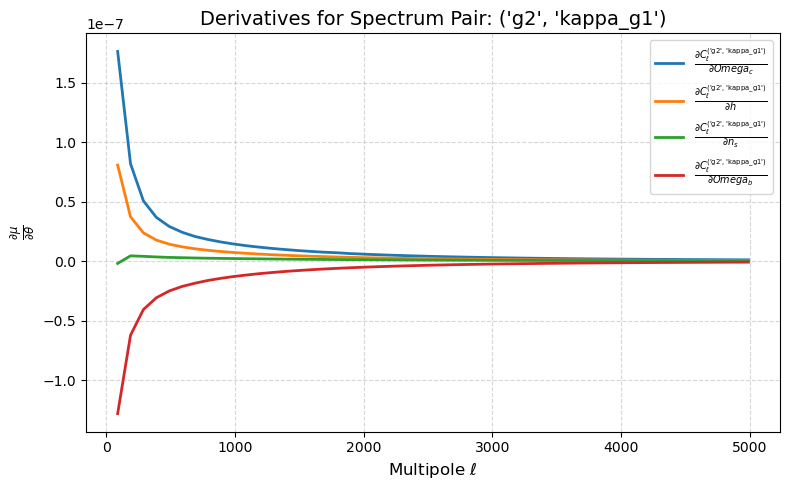

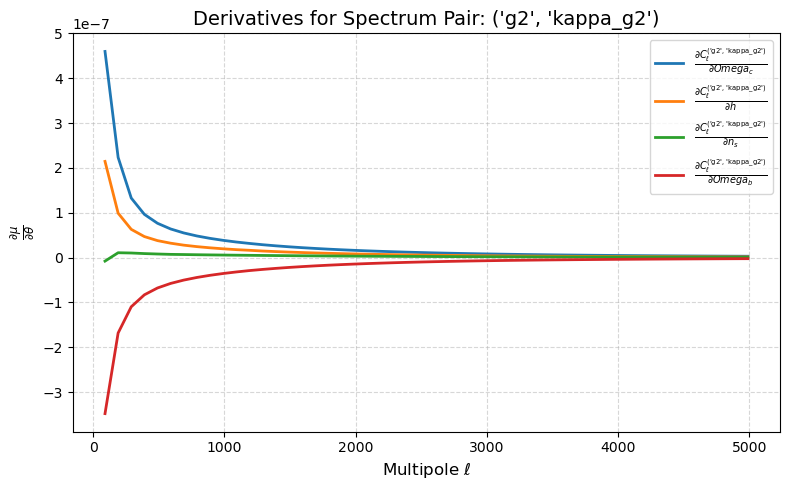

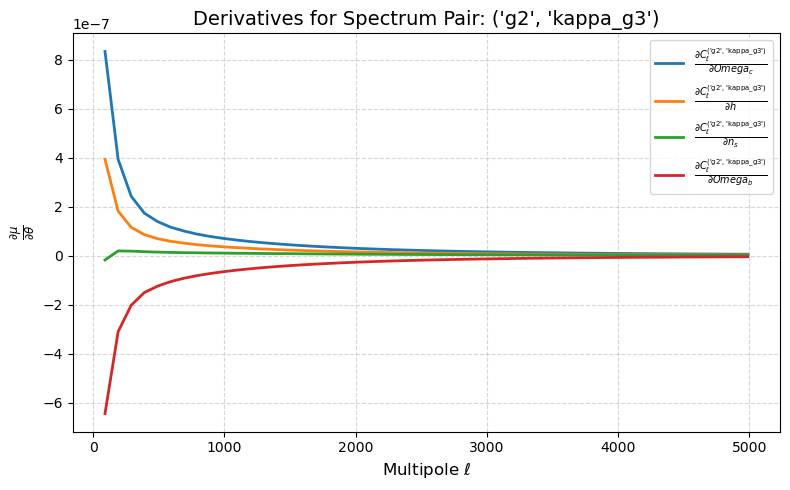

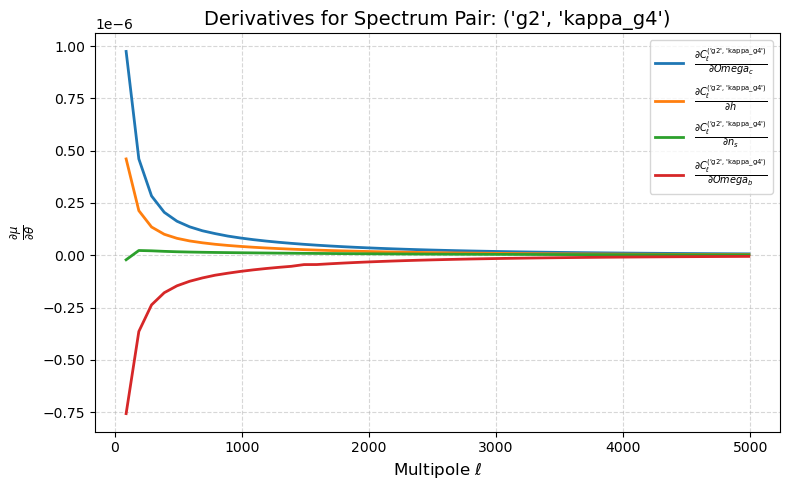

In [20]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.305\pm 0.022$ | $\Omega_m = 0.305^{+0.043}_{-0.042}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.315$ | $\Omega_m = \Omega_\mathrm{m} < 0.346$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.67^{+0.20}_{-0.15}$ | $h = 0.67^{+0.30}_{-0.31}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.29$ | $h = 0.68^{+0.57}_{-0.57}$ |
| --- | --- | --- | --- |

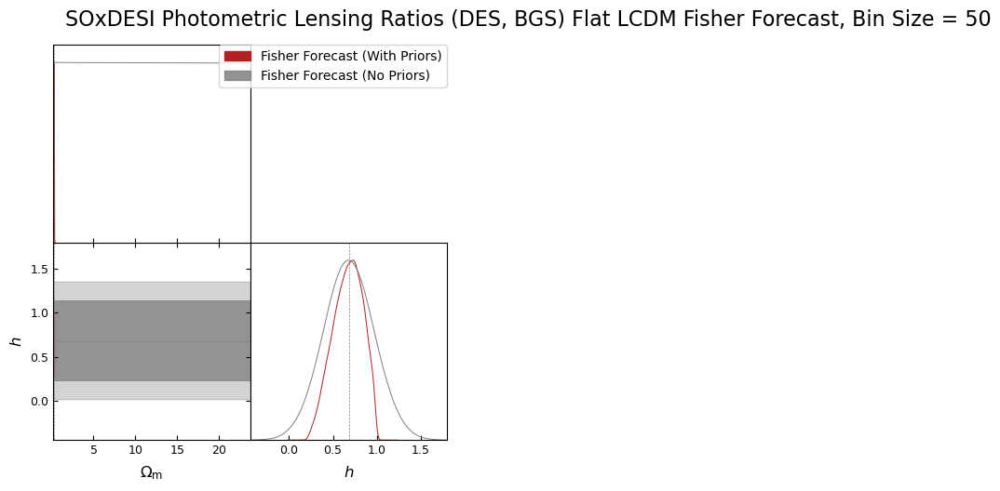

total_time:  0:00:45.022512


In [21]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 

multiplier = 3

for key in step_dict:
    step_dict[key] *= multiplier

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

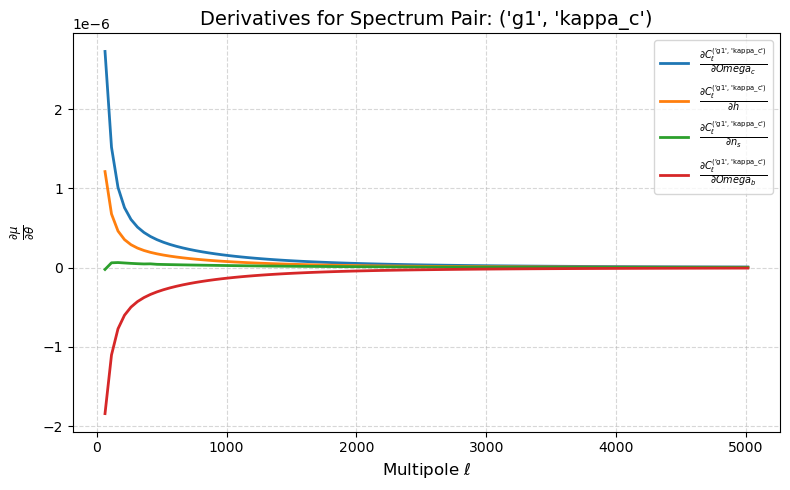

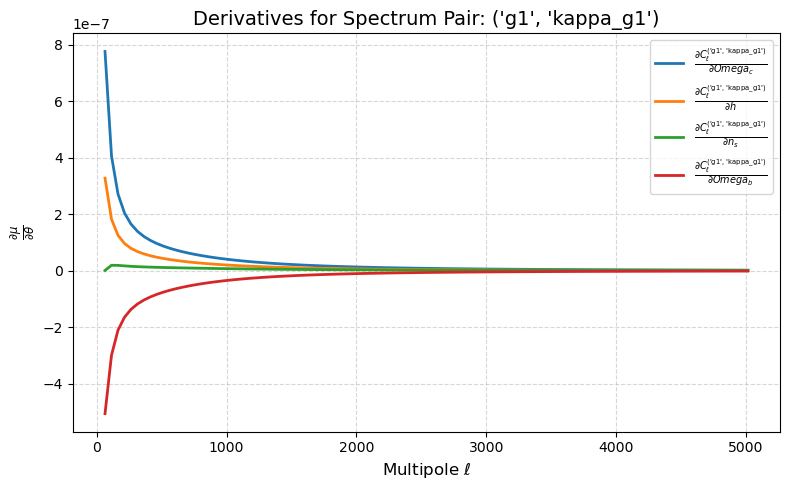

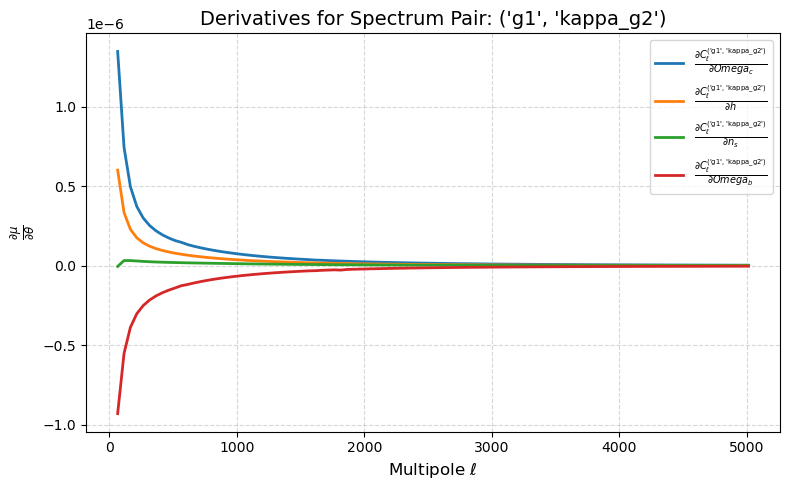

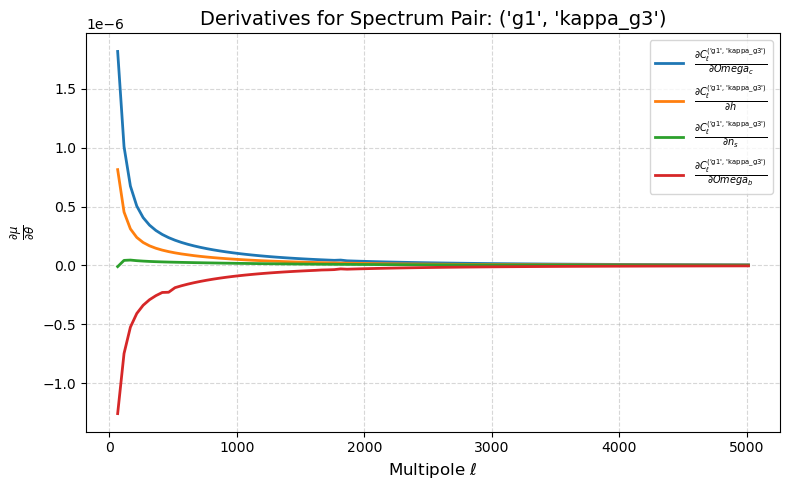

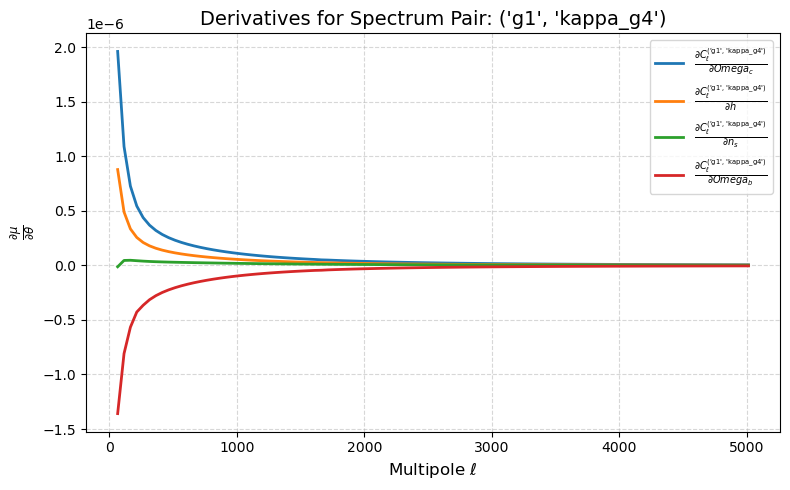

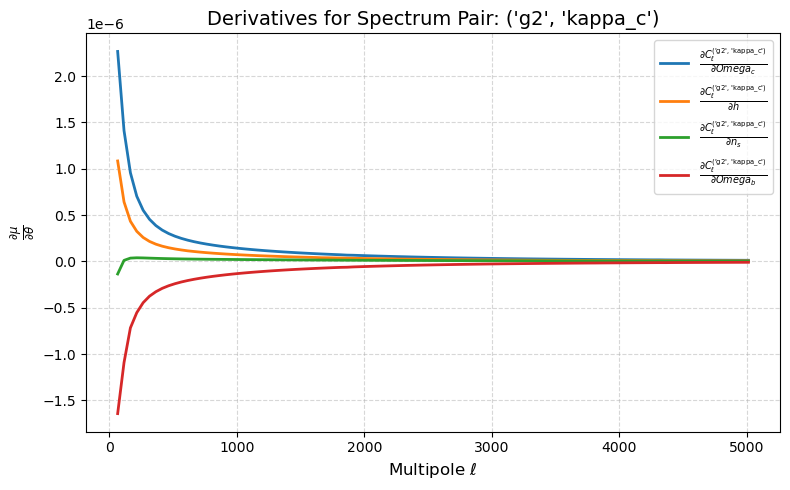

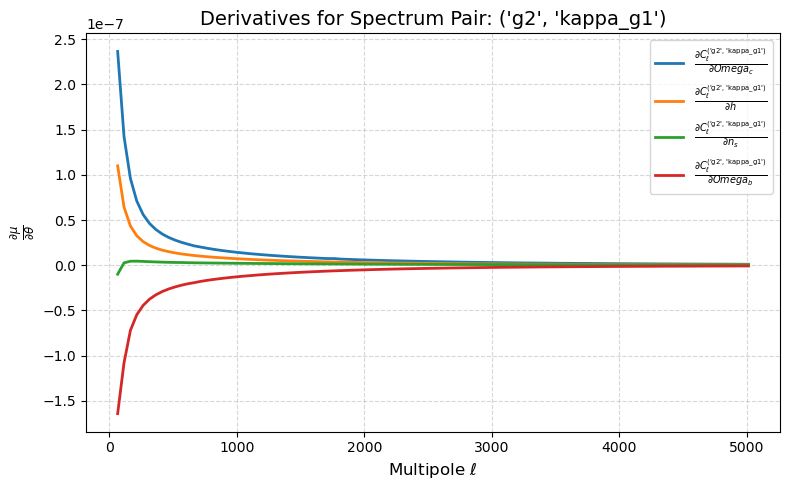

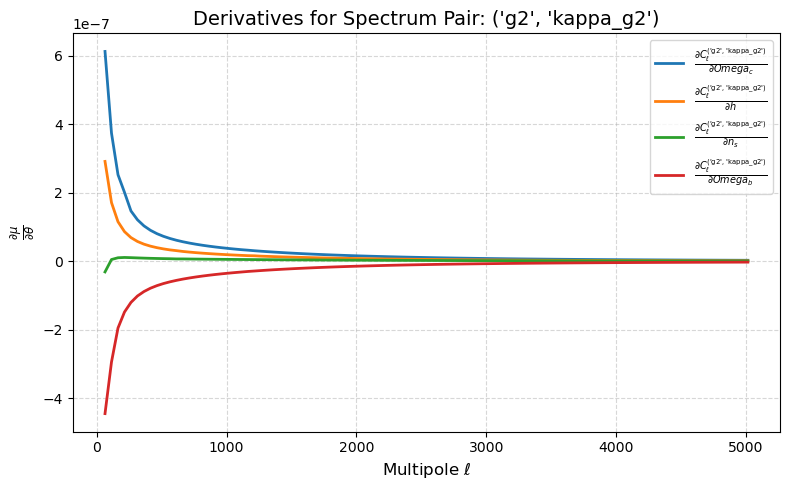

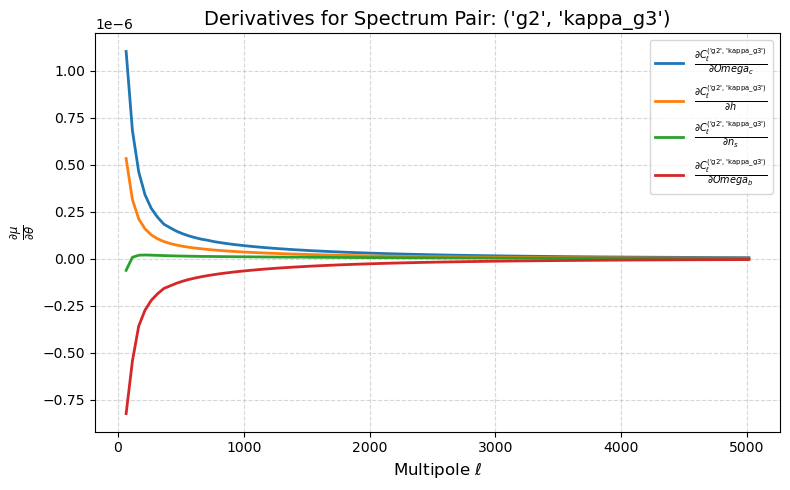

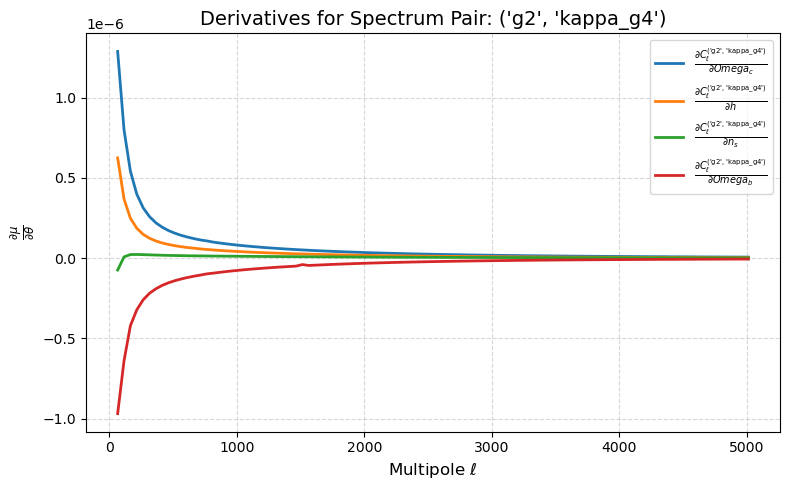

In [22]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s


Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.305\pm 0.015$ | $\Omega_m = 0.305^{+0.030}_{-0.029}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.310$ | $\Omega_m = \Omega_\mathrm{m} < 0.329$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.67^{+0.18}_{-0.14}$ | $h = 0.67^{+0.28}_{-0.29}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.20$ | $h = 0.68^{+0.38}_{-0.38}$ |
| --- | --- | --- | --- |

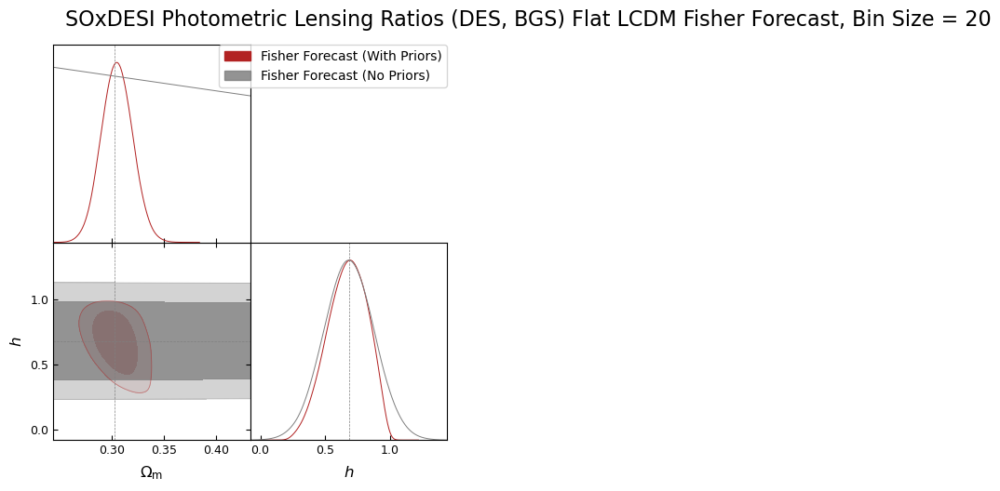

total_time:  0:01:09.646690


In [23]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 


multiplier = 3

for key in step_dict:
    step_dict[key] *= multiplier

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

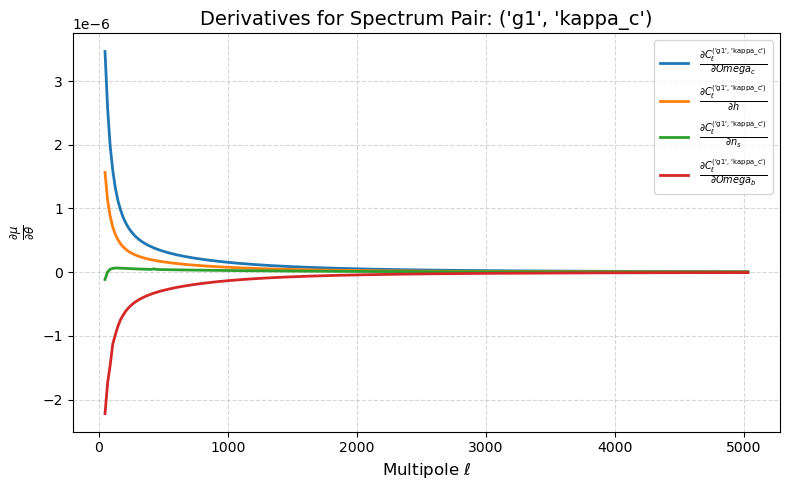

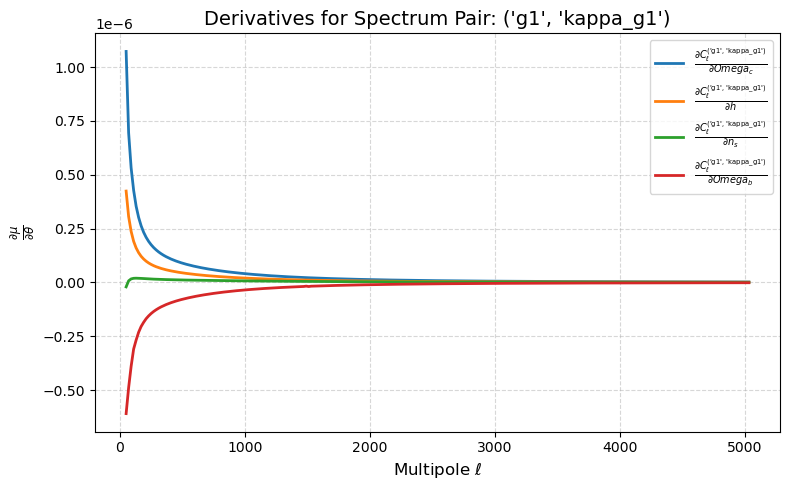

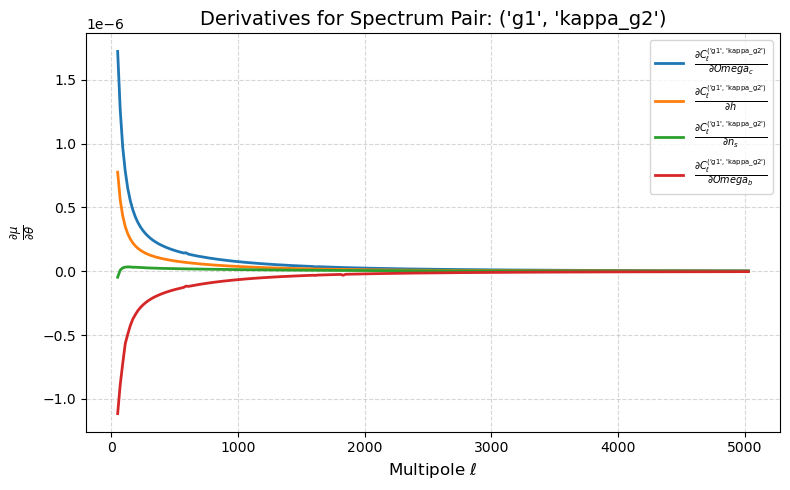

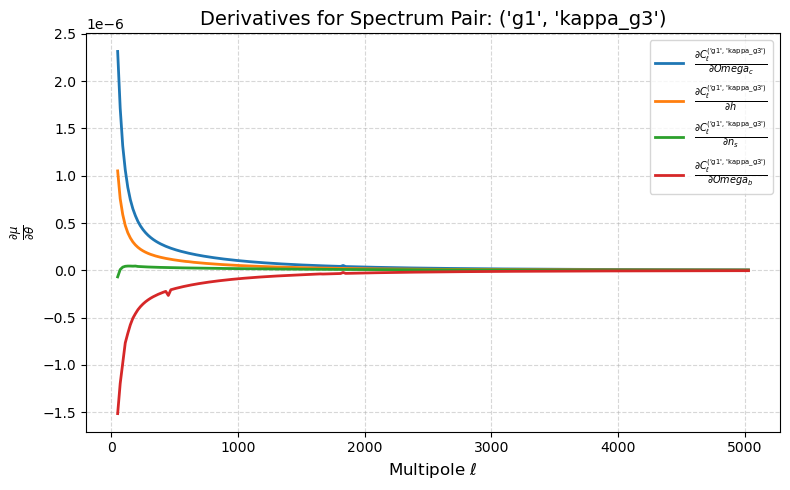

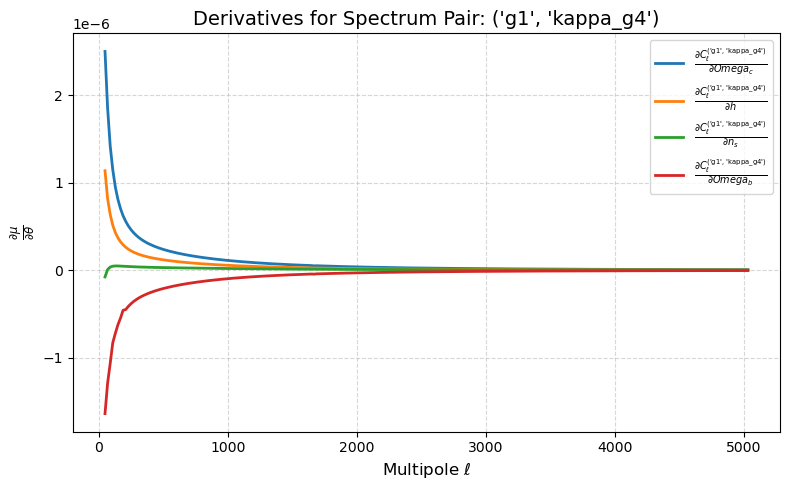

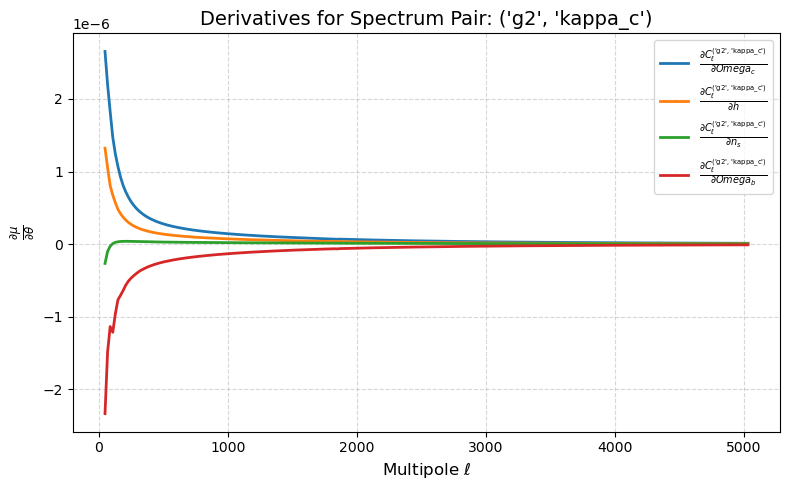

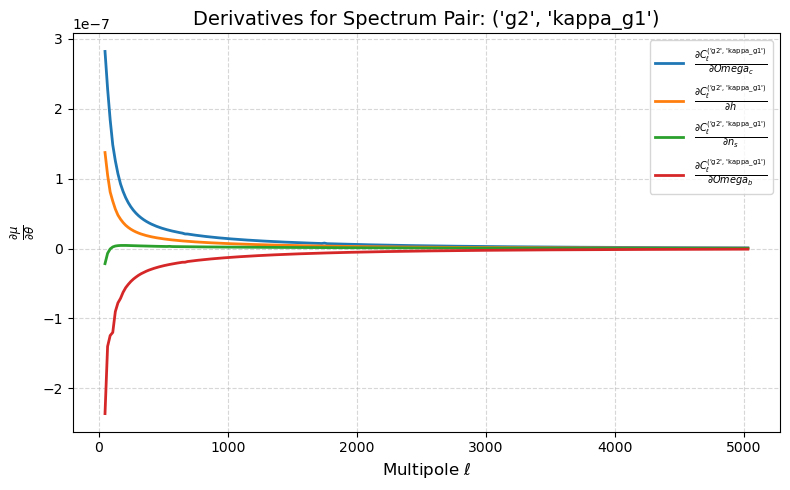

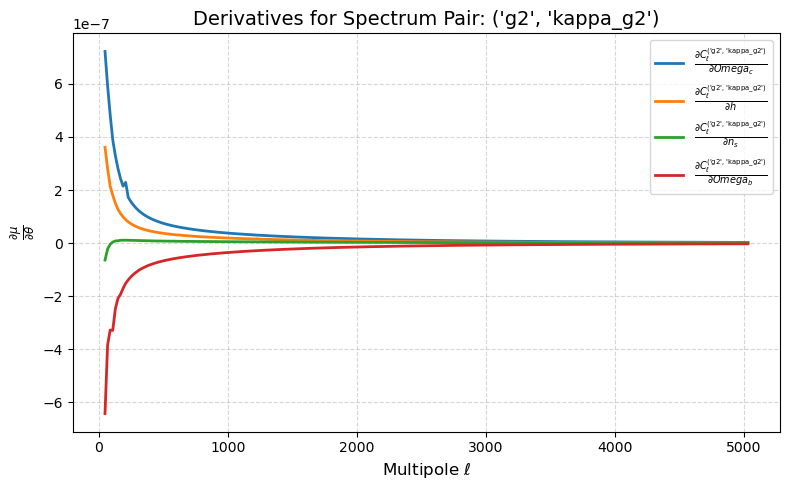

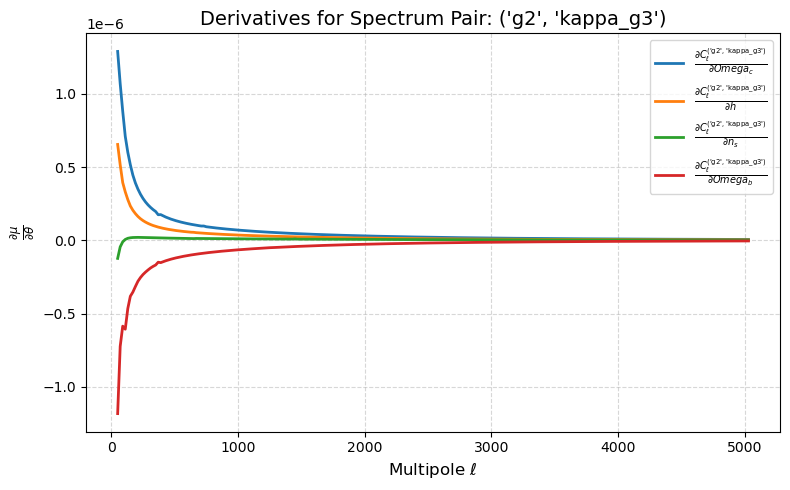

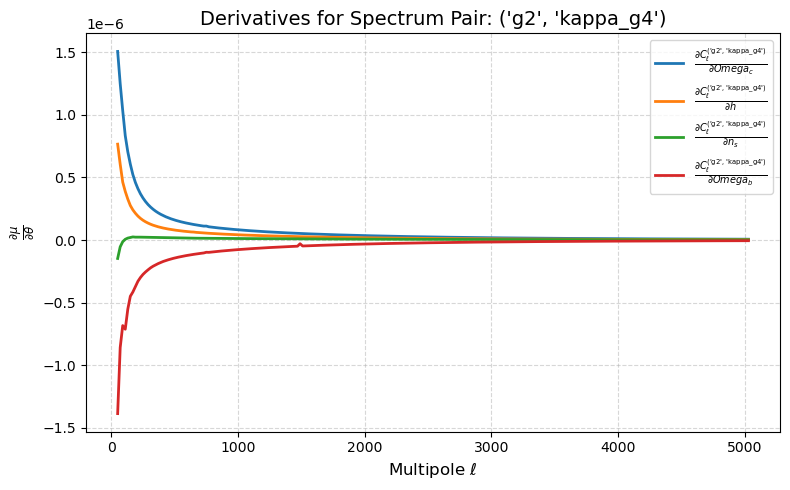

In [24]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_100.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0059$ | $\Omega_m = 0.303^{+0.012}_{-0.012}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0059$ | $\Omega_m = 0.303^{+0.012}_{-0.012}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.682\pm 0.036$ | $h = 0.682^{+0.071}_{-0.071}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.036$ | $h = 0.682^{+0.071}_{-0.071}$ |
| --- | --- | --- | --- |

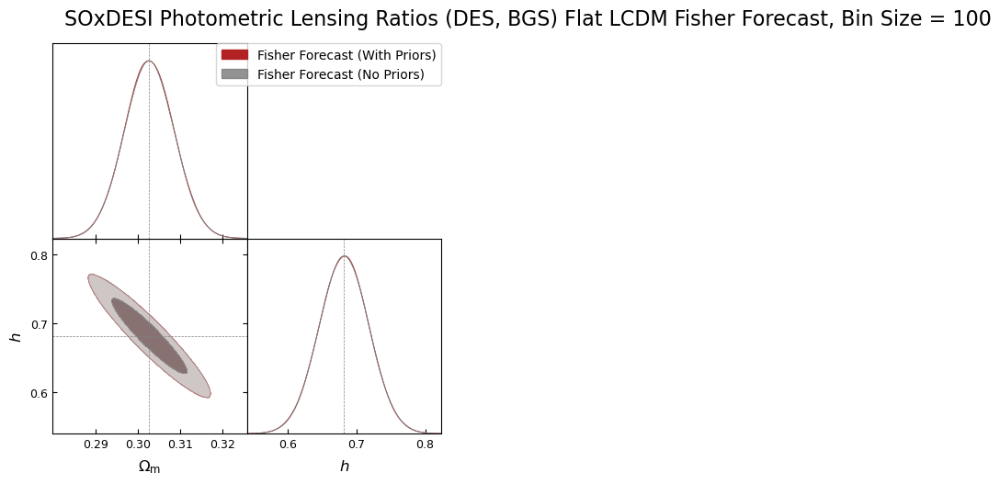

total_time:  0:00:39.950712


In [26]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 


multiplier = 1/3

for key in step_dict:
    step_dict[key] *= multiplier

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

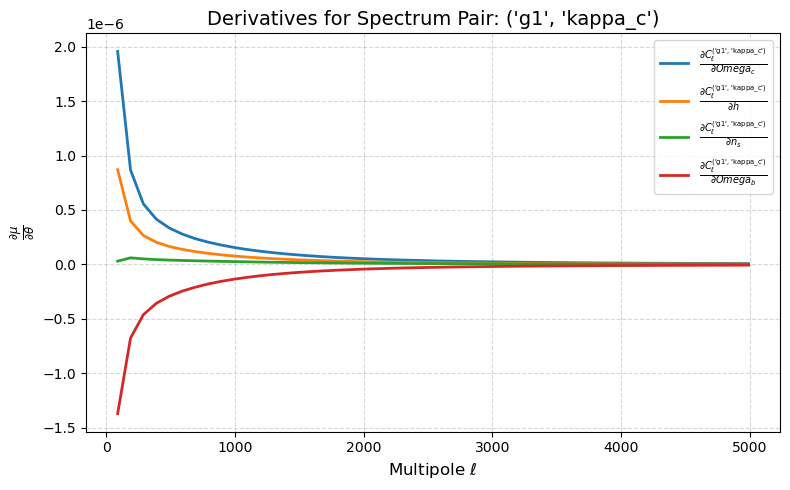

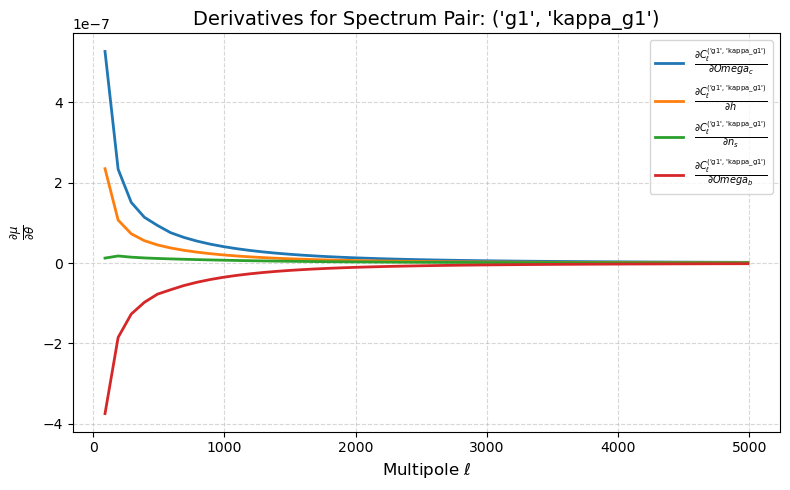

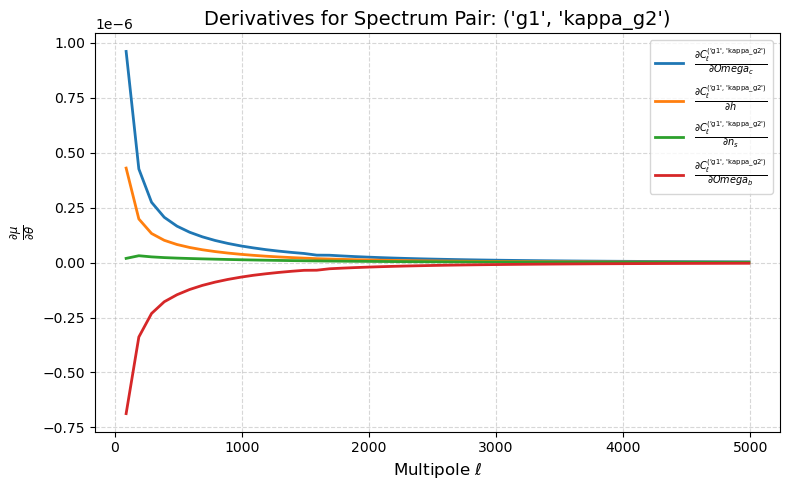

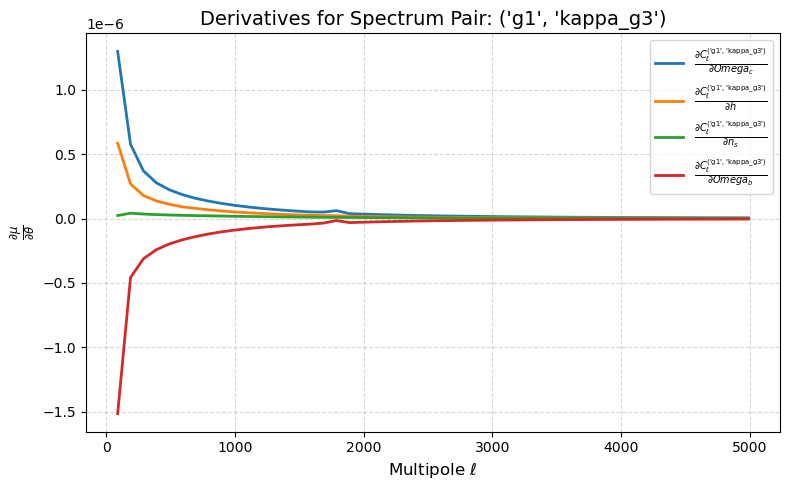

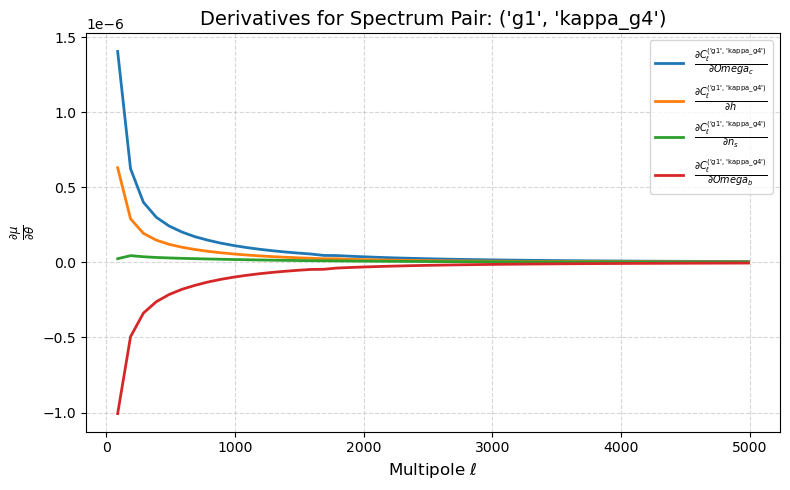

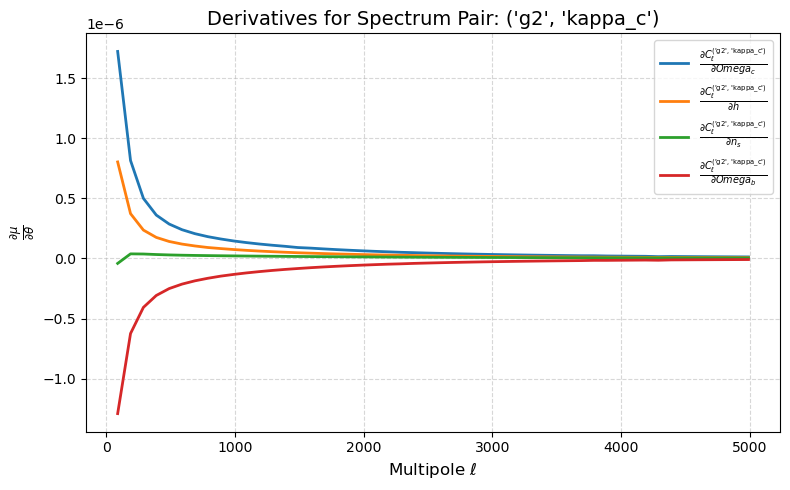

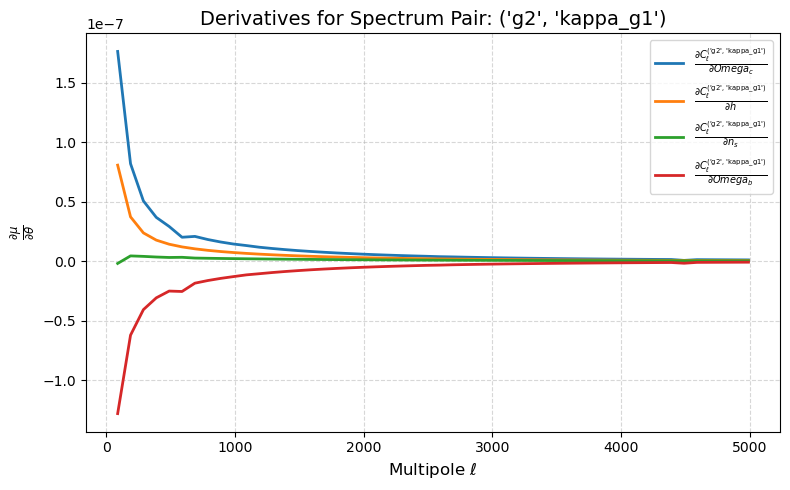

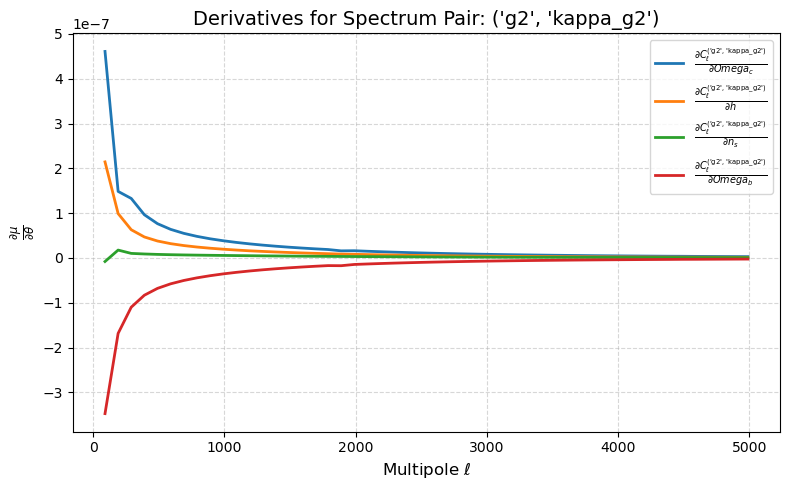

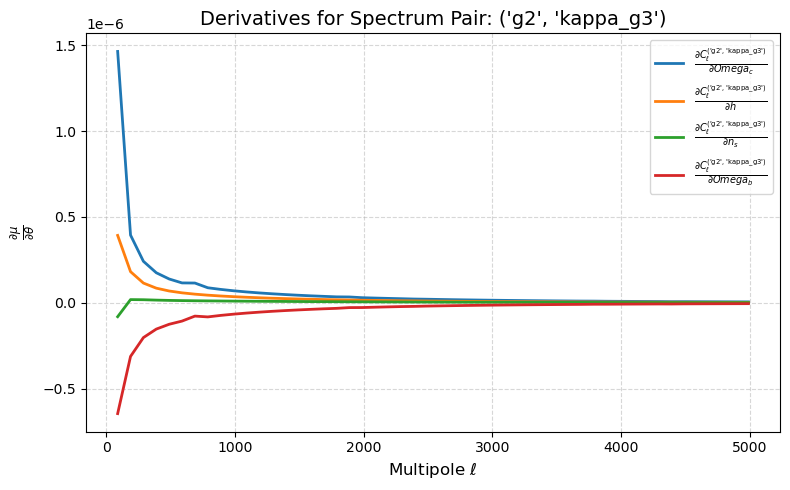

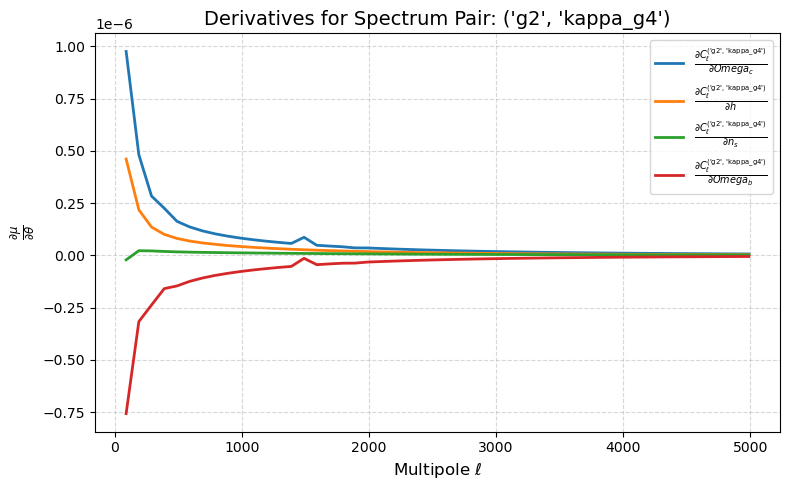

In [27]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0054$ | $\Omega_m = 0.303^{+0.011}_{-0.011}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0054$ | $\Omega_m = 0.303^{+0.011}_{-0.011}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.682\pm 0.061$ | $h = 0.68^{+0.12}_{-0.12}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.061$ | $h = 0.68^{+0.12}_{-0.12}$ |
| --- | --- | --- | --- |

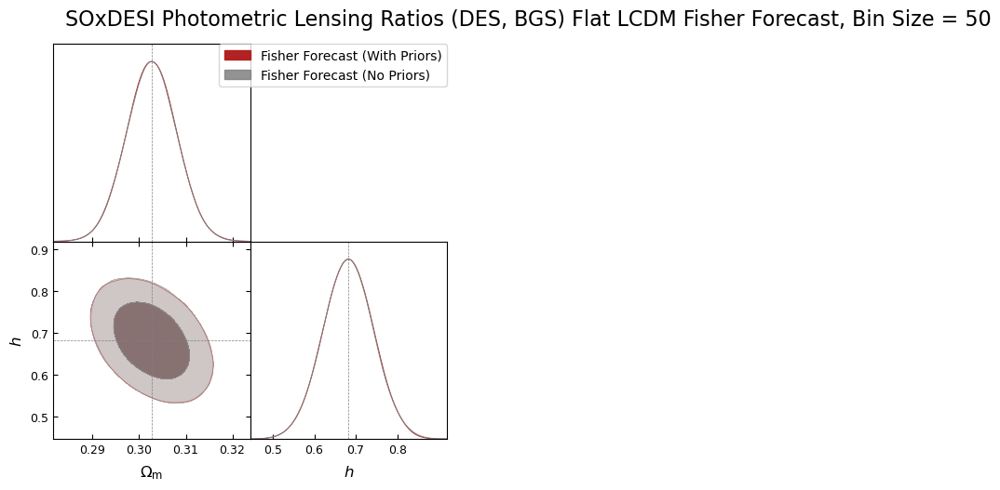

total_time:  0:00:43.422521


In [28]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 

multiplier = 1/3

for key in step_dict:
    step_dict[key] *= multiplier

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

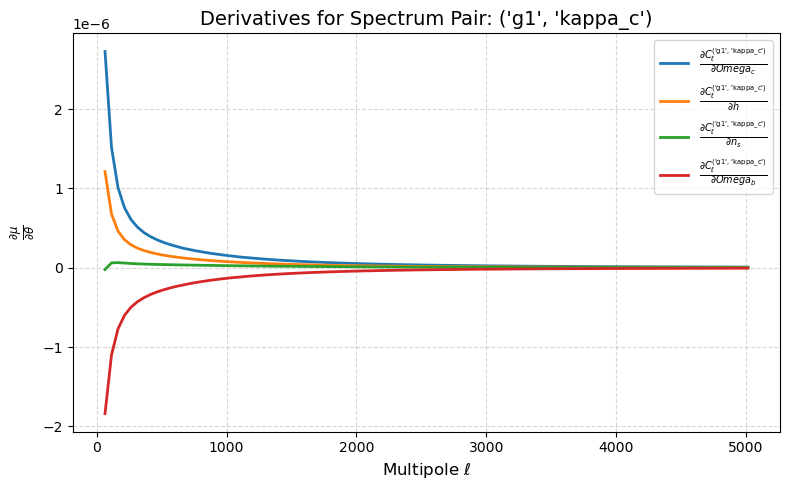

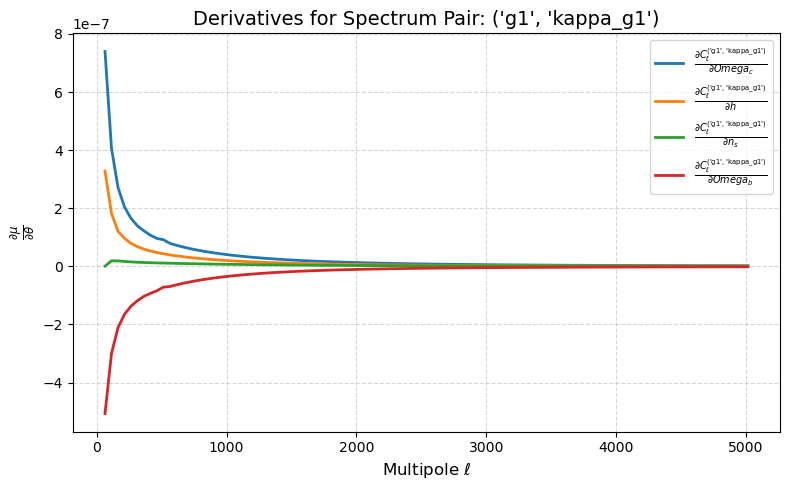

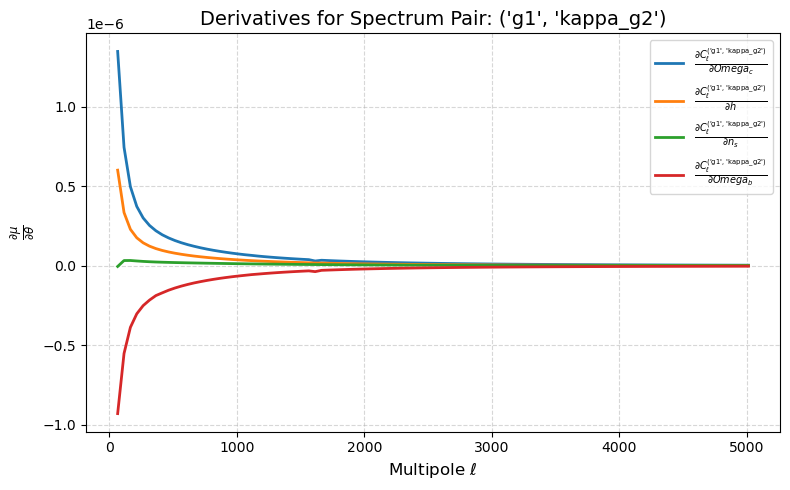

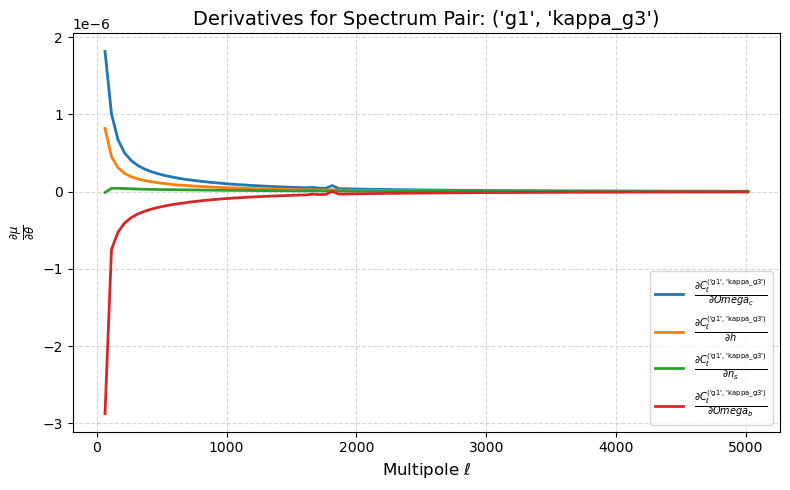

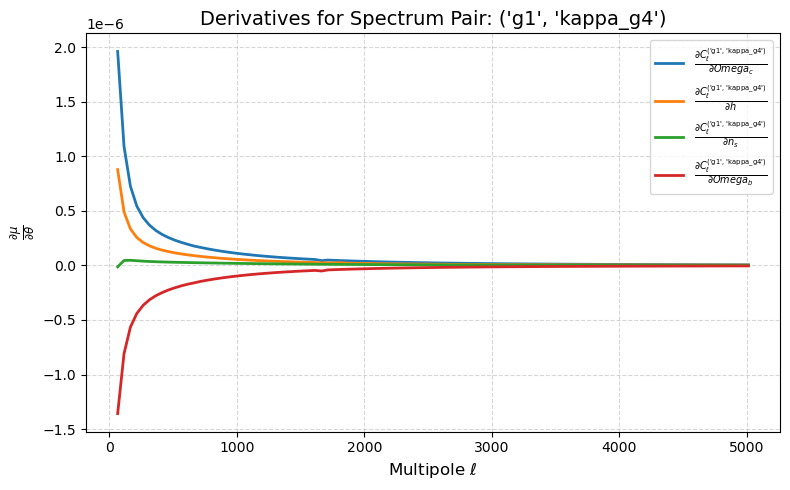

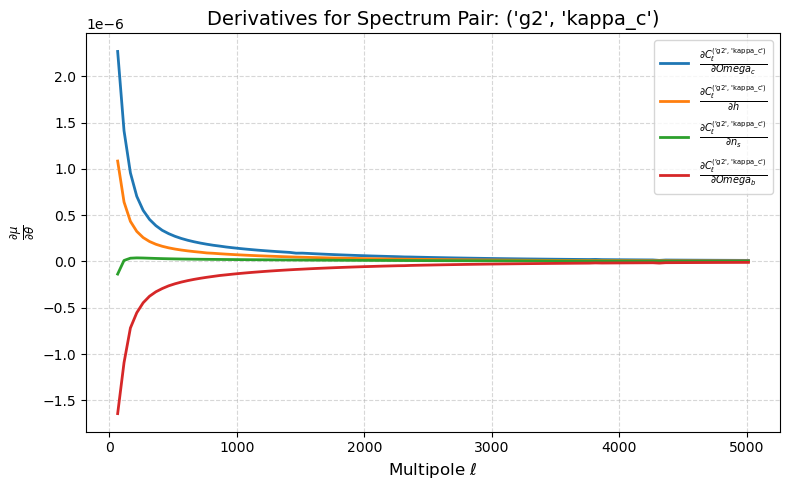

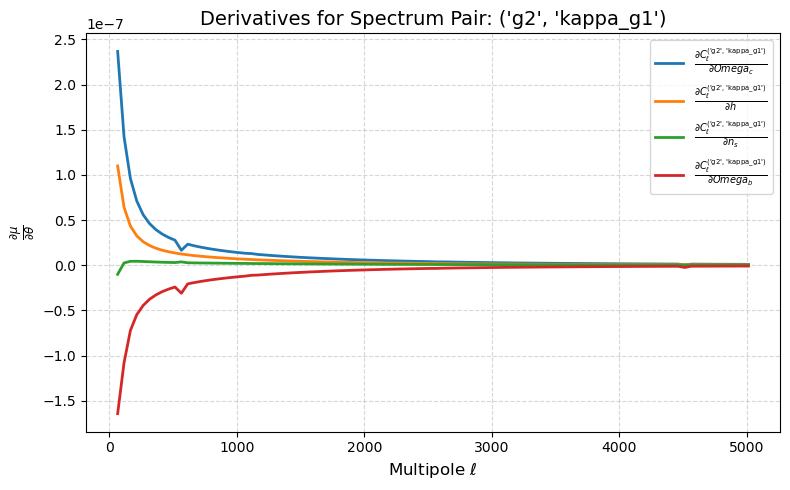

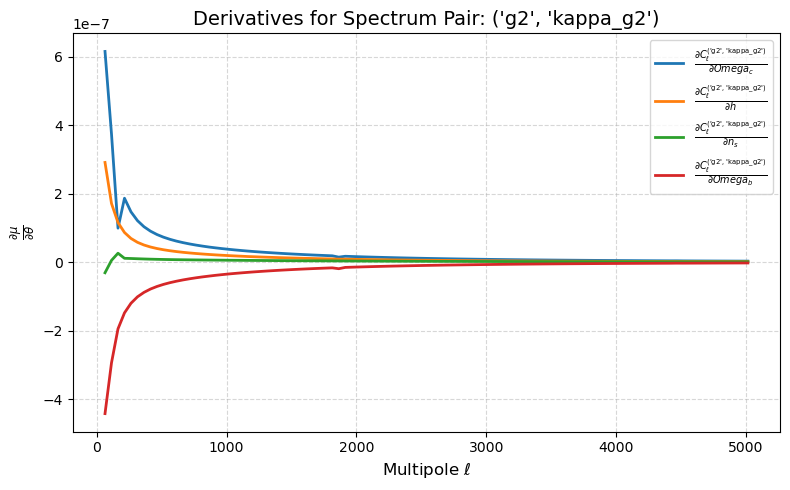

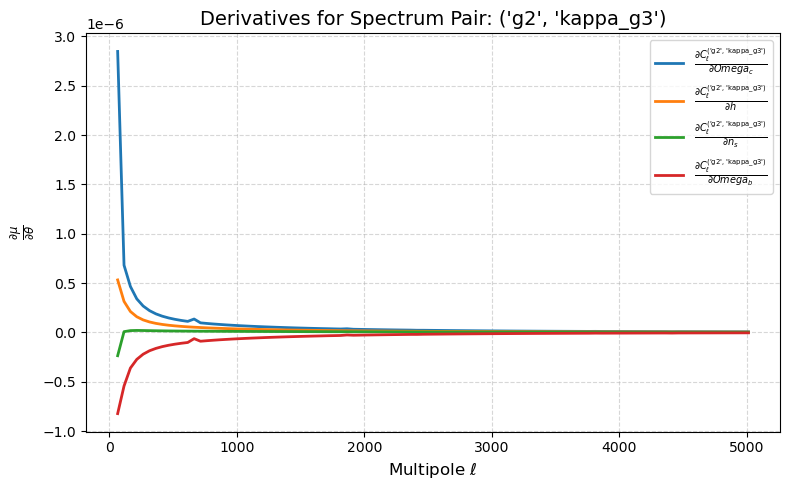

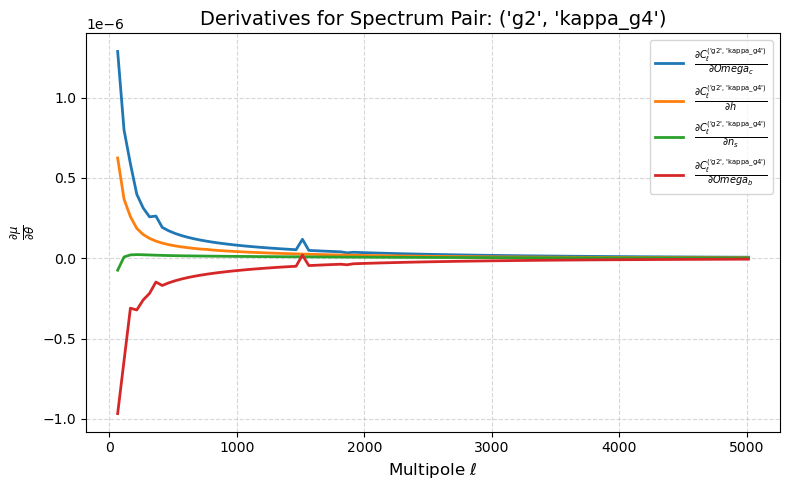

In [29]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_lensing_ratios_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0035$ | $\Omega_m = 0.3027^{+0.0069}_{-0.0069}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0035$ | $\Omega_m = 0.3027^{+0.0069}_{-0.0069}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.682\pm 0.039$ | $h = 0.682^{+0.076}_{-0.076}$ |
|  | Fisher Forecast (No Priors) | $h = 0.682\pm 0.039$ | $h = 0.682^{+0.076}_{-0.076}$ |
| --- | --- | --- | --- |

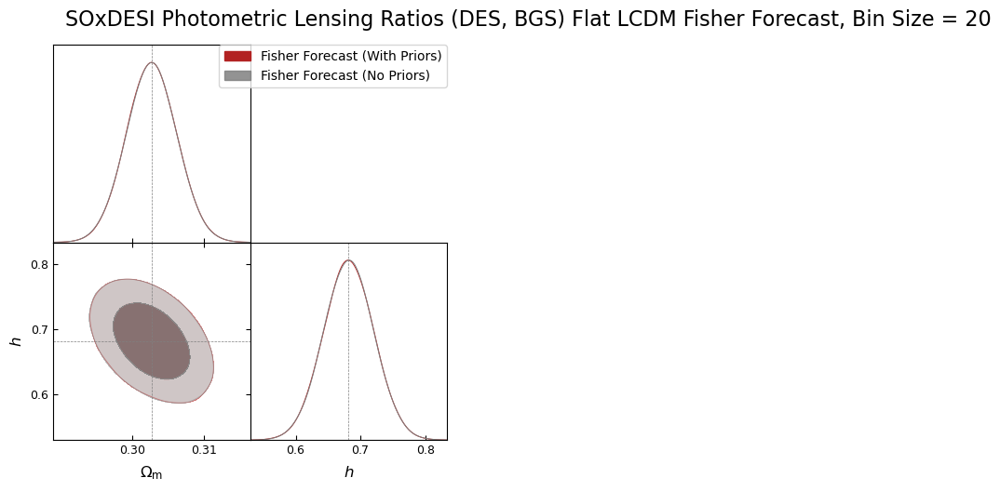

total_time:  0:01:02.580454


In [30]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 


multiplier = 1/3

for key in step_dict:
    step_dict[key] *= multiplier

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Lensing Ratios (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

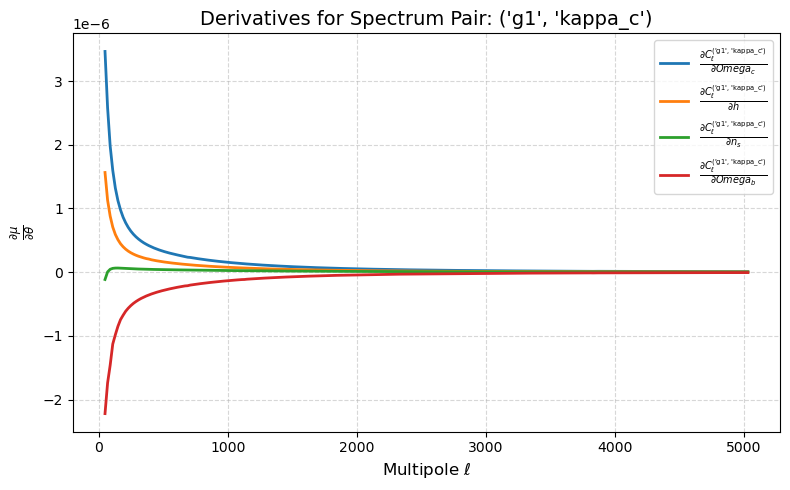

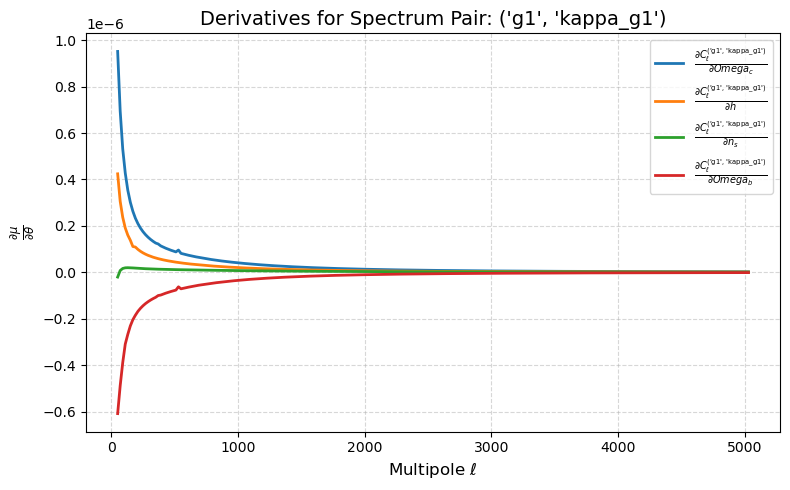

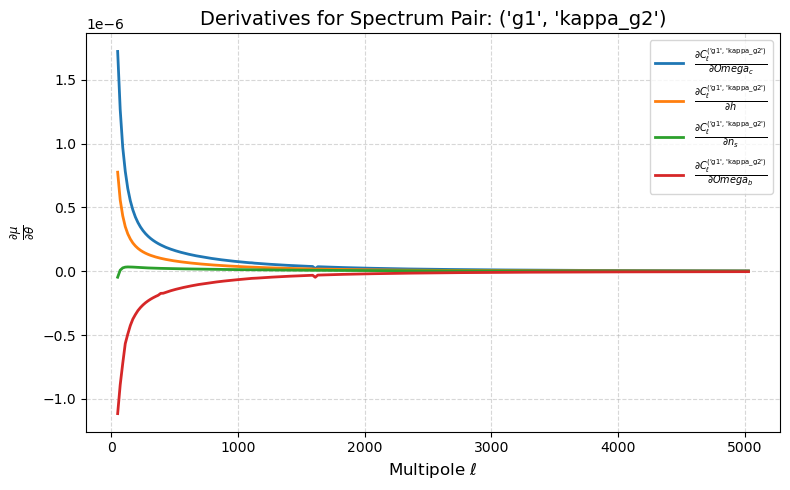

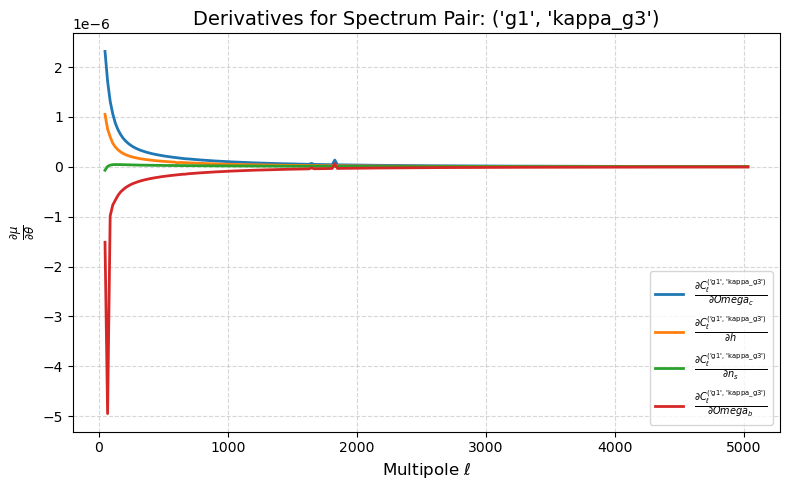

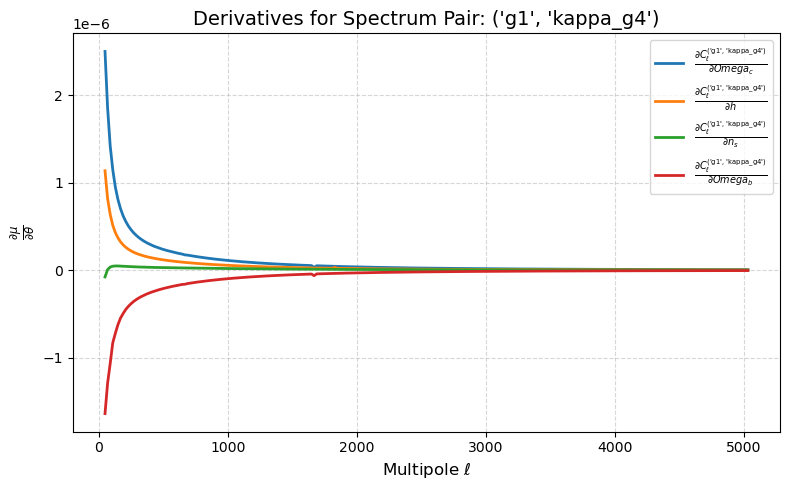

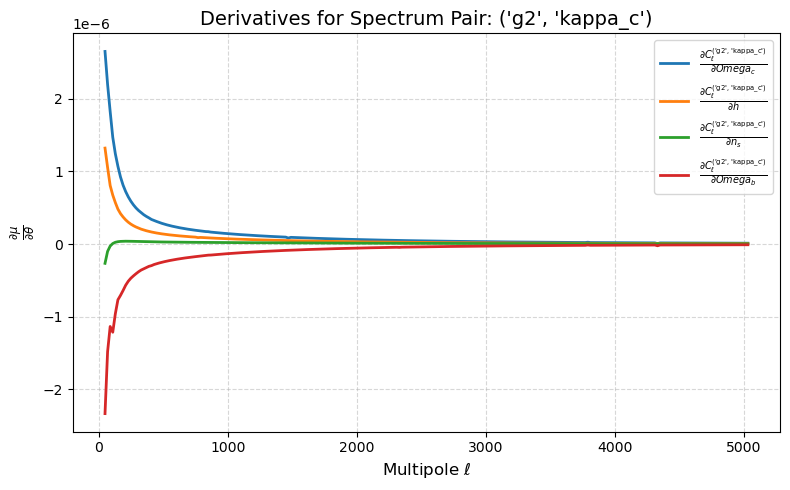

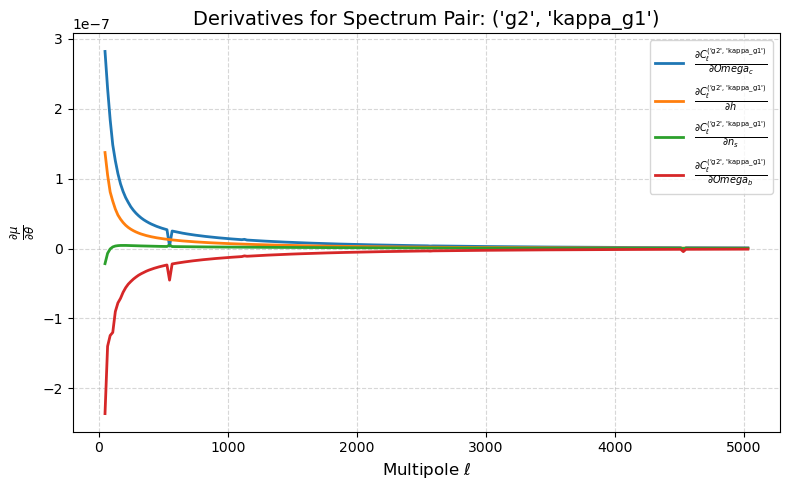

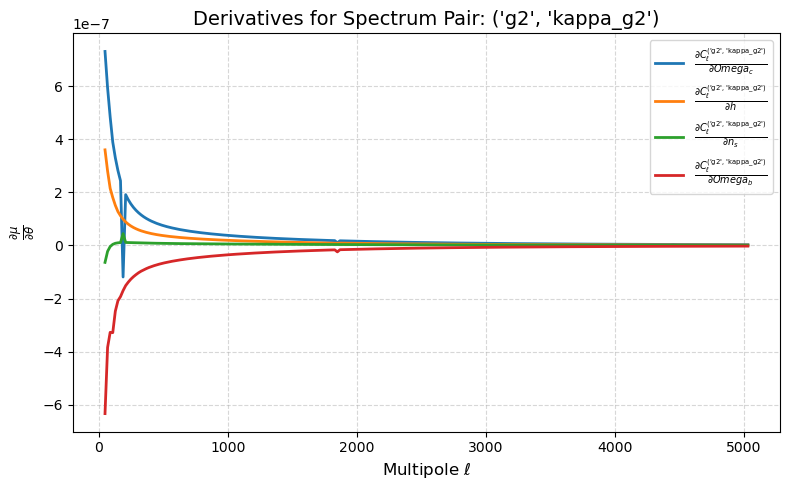

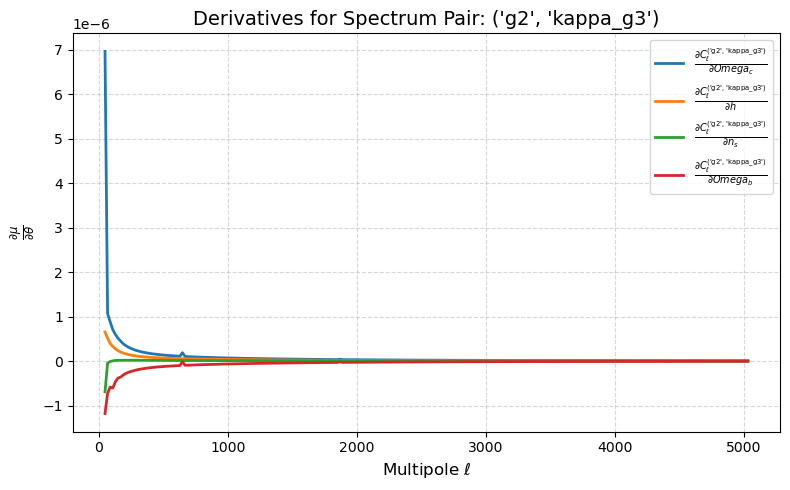

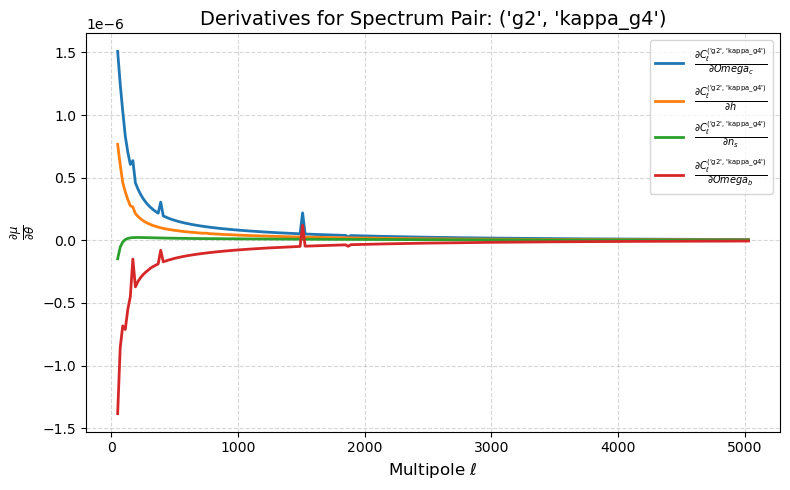

In [31]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

## Primaries

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_100.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0048$ | $\Omega_m = 0.3027^{+0.0093}_{-0.0093}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3026\pm 0.0048$ | $\Omega_m = 0.3026^{+0.0093}_{-0.0093}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0035$ | $h = 0.6817^{+0.0069}_{-0.0069}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0035$ | $h = 0.6817^{+0.0068}_{-0.0069}$ |
| --- | --- | --- | --- |

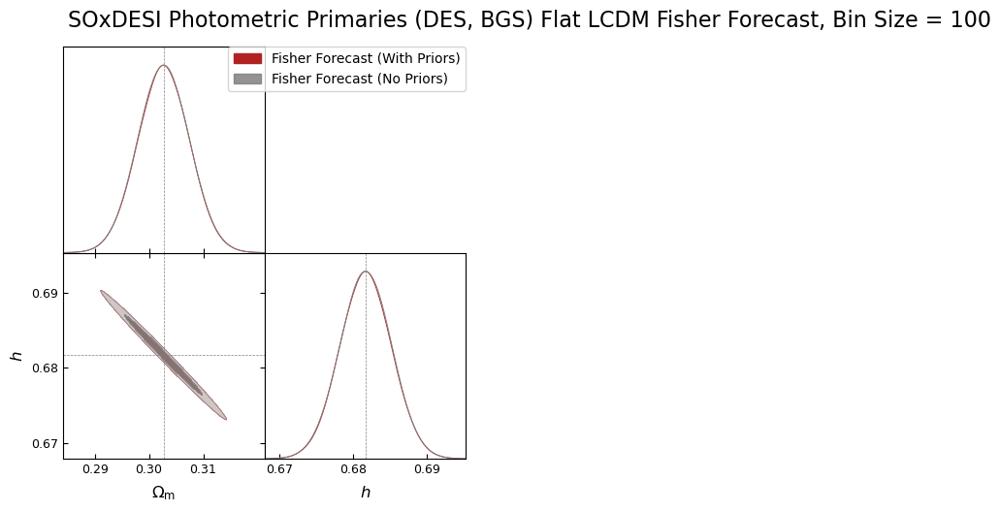

total_time:  0:00:50.094934


In [33]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 
            
# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_P_Photo_BGS_DESY3_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_P_Photo_BGS_DESY5_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

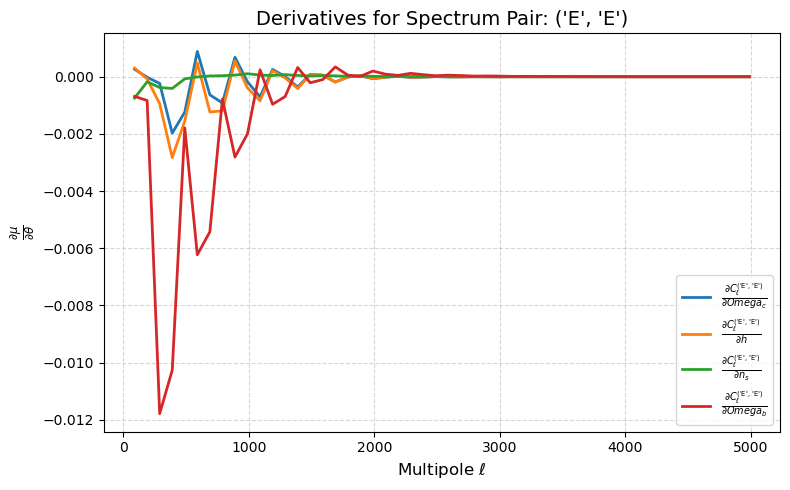

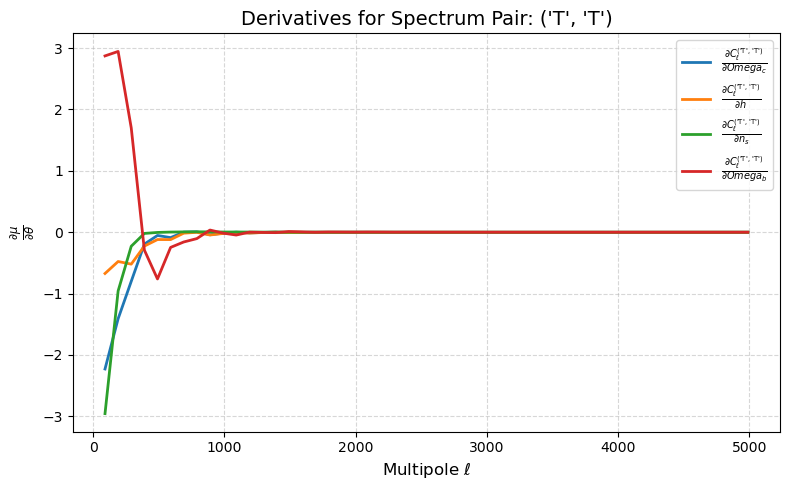

In [34]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3026\pm 0.0041$ | $\Omega_m = 0.3026^{+0.0081}_{-0.0080}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0041$ | $\Omega_m = 0.3027^{+0.0080}_{-0.0080}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0029$ | $h = 0.6817^{+0.0057}_{-0.0057}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0029$ | $h = 0.6817^{+0.0057}_{-0.0057}$ |
| --- | --- | --- | --- |

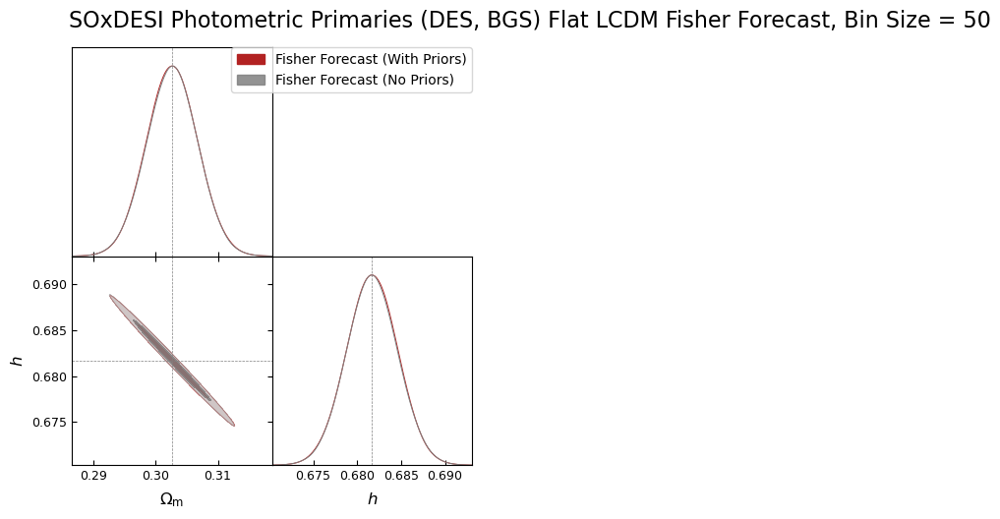

total_time:  0:01:02.643379


In [35]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 
            
# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'TE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_P_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_P_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

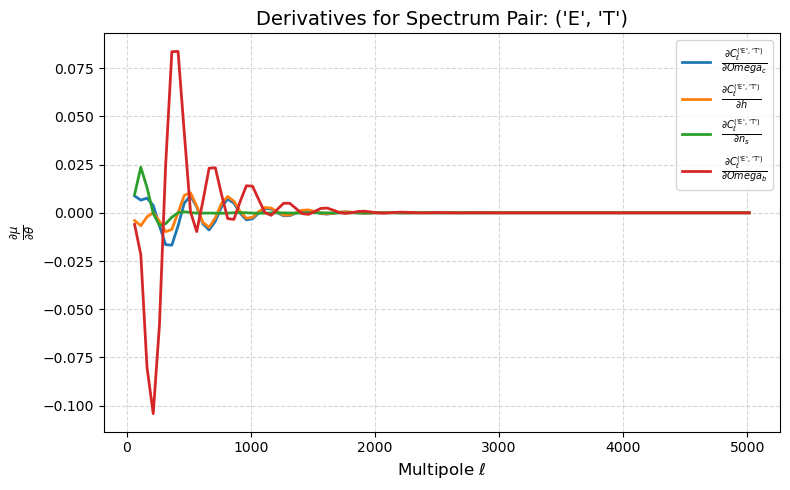

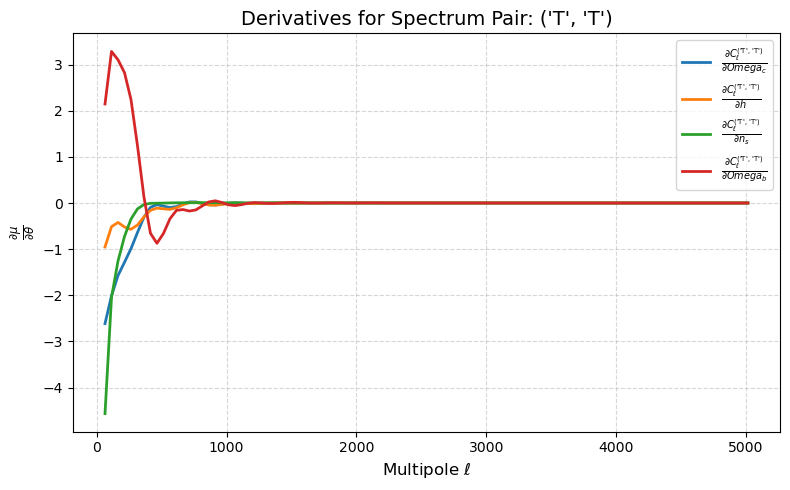

In [36]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0042$ | $\Omega_m = 0.3027^{+0.0082}_{-0.0082}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3026\pm 0.0042$ | $\Omega_m = 0.3026^{+0.0082}_{-0.0082}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0060}_{-0.0060}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0060}_{-0.0060}$ |
| --- | --- | --- | --- |

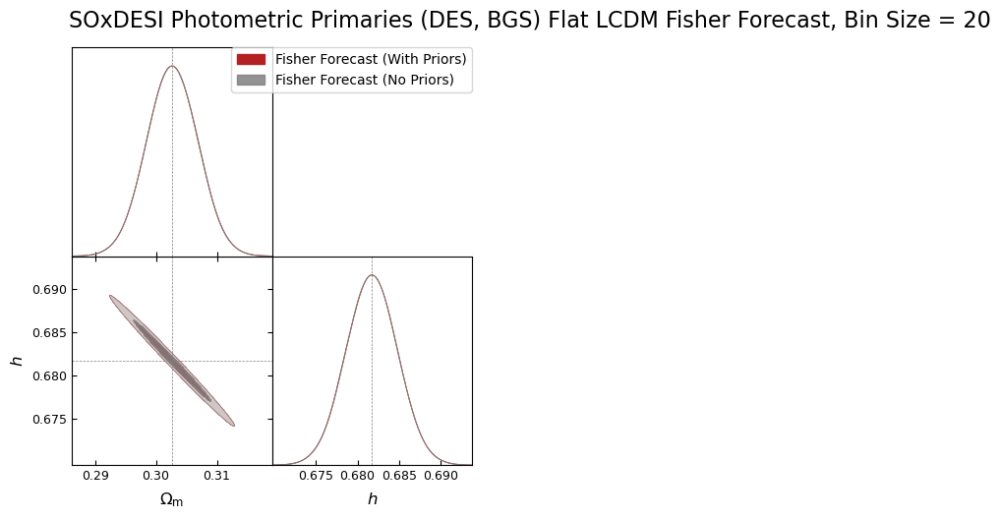

total_time:  0:01:52.332191


In [37]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_P_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_P_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

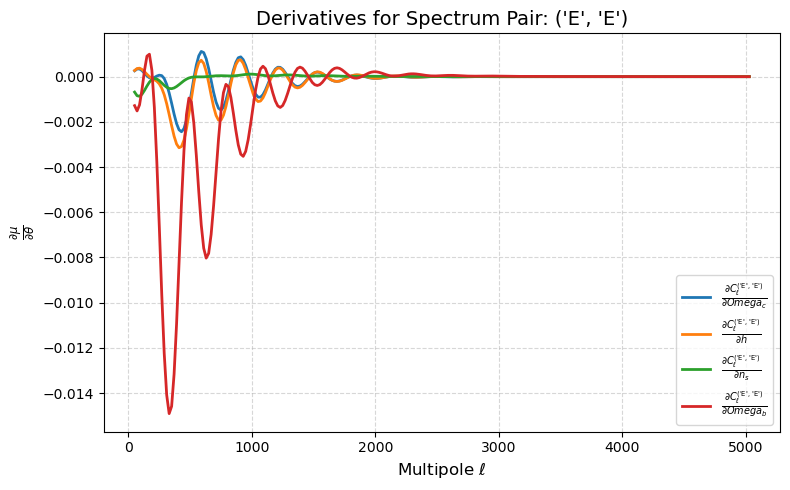

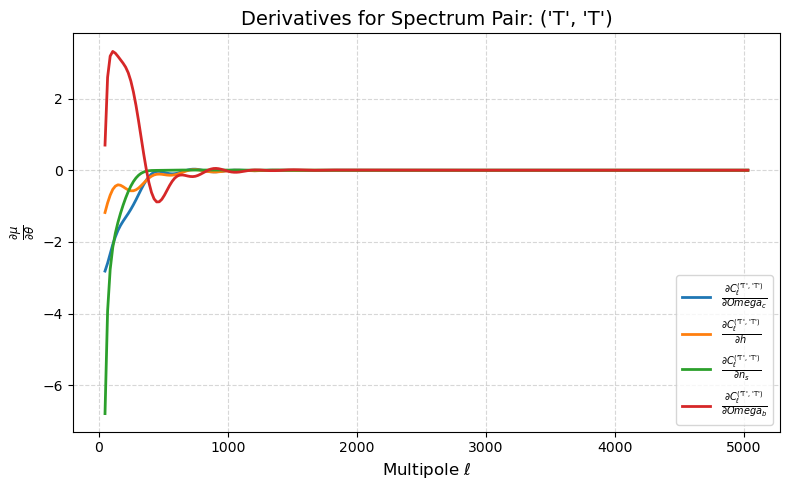

In [38]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_100.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0048$ | $\Omega_m = 0.3027^{+0.0094}_{-0.0093}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0048$ | $\Omega_m = 0.3027^{+0.0094}_{-0.0094}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0035$ | $h = 0.6817^{+0.0069}_{-0.0069}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0035$ | $h = 0.6817^{+0.0069}_{-0.0069}$ |
| --- | --- | --- | --- |

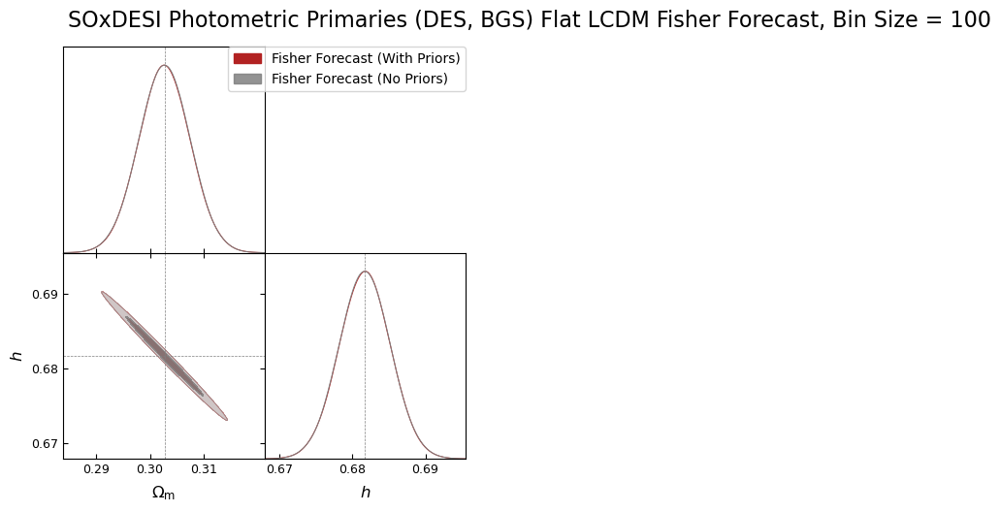

total_time:  0:00:47.584756


In [39]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 


multiplier = 3

for key in step_dict:
    step_dict[key] *= multiplier

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_P_Photo_BGS_DESY3_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_P_Photo_BGS_DESY5_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

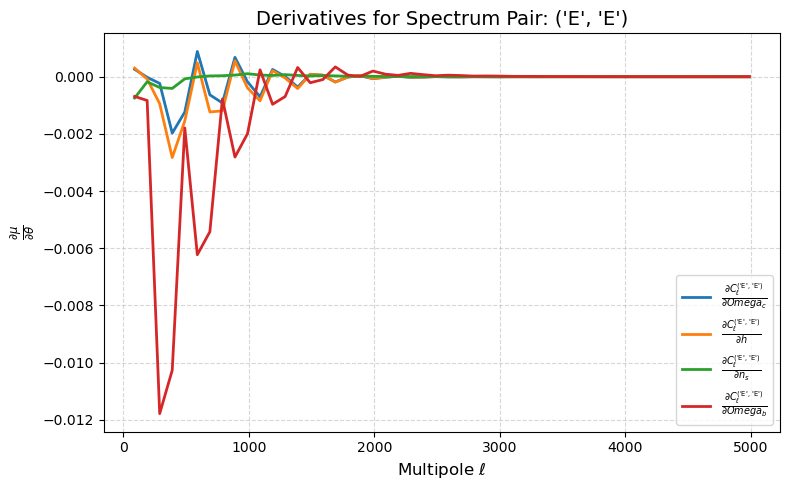

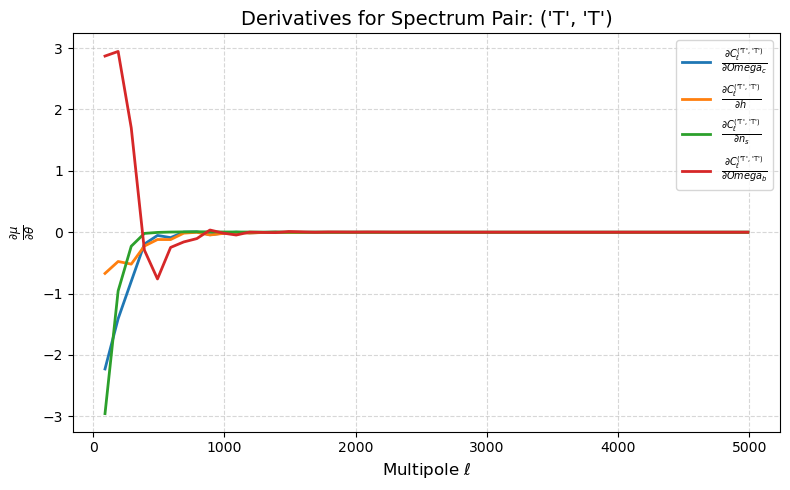

In [40]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3026\pm 0.0043$ | $\Omega_m = 0.3026^{+0.0085}_{-0.0085}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3026\pm 0.0043$ | $\Omega_m = 0.3026^{+0.0085}_{-0.0085}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0032$ | $h = 0.6817^{+0.0062}_{-0.0062}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0032$ | $h = 0.6817^{+0.0063}_{-0.0063}$ |
| --- | --- | --- | --- |

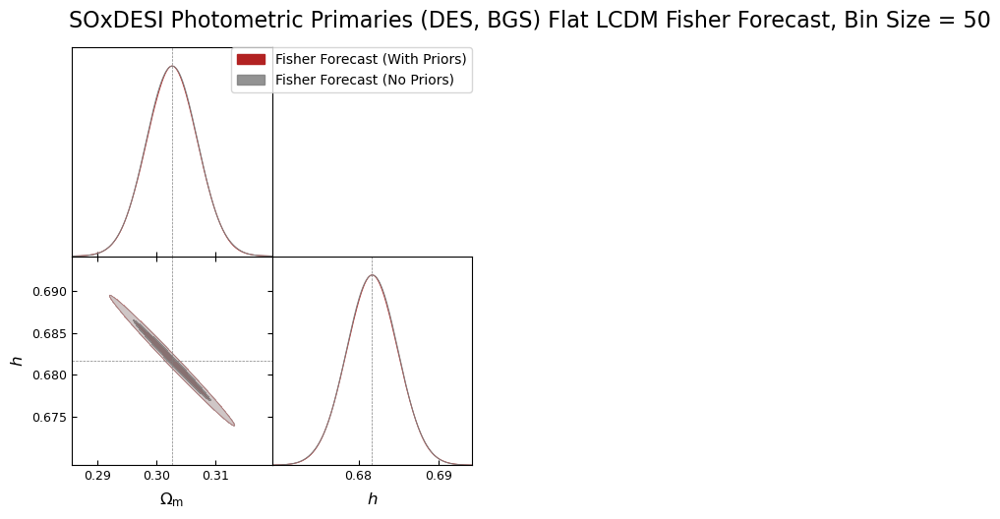

total_time:  0:01:14.491911


In [41]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 

multiplier = 3

for key in step_dict:
    step_dict[key] *= multiplier

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_P_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_P_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

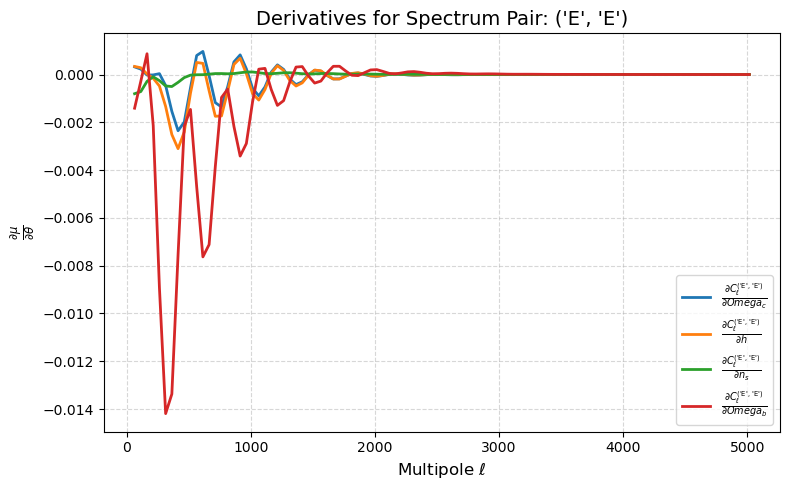

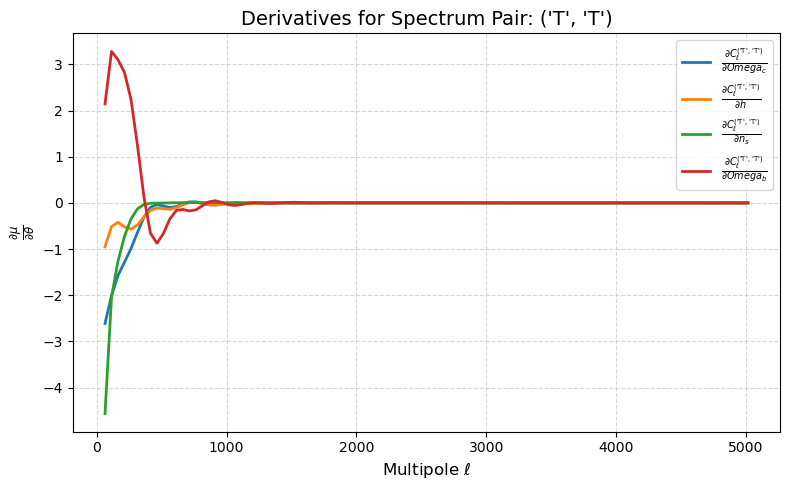

In [42]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0042$ | $\Omega_m = 0.3027^{+0.0082}_{-0.0082}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3026\pm 0.0042$ | $\Omega_m = 0.3026^{+0.0083}_{-0.0082}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0061}_{-0.0060}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0060}_{-0.0061}$ |
| --- | --- | --- | --- |

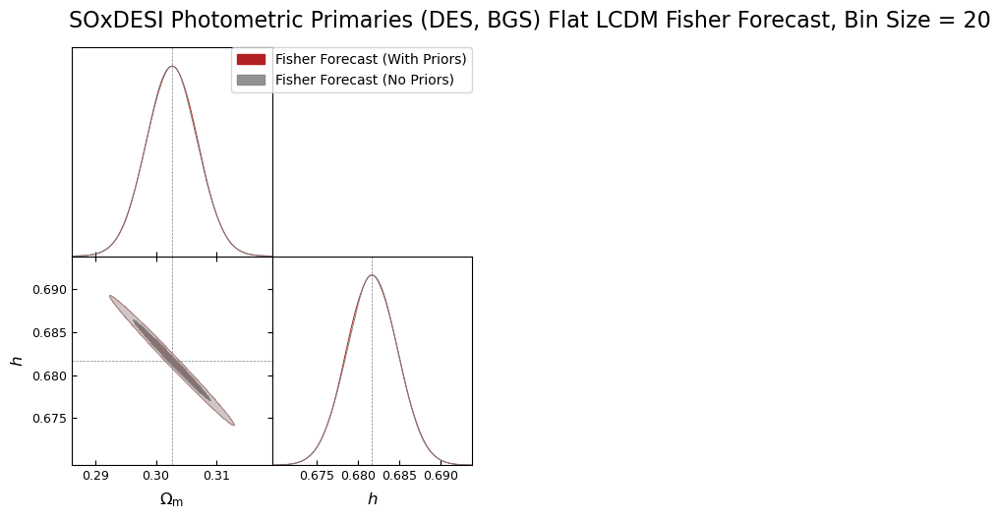

total_time:  0:01:49.752972


In [43]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 


multiplier = 3

for key in step_dict:
    step_dict[key] *= multiplier

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_P_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_P_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

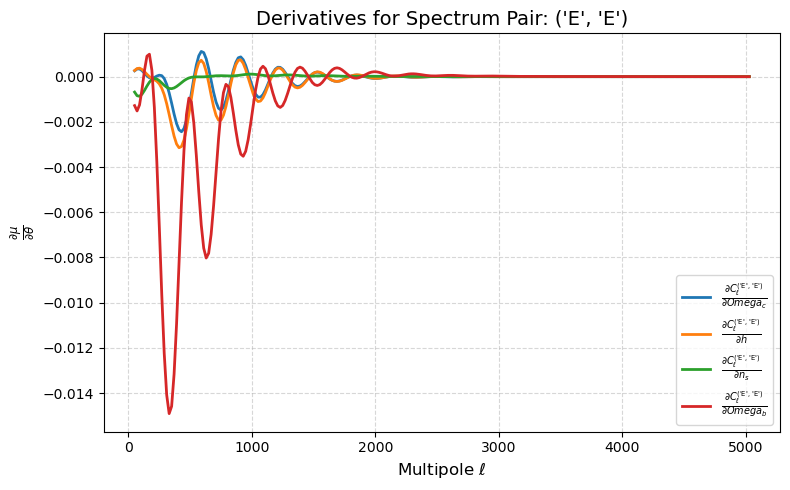

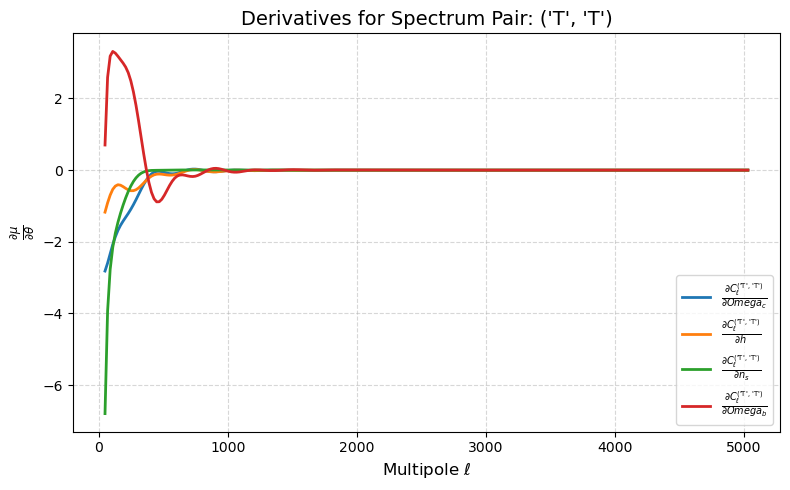

In [44]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_100.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0048$ | $\Omega_m = 0.3027^{+0.0094}_{-0.0094}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3026\pm 0.0048$ | $\Omega_m = 0.3026^{+0.0093}_{-0.0094}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0035$ | $h = 0.6817^{+0.0069}_{-0.0069}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0035$ | $h = 0.6817^{+0.0069}_{-0.0069}$ |
| --- | --- | --- | --- |

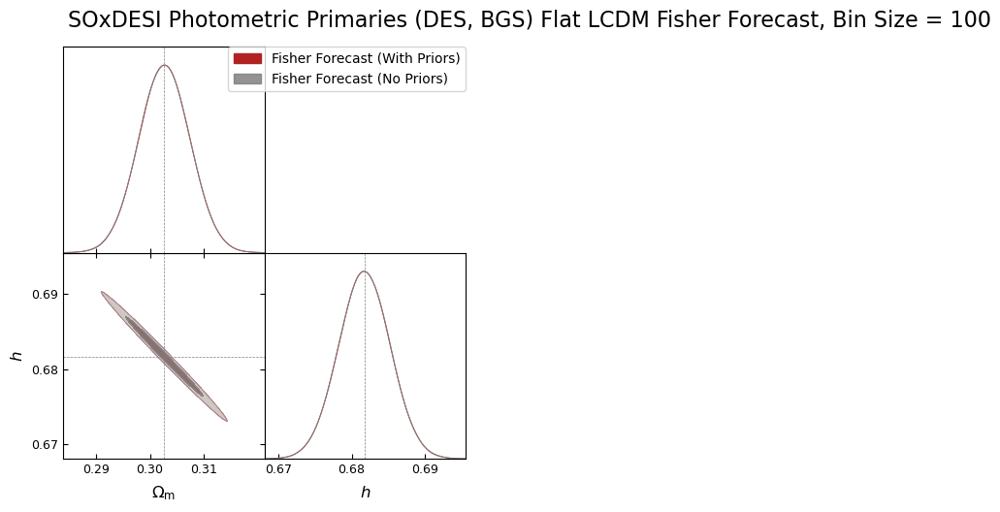

total_time:  0:00:47.644092


In [45]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 


multiplier = 1/3

for key in step_dict:
    step_dict[key] *= multiplier

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_P_Photo_BGS_DESY3_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_P_Photo_BGS_DESY5_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

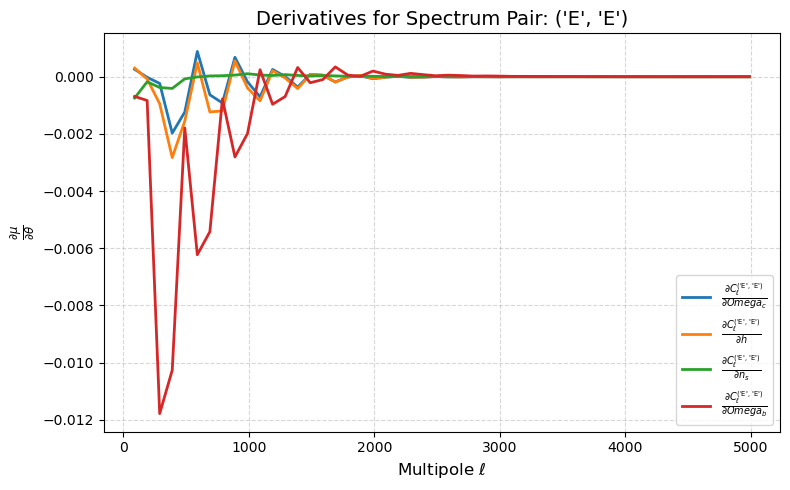

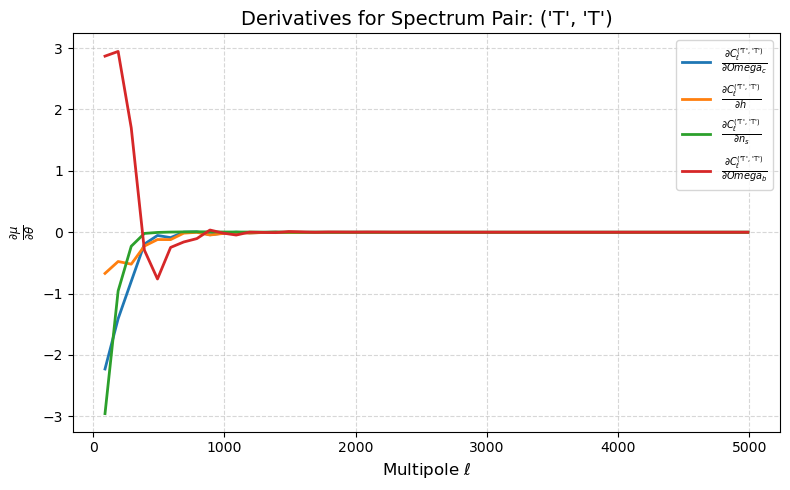

In [46]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_50.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3026\pm 0.0043$ | $\Omega_m = 0.3026^{+0.0085}_{-0.0085}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0043$ | $\Omega_m = 0.3027^{+0.0085}_{-0.0085}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0032$ | $h = 0.6817^{+0.0062}_{-0.0062}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0032$ | $h = 0.6817^{+0.0062}_{-0.0063}$ |
| --- | --- | --- | --- |

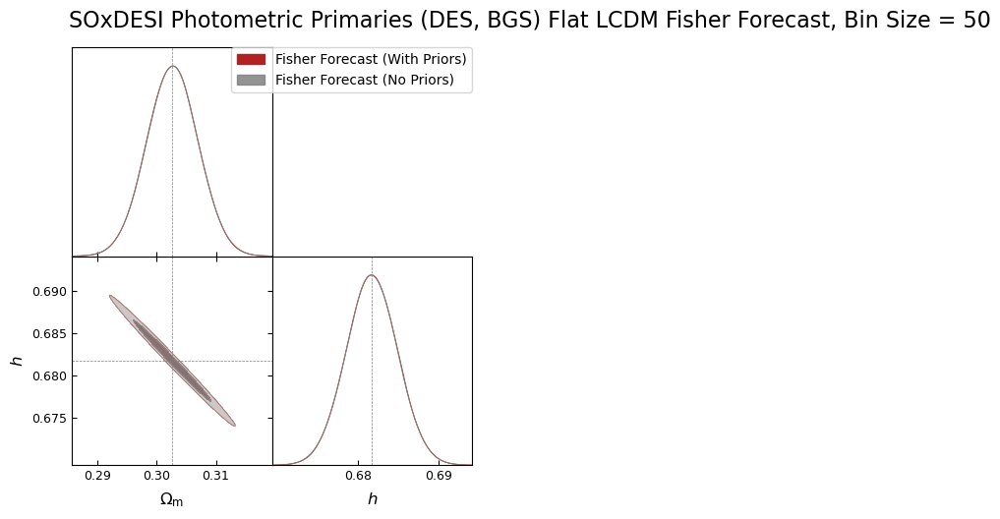

total_time:  0:01:01.285827


In [47]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 

multiplier = 1/3

for key in step_dict:
    step_dict[key] *= multiplier

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_P_Photo_BGS_DESY3_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_P_Photo_BGS_DESY5_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

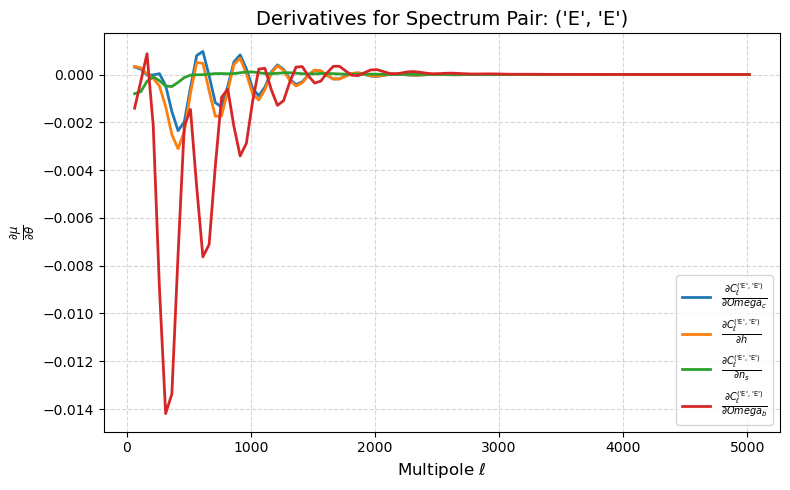

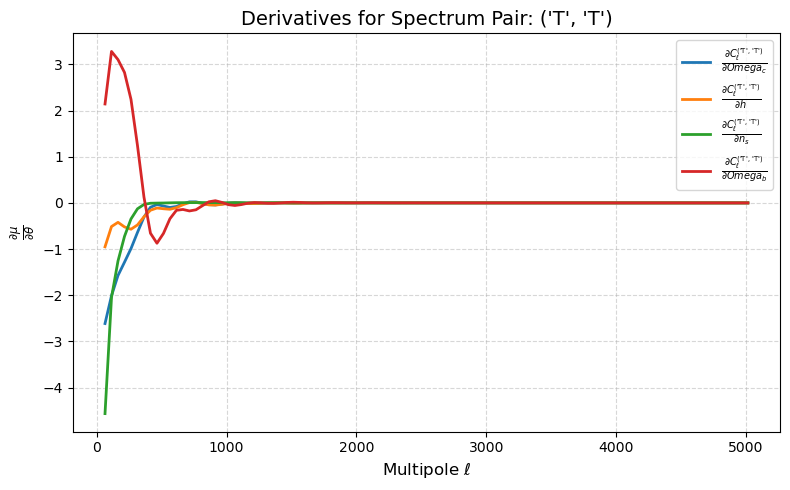

In [48]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)

Converting from derivatives wrt A_s to derivatives wrt log10^10A_s
Plot successfully saved to: plots/Fisher Forecasts/soxdesi_photometric_primaries_(des_bgs)_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0042$ | $\Omega_m = 0.3027^{+0.0083}_{-0.0082}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0042$ | $\Omega_m = 0.3027^{+0.0083}_{-0.0082}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0060}_{-0.0060}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0061}_{-0.0061}$ |
| --- | --- | --- | --- |

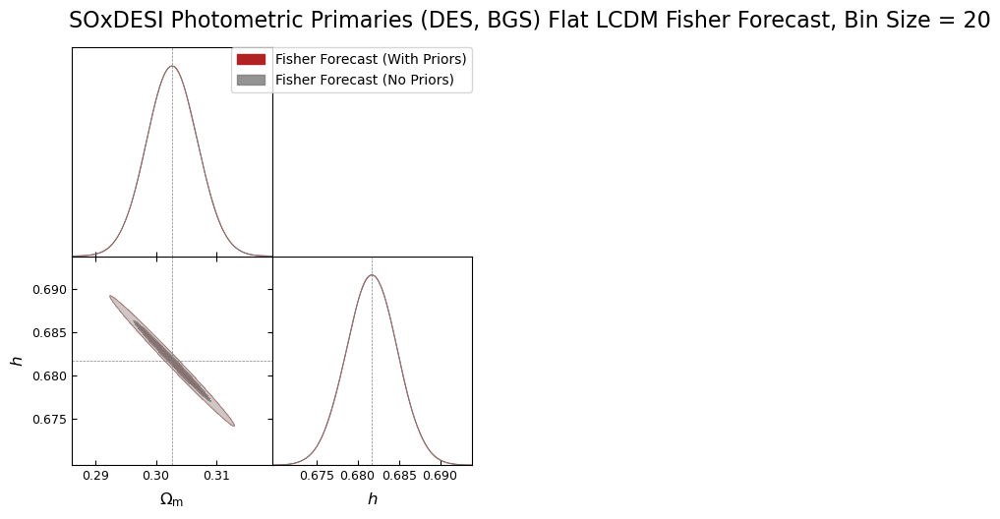

total_time:  0:01:50.643816


In [49]:
start_time = time.time()

step_dict = {'Omega_m': 1e-4, 'A_s': 2e-11, 'h': 1e-3, 'w0': 1e-2, 'wa': 1e-2, 'n_s': 1e-3, 'Omega_b': 1e-4, 
             'Omega_c': 1e-4, 'Omega_k': 1e-3, 'Neff': 1e-2, 'm_nu': 1e-4, 'T_CMB': 1e-2, 'Omega_lambda': 1e-3} 


multiplier = 1/3

for key in step_dict:
    step_dict[key] *= multiplier

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=BGS_distributions,
    source_data=DES_source_data,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky_c = 0.4,
    f_sky_g = 0.4,
    f_sky_l = 0.1,
    f_sky_c_g = 0.295,
    f_sky_c_l = 0.0306,
    f_sky_g_l = 0.0306,
    f_sky_c_g_l = 0.0306,
    magnification_bias_lenses = 0.8,
    linear_emulator=None,
    boost_emulator=None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=DES_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024,
    step_dict = step_dict
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'logA_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_P_Photo_BGS_DESY3_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_P_Photo_BGS_DESY5_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h logA_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, logA_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SOxDESI Photometric Primaries (DES, BGS) Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

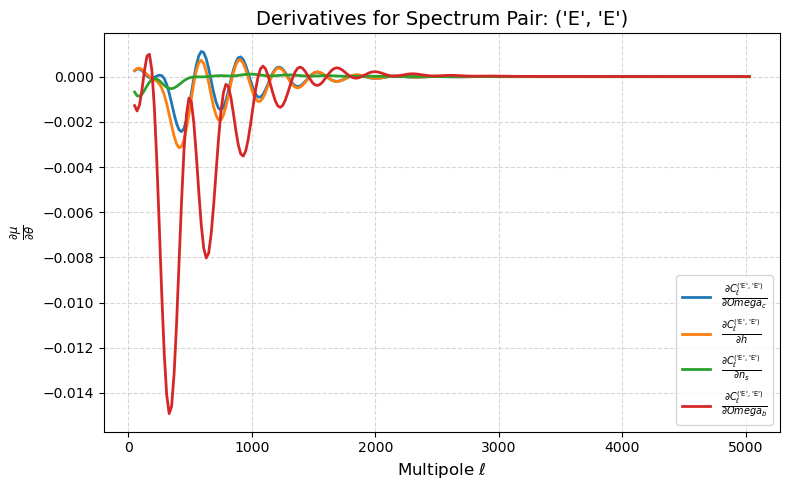

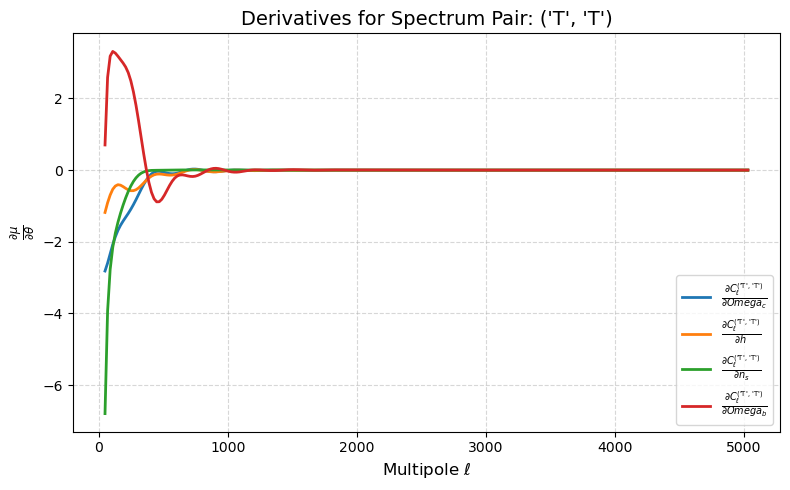

In [50]:
forecaster_c1.plot_derivatives(desired_params=['Omega_c', 'h', 'n_s', 'Omega_b'], normalized=False)